# CHAPTER 1: INTRODUCTION AND PROBLEM STATEMENT

## INTRODUCTION TO THE COMPANY

> This organization is a cutting-edge `ads and marketing solutions provider`, dedicated to helping businesses maximize their `ad performance at minimal costs`. With an innovative, AI-powered platform, it empowers users to seamlessly draft ad copies, design creative assets, dispense ads, and strategize campaigns, offering a streamlined, self-service approach. By leveraging `advanced machine learning techniques`, the platform ensures that ad content resonates deeply with audiences, driving higher engagement, `enhanced click-through rates, and improved ROI`. The company also stands out with patented technology aimed at transforming the ad creation and delivery process, making it efficient, impactful, and economically viable for businesses across diverse sectors.

## DEFINITION OF THE PROBLEM

> The challenge lies in `analyzing and forecasting web traffic patterns` for `Wikipedia pages to optimize ad placement strategies`. With `145,000 multilingual pages` and `daily view data spanning 550 days`, the task involves leveraging time series analysis and machine learning techniques to `predict future page views`. The solution must address `variations in traffic across different regions, languages, and events`, providing actionable insights for ad targeting. By accurately forecasting traffic, businesses can `strategically place ads` to reach their `intended audience effectively, maximizing engagement and minimizing costs`.

## IMPORTING THE LIBRARIES AND DATASET

### Importing all the required libraries

In [136]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings, os
import regex as re
import statsmodels.api as sm
import pickle
from statsmodels.tsa.seasonal import seasonal_decompose
import mlflow
from sklearn.metrics import (
    mean_squared_error as mse,
    mean_absolute_error as mae,
    mean_absolute_percentage_error as mape
)
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

Importing plotly failed. Interactive plots will not work.


### Importing the dataset

In [2]:
data = pd.read_csv(r"C:\Users\saina\Desktop\DS_ML_AI\Scaler\Module_16_ML_Time_Series_Analysis_and_Recomm_sys\Case_Studies\AdEase_Time_Series\dataset\train_1.csv")

In [123]:
data.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [119]:
exog_data = pd.read_csv(r"C:\Users\saina\Desktop\DS_ML_AI\Scaler\Module_16_ML_Time_Series_Analysis_and_Recomm_sys\Case_Studies\AdEase_Time_Series\dataset\Exog_Campaign_eng.csv")

In [125]:
exog_data.head()

,Exog
0,0
1,0
2,0
3,0
4,0


In [4]:
transposed_data = data.copy(deep =True)
transposed_data = transposed_data.set_index('Page')
transposed_data = transposed_data.transpose()
transposed_data.head()

Page,2NE1_zh.wikipedia.org_all-access_spider,2PM_zh.wikipedia.org_all-access_spider,3C_zh.wikipedia.org_all-access_spider,4minute_zh.wikipedia.org_all-access_spider,52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,5566_zh.wikipedia.org_all-access_spider,91Days_zh.wikipedia.org_all-access_spider,A'N'D_zh.wikipedia.org_all-access_spider,AKB48_zh.wikipedia.org_all-access_spider,ASCII_zh.wikipedia.org_all-access_spider,...,Drake_(músico)_es.wikipedia.org_all-access_spider,Skam_(serie_de_televisión)_es.wikipedia.org_all-access_spider,Legión_(serie_de_televisión)_es.wikipedia.org_all-access_spider,Doble_tentación_es.wikipedia.org_all-access_spider,Mi_adorable_maldición_es.wikipedia.org_all-access_spider,Underworld_(serie_de_películas)_es.wikipedia.org_all-access_spider,Resident_Evil:_Capítulo_Final_es.wikipedia.org_all-access_spider,Enamorándome_de_Ramón_es.wikipedia.org_all-access_spider,Hasta_el_último_hombre_es.wikipedia.org_all-access_spider,Francisco_el_matemático_(serie_de_televisión_de_2017)_es.wikipedia.org_all-access_spider
2015-07-01,18.0,11.0,1.0,35.0,NaN,12.0,NaN,118.0,5.0,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-07-02,11.0,14.0,0.0,13.0,NaN,7.0,NaN,26.0,23.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-07-03,5.0,15.0,1.0,10.0,NaN,4.0,NaN,30.0,14.0,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-07-04,13.0,18.0,1.0,94.0,NaN,5.0,NaN,24.0,12.0,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-07-05,14.0,11.0,0.0,4.0,NaN,20.0,NaN,29.0,9.0,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Description regarding data

> There are two csv files given
> 1. train_1.csv : In the csv file, `each row corresponds to a particular article` and `each column corresponds to a particular date`. The values are the `number of visits on that date`.
> 2. The page name contains data in this format: `SPECIFIC NAME _ LANGUAGE.wikipedia.org _ ACCESS TYPE _ ACCESS ORIGIN` having information about page name, the main domain, device type used to access the page, and also the request origin(spider or browser agent)
> 3. Exog_Campaign_eng: This file contains data for the `dates which had a campaign or significant event` that could affect the views for that day. The data is `just for pages in english`. There’s `1 for dates with campaigns and 0 for remaining dates`. It is to be treated as an `exogenous variable` for models when training and forecasting data for `pages in english`.
> 4. Transposed the data because `Timestamp` should in the `row index` and `aggregated view count` of the day should be as `values`.
> 5. Entities like language, domain etc., can be extracted from `Page` column

## ANALYSING BASIC METRICS OF DATASET

### Shape of the data

In [127]:
# data
print(f"Number of rows in the dataset = {data.shape[0]}")
print(f"Number of columns in the dataset = {data.shape[1]}")

Number of rows in the dataset = 145063
Number of columns in the dataset = 551


In [128]:
# exog_data
print(f"Number of rows in the exog_dataset = {exog_data.shape[0]}")
print(f"Number of columns in the exog_dataset = {exog_data.shape[1]}")

Number of rows in the exog_dataset = 550
Number of columns in the exog_dataset = 1


In [129]:
# transposed_data
print(f"Number of rows in the transposed_dataset = {transposed_data.shape[0]}")
print(f"Number of columns in the transposed_dataset = {transposed_data.shape[1]}")

Number of rows in the transposed_dataset = 550
Number of columns in the transposed_dataset = 145063


### Datainfo

In [130]:
#data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


In [131]:
#data
data.dtypes

Page           object
2015-07-01    float64
2015-07-02    float64
2015-07-03    float64
2015-07-04    float64
               ...   
2016-12-27    float64
2016-12-28    float64
2016-12-29    float64
2016-12-30    float64
2016-12-31    float64
Length: 551, dtype: object

In [132]:
# exog_data
exog_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550 entries, 0 to 549
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Exog    550 non-null    int64
dtypes: int64(1)
memory usage: 4.4 KB


In [133]:
# transposed_data
transposed_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 550 entries, 2015-07-01 to 2016-12-31
Columns: 145063 entries, 2NE1_zh.wikipedia.org_all-access_spider to Francisco_el_matemático_(serie_de_televisión_de_2017)_es.wikipedia.org_all-access_spider
dtypes: float64(145063)
memory usage: 608.7+ MB


**Observation:**
> data has 550 days page view data for 145063 articles

> exog_data has details regarding campaign event (only applicable for english language)

### Duplicated Rows Detection

In [134]:
data.duplicated().sum()

np.int64(0)

In [135]:
transposed_data.duplicated().sum()

np.int64(0)

**Observation**
> There are no duplicated row in data and transposed_data. It suggests that every page has unique name and every day has unique combination of counts. 

### Missing value or Null Value Detection

In [136]:
# Null Value count for data
data.isnull().sum()

Page              0
2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
              ...  
2016-12-27     3701
2016-12-28     3822
2016-12-29     3826
2016-12-30     3635
2016-12-31     3465
Length: 551, dtype: int64

In [137]:
# Null Value count for exog_data
exog_data.isnull().sum()

Exog    0
dtype: int64

In [138]:
# Percenatage of Null Values for data
(data.isna().sum() / data.shape[0]) * 100

Page           0.000000
2015-07-01    14.297236
2015-07-02    14.349627
2015-07-03    14.162123
2015-07-04    14.237952
                ...    
2016-12-27     2.551305
2016-12-28     2.634717
2016-12-29     2.637475
2016-12-30     2.505808
2016-12-31     2.388617
Length: 551, dtype: float64

In [139]:
# Filtering the columns which have zero null values and sorting in descending order
def missing_data(data):
    total_missing_data = data.isna().sum().sort_values(ascending = False)
    percentage_missing_data = ((data.isna().sum()/len(data)*100)).sort_values(ascending = False)
    missingdata = pd.concat([total_missing_data, percentage_missing_data],axis = 1, keys=['Total', 'Percent'])
    return missingdata

In [140]:
missing_dataa = missing_data(data)
missing_dataa[missing_dataa["Total"]>0]

,Total,Percent
2015-07-02,20816,14.349627
2015-07-01,20740,14.297236
2015-07-07,20664,14.244845
2015-07-05,20659,14.241399
2015-07-04,20654,14.237952
...,...,...
2016-12-12,3538,2.438940
2016-12-31,3465,2.388617
2016-12-20,3268,2.252814
2016-12-21,3236,2.230755


In [141]:
missing_transposed_data = missing_data(transposed_data)
missing_transposed_data[missing_transposed_data["Total"]>0]

,Total,Percent
Page,,
Francisco_el_matemático_(serie_de_televisión_de_2017)_es.wikipedia.org_all-access_spider,550,100.000000
Hasta_el_último_hombre_es.wikipedia.org_all-access_spider,550,100.000000
陳宣儒_zh.wikipedia.org_all-access_spider,550,100.000000
驚心動魄_(2000年電影)_zh.wikipedia.org_all-access_spider,550,100.000000
幸福來了_zh.wikipedia.org_all-access_spider,550,100.000000
...,...,...
Project:About/id_www.mediawiki.org_all-access_spider,1,0.181818
File:The_Cow_Boy_1888.jpg_commons.wikimedia.org_mobile-web_all-agents,1,0.181818
Tyersal_en.wikipedia.org_all-access_all-agents,1,0.181818


In [142]:
missing_transposed_data[missing_transposed_data["Total"]==550].shape

(652, 2)

In [143]:
missing_transposed_data[missing_transposed_data["Total"]< 250].shape

(133520, 2)

**Observation:**
> All 550 days have some null values. Minimum 2.19% to 14.34% rows have null values for each day. We should not drop the date columns because continuity and step size of date is crucial in time series analysis.

> If we observe less% of null values for latest dates and higher percentage of null values for older dates. So we need to plot the count of null values with respect to date. 

> According to transposed data, There are 652 articles with no page views during these 550 days. There are 133520 articles with page views data for atleast 300 Non Null days (less than 250 day nulls).

> We can drop these article rows by taking atleast 300 Non Null days as threshold. But before that lets check null values before the start of first view count for every page.

### Descriptive Statistics

In [144]:
# data
data.describe()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
count,1.243230e+05,1.242470e+05,1.245190e+05,1.244090e+05,1.244040e+05,1.245800e+05,1.243990e+05,1.247690e+05,1.248190e+05,1.247210e+05,...,1.412100e+05,1.414790e+05,1.418740e+05,1.413190e+05,1.411450e+05,1.413620e+05,1.412410e+05,1.412370e+05,1.414280e+05,1.415980e+05
mean,1.195857e+03,1.204004e+03,1.133676e+03,1.170437e+03,1.217769e+03,1.290273e+03,1.239137e+03,1.193092e+03,1.197992e+03,1.189651e+03,...,1.394096e+03,1.377482e+03,1.393099e+03,1.523740e+03,1.679607e+03,1.678302e+03,1.633966e+03,1.684308e+03,1.467943e+03,1.478282e+03
std,7.275352e+04,7.421515e+04,6.961022e+04,7.257351e+04,7.379612e+04,8.054448e+04,7.576288e+04,6.820002e+04,7.149717e+04,7.214536e+04,...,8.574880e+04,7.732794e+04,8.478533e+04,8.752210e+04,9.794534e+04,9.232482e+04,9.185831e+04,9.014266e+04,8.155481e+04,8.873567e+04
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.300000e+01,1.300000e+01,1.200000e+01,1.300000e+01,1.400000e+01,1.100000e+01,1.300000e+01,1.300000e+01,1.400000e+01,1.400000e+01,...,2.200000e+01,2.200000e+01,2.000000e+01,2.100000e+01,2.200000e+01,2.300000e+01,2.400000e+01,2.300000e+01,2.300000e+01,2.100000e+01
50%,1.090000e+02,1.080000e+02,1.050000e+02,1.050000e+02,1.130000e+02,1.130000e+02,1.150000e+02,1.170000e+02,1.150000e+02,1.130000e+02,...,1.490000e+02,1.430000e+02,1.320000e+02,1.450000e+02,1.600000e+02,1.620000e+02,1.630000e+02,1.600000e+02,1.540000e+02,1.360000e+02
75%,5.240000e+02,5.190000e+02,5.040000e+02,4.870000e+02,5.400000e+02,5.550000e+02,5.510000e+02,5.540000e+02,5.490000e+02,5.450000e+02,...,6.070000e+02,5.980000e+02,5.690000e+02,6.280000e+02,6.590000e+02,6.680000e+02,6.540000e+02,6.490000e+02,6.350000e+02,5.610000e+02
max,2.038124e+07,2.075219e+07,1.957397e+07,2.043964e+07,2.077211e+07,2.254467e+07,2.121089e+07,1.910791e+07,1.999385e+07,2.020182e+07,...,2.420108e+07,2.253925e+07,2.505662e+07,2.586575e+07,2.834288e+07,2.691699e+07,2.702505e+07,2.607382e+07,2.436397e+07,2.614954e+07


In [145]:
data.describe(include = 'object')

,Page
count,145063
unique,145063
top,Francisco_el_matemático_(serie_de_televisión_d...
freq,1


In [146]:
transposed_data.describe()

Page,2NE1_zh.wikipedia.org_all-access_spider,2PM_zh.wikipedia.org_all-access_spider,3C_zh.wikipedia.org_all-access_spider,4minute_zh.wikipedia.org_all-access_spider,52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,5566_zh.wikipedia.org_all-access_spider,91Days_zh.wikipedia.org_all-access_spider,A'N'D_zh.wikipedia.org_all-access_spider,AKB48_zh.wikipedia.org_all-access_spider,ASCII_zh.wikipedia.org_all-access_spider,...,Drake_(músico)_es.wikipedia.org_all-access_spider,Skam_(serie_de_televisión)_es.wikipedia.org_all-access_spider,Legión_(serie_de_televisión)_es.wikipedia.org_all-access_spider,Doble_tentación_es.wikipedia.org_all-access_spider,Mi_adorable_maldición_es.wikipedia.org_all-access_spider,Underworld_(serie_de_películas)_es.wikipedia.org_all-access_spider,Resident_Evil:_Capítulo_Final_es.wikipedia.org_all-access_spider,Enamorándome_de_Ramón_es.wikipedia.org_all-access_spider,Hasta_el_último_hombre_es.wikipedia.org_all-access_spider,Francisco_el_matemático_(serie_de_televisión_de_2017)_es.wikipedia.org_all-access_spider
count,550.000000,550.000000,550.000000,550.000000,259.000000,550.000000,185.000000,550.000000,550.000000,550.000000,...,54.000000,35.000000,25.000000,16.000000,3.000000,6.000000,0.0,0.0,0.0,0.0
mean,21.756364,25.392727,5.203636,17.125455,10.277992,16.412727,19.691892,49.650909,35.007273,22.327273,...,12.203704,14.142857,6.800000,40.437500,7.000000,9.333333,NaN,NaN,NaN,NaN
std,29.390758,33.984813,13.505932,19.337118,24.133992,15.674589,20.263943,50.656186,21.124230,9.291190,...,17.633993,8.934872,14.857658,52.492499,12.124356,4.320494,NaN,NaN,NaN,NaN
min,3.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,5.000000,2.000000,...,0.000000,3.000000,0.000000,0.000000,0.000000,3.000000,NaN,NaN,NaN,NaN
25%,11.000000,13.000000,2.000000,9.000000,3.000000,9.000000,8.000000,18.000000,24.000000,16.000000,...,3.000000,8.000000,1.000000,2.250000,0.000000,6.250000,NaN,NaN,NaN,NaN
50%,16.000000,17.000000,4.000000,13.000000,5.000000,13.500000,12.000000,34.500000,31.000000,22.000000,...,5.500000,11.000000,2.000000,18.500000,0.000000,11.000000,NaN,NaN,NaN,NaN
75%,22.000000,27.000000,5.000000,18.750000,9.000000,19.000000,22.000000,63.750000,41.000000,28.000000,...,13.750000,18.000000,4.000000,52.250000,10.500000,12.750000,NaN,NaN,NaN,NaN
max,490.000000,621.000000,210.000000,303.000000,234.000000,213.000000,121.000000,520.000000,203.000000,62.000000,...,86.000000,46.000000,61.000000,166.000000,21.000000,13.000000,NaN,NaN,NaN,NaN


In [147]:
exog_data.describe()

,Exog
count,550.000000
mean,0.098182
std,0.297831
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


**Observation:**
> There are 145063 unique articles.

> Median page views for almost all the days are around 100 to 200 views.

> Max page views for almost all the days are around 2 X 10^7 to 3 X 10^7 Views.

> If we observe count in describe, Initial days in 2015 has articles around 1.24 x 10^5 . But at the end of 2016 has articles around 1.41 x 10^5. This indicates that Overall Number of articles has increase in these 550 days. (i.e., New wikipedia pages are evolved in these 550 days). It also indicates that Newly created articles will have null values for old days. Should check the null value time series plot for better understanding.

> Mean and median are highly distinct for all the days. It indicates outlier pages are present.    

# CHAPTER 2: PRELIMINARY DATA PREPROCESSING AND EDA

## NULL VALUE IMPUTATION

### Null value time series plot

In [148]:
data.isnull().sum()

Page              0
2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
              ...  
2016-12-27     3701
2016-12-28     3822
2016-12-29     3826
2016-12-30     3635
2016-12-31     3465
Length: 551, dtype: int64

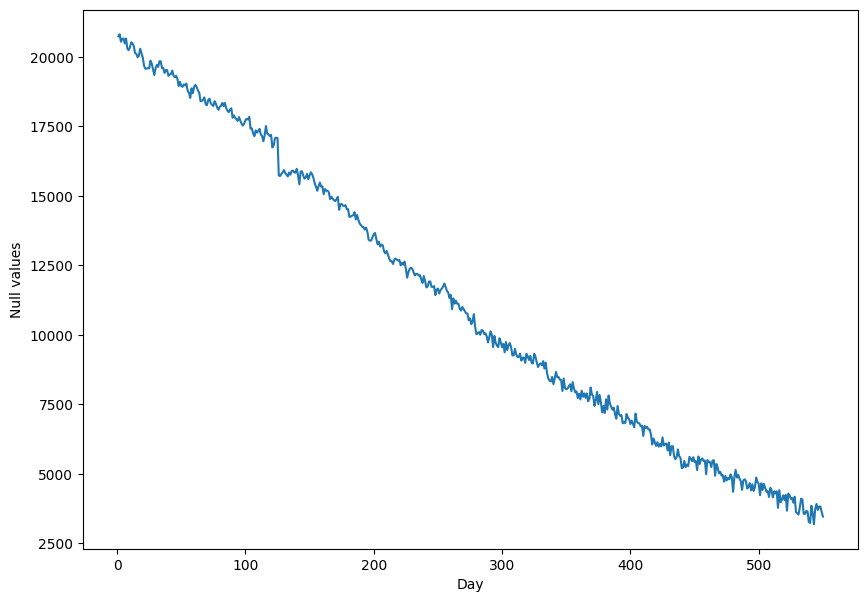

In [149]:
days = [r for r in range(1, len(data.columns))]
plt.figure(figsize=(10,7))
plt.xlabel('Day')
plt.ylabel('Null values')
plt.plot(days, data.isnull().sum()[1:])

**Obseravtion:**
> Null values are decreasing from 0th day to 550th day. This clearly indicates that newly added articles have null values for previous old days. 

### Removing the pages with all Nulls

In [310]:
data_cleaned = data.copy(deep = True)

In [311]:
print(data_cleaned.shape)

# Drop rows where all date columns (after the first column) are NaN
data_cleaned = data_cleaned.dropna(subset=data_cleaned.columns[1:], how='all')

print(data_cleaned.shape)

(145063, 551)
(144411, 551)


### Replace leading and trailing Nans

In [312]:
def fill_leading_trailing_nans(row):
    # Get the first and last valid indices
    first_non_nan_idx = row.first_valid_index()
    last_non_nan_idx = row.last_valid_index()

    # Fill leading NaNs with 0
    if first_non_nan_idx is not None:
        row[:first_non_nan_idx] = 0

    # Fill trailing NaNs with 0
    if last_non_nan_idx is not None and last_non_nan_idx != row.index[-1]:
        # Use index-based slicing correctly without DateOffset
        row[row.index.get_loc(last_non_nan_idx) + 1:] = 0

    return row

# Apply the function to all rows except the 'Page' column
data_cleaned.iloc[:, 1:] = data_cleaned.iloc[:, 1:].apply(fill_leading_trailing_nans, axis=1)


In [313]:
data_cleaned.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,0.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,0.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,0.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,0.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


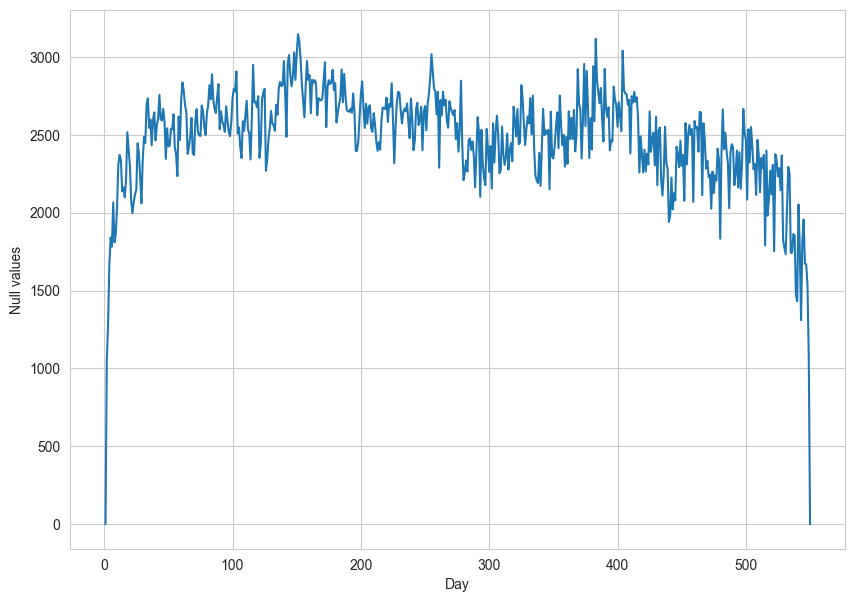

In [314]:
days = [r for r in range(1, len(data_cleaned.columns))]
plt.figure(figsize=(10,7))
plt.xlabel('Day')
plt.ylabel('Null values')
plt.plot(days, data_cleaned.isnull().sum()[1:])

**Observation**
> Initial date and final date null values became 0 because of `fill_leading_and_trailing_nans`

In [315]:
missing_data_cleaned = missing_data(data_cleaned)
missing_data_cleaned[missing_data_cleaned["Total"]>0]

,Total,Percent
2015-11-28,3146,2.178504
2016-07-17,3117,2.158423
2015-11-29,3102,2.148036
2016-08-07,3040,2.105103
2015-11-25,3029,2.097486
...,...,...
2016-12-21,1431,0.990922
2016-12-24,1310,0.907133
2015-07-03,1288,0.891899
2016-12-30,1077,0.745788


In [316]:
missing_transposed_data_cleaned = missing_data(data_cleaned.set_index('Page').transpose())
missing_transposed_data_cleaned[missing_transposed_data_cleaned["Total"]>0]

,Total,Percent
Page,,
Resident_Evil:_The_Final_Chapter_de.wikipedia.org_desktop_all-agents,525,95.454545
Resident_Evil:_The_Final_Chapter_de.wikipedia.org_all-access_all-agents,525,95.454545
Resident_Evil:_The_Final_Chapter_de.wikipedia.org_all-access_spider,525,95.454545
Mount_Tiantai_(disambiguation)_en.wikipedia.org_all-access_all-agents,509,92.545455
Datei:Varno_katedralo.jpg_de.wikipedia.org_mobile-web_all-agents,509,92.545455
...,...,...
Día_de_los_Programadores_es.wikipedia.org_all-access_spider,1,0.181818
Beautiful_Mind_zh.wikipedia.org_all-access_spider,1,0.181818
Legión_(Marvel_Comics)_es.wikipedia.org_all-access_spider,1,0.181818


In [317]:
missing_transposed_data_cleaned[(missing_transposed_data_cleaned["Percent"]<10)&(missing_transposed_data_cleaned["Percent"]>0)]

,Total,Percent
Page,,
File:002_-_Al-Baqara.ogg_commons.wikimedia.org_mobile-web_all-agents,54,9.818182
Category:Intel_8080_commons.wikimedia.org_all-access_spider,54,9.818182
Owen's_laminated_organ_en.wikipedia.org_all-access_all-agents,54,9.818182
Commons:Picture_of_the_Year/2015/R1/Gallery/Nature_views_commons.wikimedia.org_desktop_all-agents,54,9.818182
Help:CirrusSearch/bn_www.mediawiki.org_all-access_all-agents,54,9.818182
...,...,...
Día_de_los_Programadores_es.wikipedia.org_all-access_spider,1,0.181818
Beautiful_Mind_zh.wikipedia.org_all-access_spider,1,0.181818
Legión_(Marvel_Comics)_es.wikipedia.org_all-access_spider,1,0.181818


**Observation**
> After removing leading and trailing nans as well as the pages with all nans, We can observe the Percentage of missing nans gone down below 2.17%.

> And also we can observe that now there is no order in Date index in missing_data_cleaned. This indicates that intermediate Nans are distributed randomly for every page.

> But still there around 15591 pages with atleast one NaN value. Many pages have more than 500 NaN values in it. So using interpolation or moving average methods may introduce artificial trends in the pages. So better check valid view count between first and last valid index.

In [318]:
# Define a function to calculate the number of valid (non-null) values between first and last valid index
def count_valid_values(row):
    # Get the first and last valid indices
    first_valid_idx = row.first_valid_index()
    last_valid_idx = row.last_valid_index()
    
    # Check if both indices are valid
    if first_valid_idx is not None and last_valid_idx is not None:
        # Count non-null (valid) values between first and last valid index
        valid_count = row.loc[first_valid_idx:last_valid_idx].notnull().sum()
        return valid_count
    
    # Return None if no valid indices
    return None

# Apply the function to count valid values across all rows except 'Page' column
valid_value_counts = data_cleaned.iloc[:, 1:].apply(count_valid_values, axis=1)

# Create a DataFrame to store results
valid_stats = pd.DataFrame({
    'Page': data_cleaned['Page'],
    'Valid_Count': valid_value_counts
})


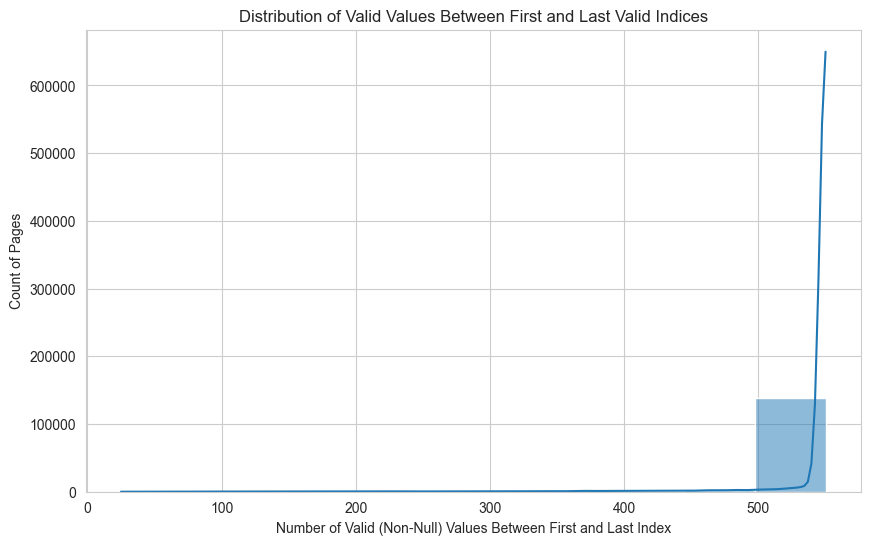

count    144411.000000
mean        540.554792
std          45.866659
min          25.000000
25%         550.000000
50%         550.000000
75%         550.000000
max         550.000000
Name: Valid_Count, dtype: float64
                                                 Page  Valid_Count
52  File:427FW_126.JPG_zh.wikipedia.org_all-access...          281
53  File:Ap_F23_20110324114153669.jpg_zh.wikipedia...          244
54  File:Christian-krohg-leiv-eriksson.jpg_zh.wiki...          203
55  File:Sebastiaosalgado2006.jpg_zh.wikipedia.org...           95
56  File:Zhongxiao_West_Road2.JPG_zh.wikipedia.org...          287


In [319]:
# Plot the distribution of valid counts
plt.figure(figsize=(10, 6))
sns.histplot(valid_stats['Valid_Count'], bins=10, kde=True)
plt.xlabel('Number of Valid (Non-Null) Values Between First and Last Index')
plt.ylabel('Count of Pages')
plt.title('Distribution of Valid Values Between First and Last Valid Indices')
plt.show()

# Print summary stats for valid counts
print(valid_stats['Valid_Count'].describe())

# Optional: View pages with low valid counts if needed
low_valid_pages = valid_stats[valid_stats['Valid_Count'] < 500]  # Threshold can be adjusted
print(low_valid_pages[['Page', 'Valid_Count']].head())

In [320]:
sum(valid_stats['Valid_Count']<250)

1210

**Observation**
> As there are some pages , which have lower valid view count between first and last valid index. It is better to replace the intermediate nan values with Centered moving average.

> As CMA , cannot remove NaN, If all the values in its window size are NaN. Then We can replace remained NaN as zero because those are the pages which are not active frequently.

### Filling intermediate NaNs Using CMA and 0

In [321]:
def fill_na_with_cma(row):
    row_filled = row.copy()
    # Compute rolling mean
    rolling_mean = row.rolling(window=10, min_periods=1, center=True).mean()
    # Fill only NaN values with rolling mean
    row_filled[row.isna()] = rolling_mean[row.isna()]
    return row_filled

# Apply the function to all rows except 'Page' column
data_cleaned.iloc[:, 1:] = data_cleaned.iloc[:, 1:].apply(fill_na_with_cma, axis=1)

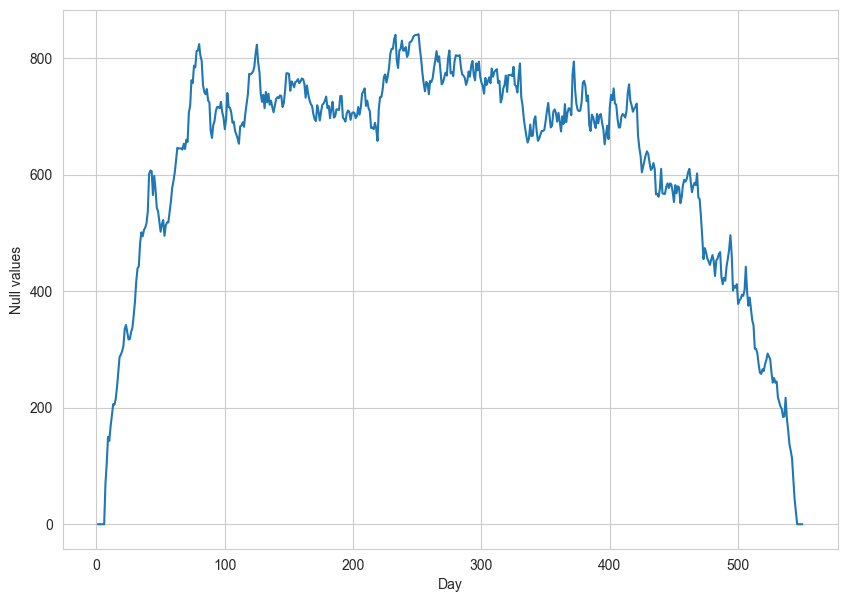

In [322]:
days = [r for r in range(1, len(data_cleaned.columns))]
plt.figure(figsize=(10,7))
plt.xlabel('Day')
plt.ylabel('Null values')
plt.plot(days, data_cleaned.isnull().sum()[1:])

**Observation**
> Null values decreased from 2500 range to 800 range after CMA.

In [323]:
# fill the remaining NaN values with 0
data_cleaned.iloc[:, 1:] = data_cleaned.iloc[:, 1:].fillna(0)

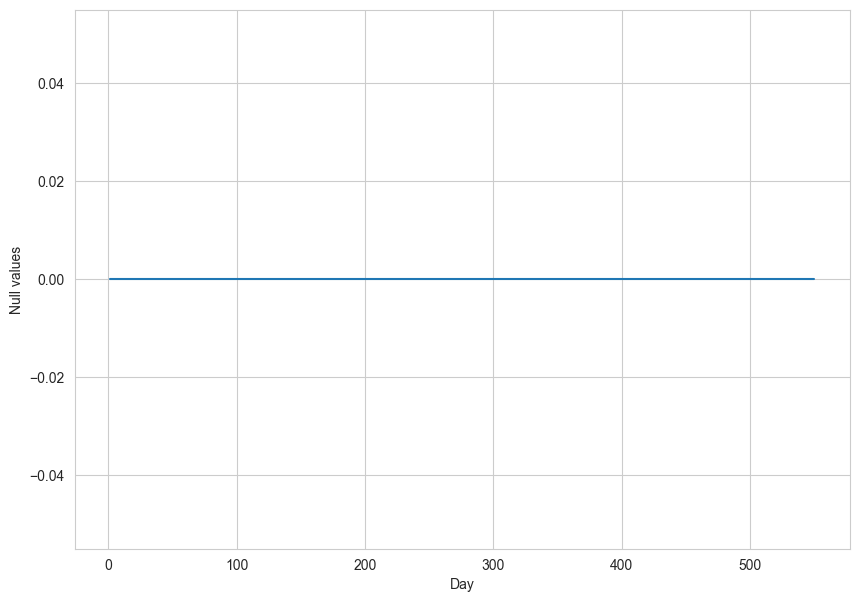

In [324]:
days = [r for r in range(1, len(data_cleaned.columns))]
plt.figure(figsize=(10,7))
plt.xlabel('Day')
plt.ylabel('Null values')
plt.plot(days, data_cleaned.isnull().sum()[1:])

In [325]:
missing_data_cleaned = missing_data(data_cleaned)
missing_data_cleaned[missing_data_cleaned["Total"]>0]

,Total,Percent


In [326]:
missing_transposed_data_cleaned = missing_data(data_cleaned.set_index('Page').transpose())
missing_transposed_data_cleaned[missing_transposed_data_cleaned["Total"]>0]

,Total,Percent
Page,,


**Observation**
> All Null values are handled.

## CLEANING THE PAGE COLUMN AND EXTRACTING FEATURES

### Format

In [327]:
data_cleaned["Page"].iloc[0]

'2NE1_zh.wikipedia.org_all-access_spider'

In [328]:
data_cleaned["Page"].iloc[1000]

'李晨_(演员)_zh.wikipedia.org_all-access_spider'

**Observation:**
> According to description of dataset, Page column is in the following format

> `SPECIFIC NAME _ LANGUAGE.wikipedia.org _ ACCESS TYPE _ ACCESS ORIGIN`.

**Example**
>  `2NE1_zh.wikipedia.org_all-access_spider`

> Specific Name searched in wikipedia = `2NE1`

> Language = `zh`

> Wikipedia website domain = `wikipedia.org`

> Access_type = `all-access`

> Access_origin = `spider`

> But it is better to check the punctuations and format in detailedly and then apply the regex code which is suitable for all cases

### Check non-alphanumeric count for each page

In [329]:
modified_data = data_cleaned.copy(deep = True)

In [330]:
# Set display options to show all rows and full column width
pd.set_option('display.max_rows', None)  # Show all rows (None means no limit)
pd.set_option('display.max_colwidth', None)  # Show full column content without truncation
pd.set_option('display.width', None)  # Adjust width to avoid wrapping

# Function to count non-alphanumeric characters
def count_non_alphanumeric(page):
    return len(re.findall(r'[^a-zA-Z0-9]', page))

# Apply the function to count non-alphanumeric characters for each Page
modified_data['NonAlphaNumCount'] = modified_data['Page'].apply(count_non_alphanumeric)

# Group by the count of non-alphanumeric characters and take one example from each group
sampled_modified_data = modified_data.groupby('NonAlphaNumCount').first().reset_index()

# Display the result
sampled_modified_data[['Page', 'NonAlphaNumCount']]


,Page,NonAlphaNumCount
0,2NE1_zh.wikipedia.org_all-access_spider,6
1,Apple_II_zh.wikipedia.org_all-access_spider,7
2,A'N'D_zh.wikipedia.org_all-access_spider,8
3,Ahq_e-Sports_Club_zh.wikipedia.org_all-access_spider,9
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,10
5,File:Christian-krohg-leiv-eriksson.jpg_zh.wikipedia.org_all-access_spider,11
6,All_your_base_are_belong_to_us_zh.wikipedia.org_all-access_spider,12
7,亞斯伯格症候群_zh.wikipedia.org_all-access_spider,13
8,NO_GAME_NO_LIFE_遊戲人生_zh.wikipedia.org_all-access_spider,14
9,金秀賢_(男演員)_zh.wikipedia.org_all-access_spider,15


**Observations**
> We can clearly see in each non-alpha-numeric group example that it follows `SPECIFIC NAME _ LANGUAGE.wikipedia.org _ ACCESS TYPE _ ACCESS ORIGIN`.

> We should write regex concentrating the splits from trailing edge side. So that all the entities are extracted properly and Specific name will have variable length with multipe non-alpha-numeric characters in it. 

In [331]:
# just created this column for understanding all cases of page formats
modified_data.drop("NonAlphaNumCount", axis = 1, inplace = True)

In [332]:
# Reset all pandas display options to default
pd.reset_option("all")

C:\Users\saina\AppData\Local\Temp\ipykernel_21892\1684668160.py:2: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option("all")
C:\Users\saina\AppData\Local\Temp\ipykernel_21892\1684668160.py:2: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option("all")


### regex extraction of features from `Page` column

In [333]:
def extract_details(page):
    # Updated regex to capture language dynamically without hardcoding 'commons' or 'www'
    match = re.match(r"^(.*?)_([a-zA-Z\-]+?)\.([a-z\.]+)_([a-z0-9\-]*?)_([a-z0-9\-]*?)$", page)
    if match:
        specific_name = match.group(1)  # Extracts the page name
        language = match.group(2)       # Dynamically extracts language
        domain = match.group(3)         # Extracts the domain
        access_type = match.group(4)    # Extracts the access type
        access_origin = match.group(5)  # Extracts the access origin
        return specific_name, language, domain, access_type, access_origin
    else:
        return None, None, None, None, None

# Example usage
page = "2NE1_zh.wikipedia.org_all-access_spider"
result = extract_details(page)
print(result)

page2 = "Resident_Evil:_The_Final_Chapter_en.wikipedia.org_desktop_all-agents"
result2 = extract_details(page2)
print(result2)

page3 = "Илья_Репин_-_Портрет_Всеволод_Михайлович_Гаршин.jpg_commons.wikimedia.org_all-access_spider"
result3 = extract_details(page3)
print(result3)

('2NE1', 'zh', 'wikipedia.org', 'all-access', 'spider')
('Resident_Evil:_The_Final_Chapter', 'en', 'wikipedia.org', 'desktop', 'all-agents')
('Илья_Репин_-_Портрет_Всеволод_Михайлович_Гаршин.jpg', 'commons', 'wikimedia.org', 'all-access', 'spider')


In [334]:
# Apply extract_details and directly add the results to new columns
modified_data['Title'], modified_data['Language'], modified_data['Domain'], modified_data['Access_type'], modified_data['Access_origin'] = zip(*modified_data['Page'].apply(lambda x: extract_details(str(x))))


In [335]:
modified_data.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,Title,Language,Domain,Access_type,Access_origin
0,2NE1_zh.wikipedia.org_all-access_spider,0.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,20.0,22.0,19.0,18.0,20.0,2NE1,zh,wikipedia.org,all-access,spider
1,2PM_zh.wikipedia.org_all-access_spider,0.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,30.0,52.0,45.0,26.0,20.0,2PM,zh,wikipedia.org,all-access,spider
2,3C_zh.wikipedia.org_all-access_spider,0.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,4.0,6.0,3.0,4.0,17.0,3C,zh,wikipedia.org,all-access,spider
3,4minute_zh.wikipedia.org_all-access_spider,0.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,11.0,17.0,19.0,10.0,11.0,4minute,zh,wikipedia.org,all-access,spider
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.0,27.0,13.0,36.0,10.0,52_Hz_I_Love_You,zh,wikipedia.org,all-access,spider


## EXPLORATORY DATA ANALYSIS

In [336]:
modified_data.describe(include='object')

,Page,Title,Language,Domain,Access_type,Access_origin
count,144411,144411,144411,144411,144411,144411
unique,144411,48874,9,3,3,2
top,Underworld_(serie_de_películas)_es.wikipedia.o...,Special:Search,en,wikipedia.org,all-access,all-agents
freq,1,35,24010,126683,74002,109630


In [337]:
sum(modified_data.isna().sum())

0

In [338]:
for i in ['Title', 'Language', 'Domain', 'Access_type', 'Access_origin']:
    print(f"Unique values in {i} are {modified_data[i].unique()}")
    print("\n")

Unique values in Title are ['2NE1' '2PM' '3C' ... 'Verführt_–_In_den_Armen_eines_Anderen'
 'ジャック・リーチャー' 'マイク眞木']


Unique values in Language are ['zh' 'fr' 'en' 'commons' 'ru' 'www' 'de' 'ja' 'es']


Unique values in Domain are ['wikipedia.org' 'wikimedia.org' 'mediawiki.org']


Unique values in Access_type are ['all-access' 'desktop' 'mobile-web']


Unique values in Access_origin are ['spider' 'all-agents']




**Observation:**
> Extracted the features from `Page` Feature. No Null values are created because of carefull creation Regex pattern which is suitable for all cases of Page Format

> In language, There is `commons` - relaeted to wikipedia-commons which is a repository for freely licensed media files (e.g., images, videos, and audio).It does not correspond to a specific language but serves as a global media repository for Wikimedia projects.

> Similarly In language, There is `www` - indicates general access or cases not tied to a specific language (e.g., a global or default entry point).

> As we are doing multilingual analysis, Lets give these two `commons and www` as `unknown` language.  

> There are 3 types of wiki domains, 2 types of access_types and 2 types of access origins

> Domain: Represents the specific Wikimedia project, e.g., wikipedia.org (encyclopedia), wikimedia.org (general foundation resources), or mediawiki.org (technical documentation).

>Access_type: Indicates the platform used to access the content, e.g., all-access (any device), desktop, or mobile-web.

>Access_origin: Specifies the user type or traffic source, e.g., spider (search engine bots) or all-agents (all users, including human and bots).

In [339]:
# Create a map to replace the language code with corresponding language

language_map = {
    "en": "English",
    "ja": "Japanese",
    "de": "German",
    "fr": "French",
    "zh": "Chinese",
    "ru": "Russian",
    "es": "Spanish",
    "commons": "Unknown",
    "www": "Unknown"
}

modified_data["Language"] =modified_data["Language"].replace(to_replace=language_map)

### Univariate Count plots

<Axes: xlabel='count', ylabel='Language'>

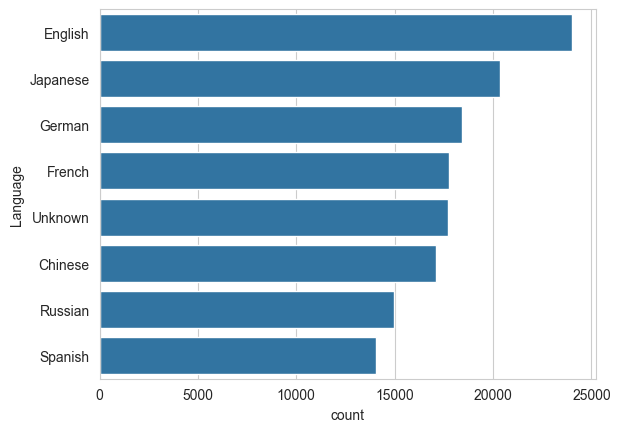

In [340]:
sns.countplot(modified_data['Language'], order = modified_data['Language'].value_counts().index)

<Axes: xlabel='count', ylabel='Domain'>

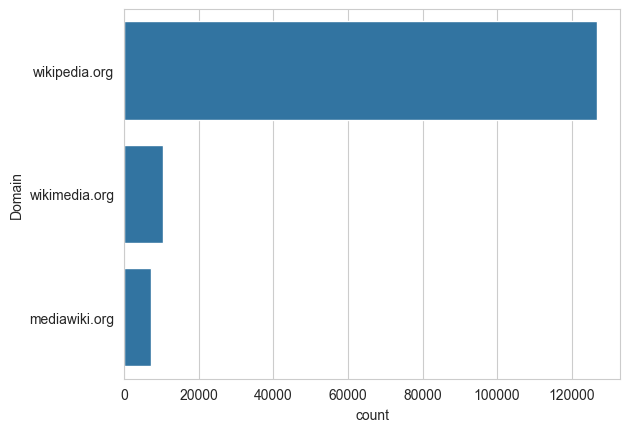

In [341]:
sns.countplot(modified_data['Domain'],order=modified_data['Domain'].value_counts().index)

<Axes: xlabel='count', ylabel='Access_type'>

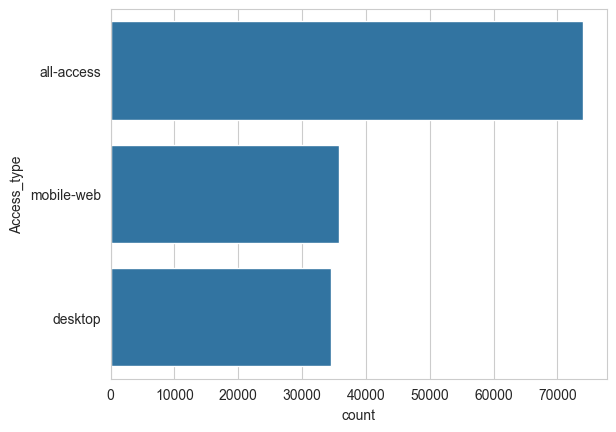

In [342]:
sns.countplot(modified_data['Access_type'],order=modified_data['Access_type'].value_counts().index)

<Axes: xlabel='count', ylabel='Access_origin'>

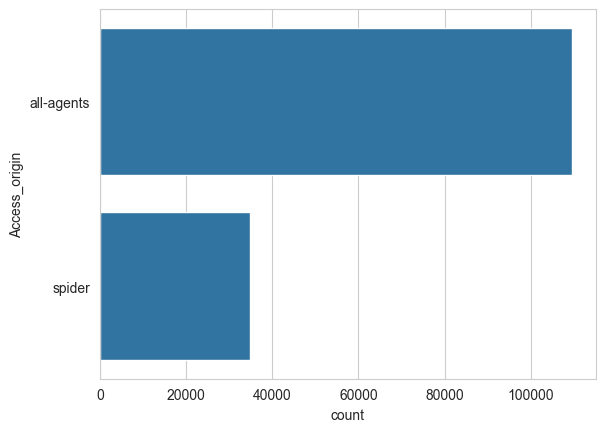

In [343]:
sns.countplot(modified_data['Access_origin'],order=modified_data['Access_origin'].value_counts().index)

**Observations**
> `English, Japanese, German` are top 3 languages according count plot.

> Very less pages are coming from `wikimedia.org and mediawiki.org`

> `all-access` is dominating `Access_type`

> `all-agents` is dominating `Access_origin` 

### Bivariate Count Plots

<Axes: xlabel='Language', ylabel='count'>

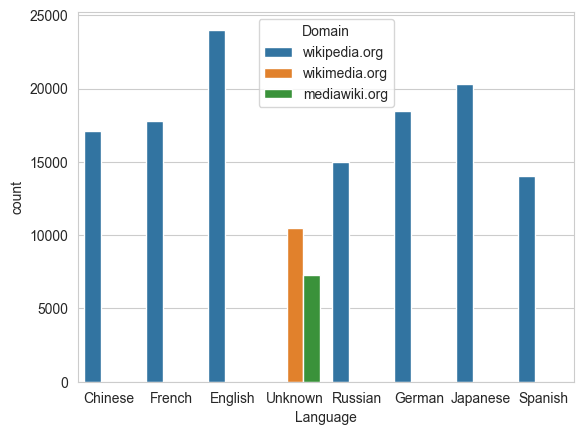

In [344]:
sns.countplot(data=modified_data,x="Language",hue="Domain")

**Observation**
> All the unknown language pages are coming from wikimedia.org and mediawiki.org.

> While aggregating the data, we can drop the unknown language, Because time series forecasting of unknown language is not suitable for ad recommendations. 

<Axes: xlabel='Language', ylabel='count'>

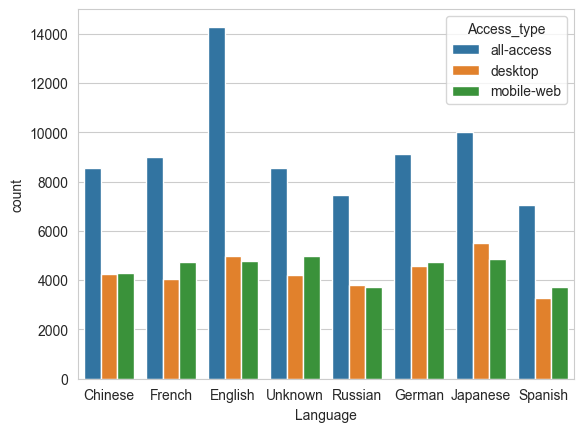

In [345]:
sns.countplot(data=modified_data,x="Language",hue="Access_type")

<Axes: xlabel='Language', ylabel='count'>

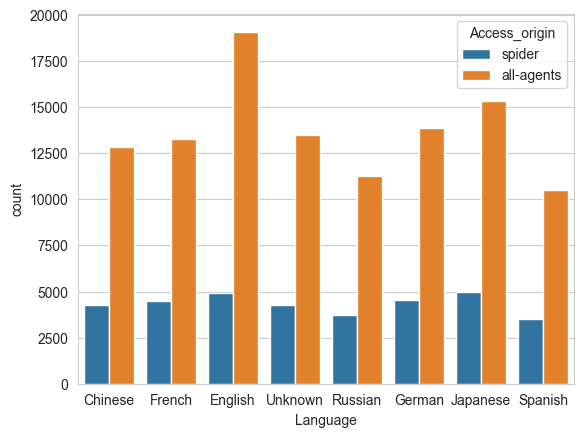

In [346]:
sns.countplot(data=modified_data,x="Language",hue="Access_origin")

**Observations**
> Access_types and Access_origins are evenly distributed across all the languages.

In [ ]:
modified_data.to_pickle("modified_data.pkl")

In [6]:
modified_data = pd.read_pickle("modified_data.pkl")

## GROUPING AND PIVOTING THE DATA USING LANGUAGE FOR MULTI-LINGUAL TIME SERIES ANALYSIS

### Aggregate by mean

In [7]:
agg_data_means = modified_data.groupby(by="Language")[modified_data.columns[1:-5]].mean().T
agg_data_means.drop(columns=["Unknown"],inplace=True)
agg_data_means.index = pd.to_datetime(agg_data_means.index)
agg_data_means.head()

Language,Chinese,English,French,German,Japanese,Russian,Spanish
2015-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-07-02,242.771056,3516.780357,479.305445,709.398476,669.633505,642.276171,1039.950081
2015-07-03,241.094731,3338.938535,460.901163,680.884159,604.985805,595.299301,956.414693
2015-07-04,243.432951,3476.209814,492.529676,624.821004,759.882547,559.924221,897.778484
2015-07-05,259.688309,3590.139865,483.692623,726.348556,728.949241,596.047317,976.452352


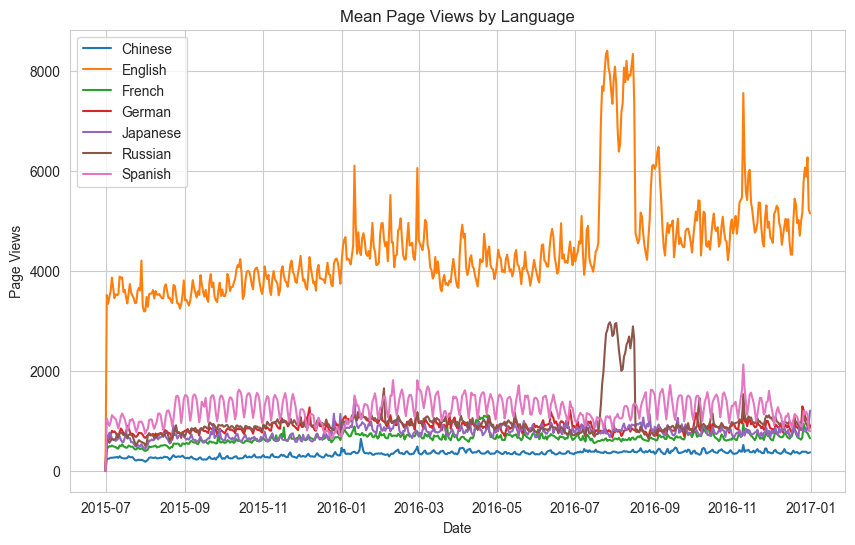

In [8]:
sns.set_style("whitegrid")
plt.figure(figsize=(10,6))
plt.plot(agg_data_means)
plt.title("Mean Page Views by Language")
plt.xlabel("Date")
plt.ylabel("Page Views")
plt.legend(agg_data_means.columns)

**Observation**
> During the months of August 2016, Spikes are observed in daily average view for English and Russian Pages.

> During November 2016, Spikes are observed for English and Slightly for other languages too.

> Trend, seasonality , change points are observed particularly in English Pages.

> May be change points observed in between Jan and March of 2016 in English Pages. 

> Some sudden down shift observed at beginning of March 2016 in English Pages.

### Aggregate by sum

In [9]:
agg_data_sum = modified_data.groupby(by="Language")[modified_data.columns[1:-5]].sum().T
agg_data_sum.drop(columns=["Unknown"],inplace=True)
agg_data_sum.index = pd.to_datetime(agg_data_sum.index)
agg_data_sum.head()

Language,Chinese,English,French,German,Japanese,Russian,Spanish
2015-07-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2015-07-02,4.152113e+06,8.443790e+07,8.512944e+06,1.307989e+07,1.362035e+07,9.627720e+06,1.460194e+07
2015-07-03,4.123443e+06,8.016791e+07,8.186066e+06,1.255414e+07,1.230541e+07,8.923537e+06,1.342902e+07
2015-07-04,4.163434e+06,8.346380e+07,8.747820e+06,1.152045e+07,1.545601e+07,8.393264e+06,1.260571e+07
2015-07-05,4.441449e+06,8.619926e+07,8.590865e+06,1.339241e+07,1.482683e+07,8.934749e+06,1.371037e+07


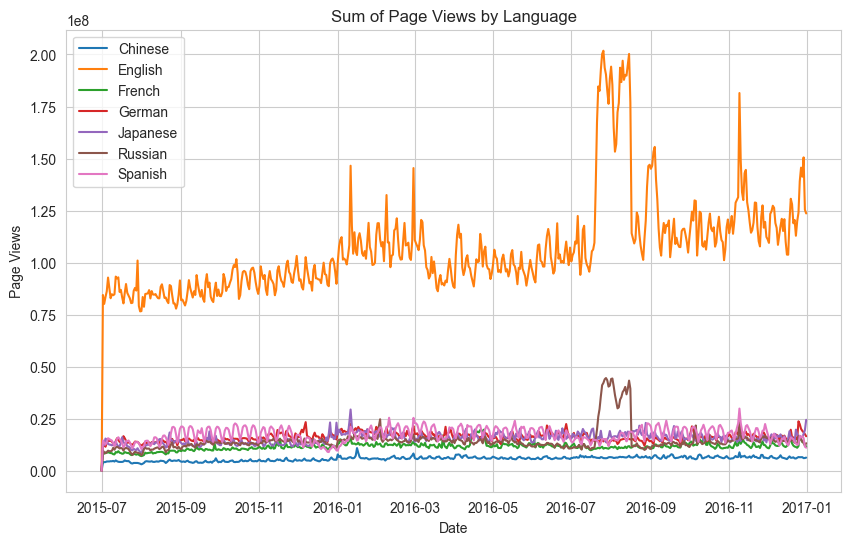

In [10]:
sns.set_style("whitegrid")
plt.figure(figsize=(10,6))
plt.plot(agg_data_sum)
plt.title("Sum of Page Views by Language")
plt.xlabel("Date")
plt.ylabel("Page Views")
plt.legend(agg_data_sum.columns)

### Aggregate by median

In [11]:
agg_data_median = modified_data.groupby(by="Language")[modified_data.columns[1:-5]].median().T
agg_data_median.drop(columns=["Unknown"],inplace=True)
agg_data_median.index = pd.to_datetime(agg_data_median.index)
agg_data_median.head()

Language,Chinese,English,French,German,Japanese,Russian,Spanish
2015-07-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-07-02,30.0,102.0,72.0,64.0,124.0,136.0,264.0
2015-07-03,29.0,92.0,72.0,61.0,130.0,138.0,239.0
2015-07-04,30.0,90.0,71.0,62.0,141.0,136.0,200.0
2015-07-05,32.0,95.0,79.0,73.0,140.0,142.0,239.0


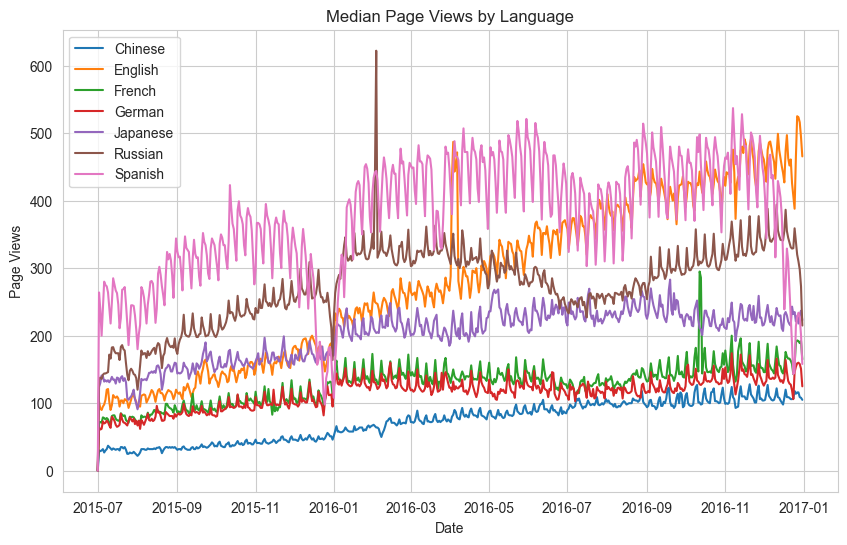

In [12]:
sns.set_style("whitegrid")
plt.figure(figsize=(10,6))
plt.plot(agg_data_median)
plt.title("Median Page Views by Language")
plt.xlabel("Date")
plt.ylabel("Page Views")
plt.legend(agg_data_median.columns)

**Observation**
> Since a lot of zero values are introduced after filling NaN, the median may consistently end up being 0 or close to 0 in such cases. This leads to an underestimation of the actual trend.

> So among sum and mean , Mean is proper aggregation for time series forecasting as sum inflates with outliers. 

## ANOMALY DETECTION

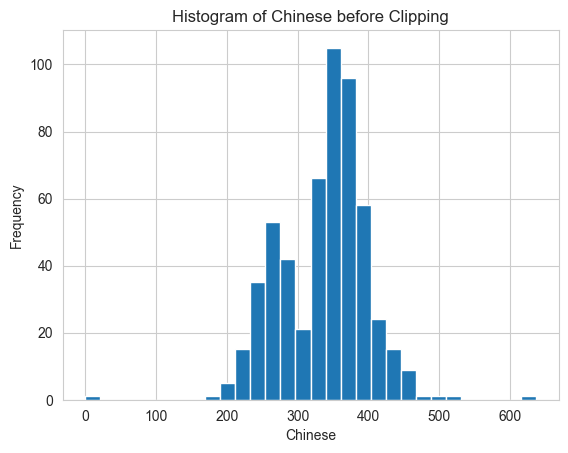

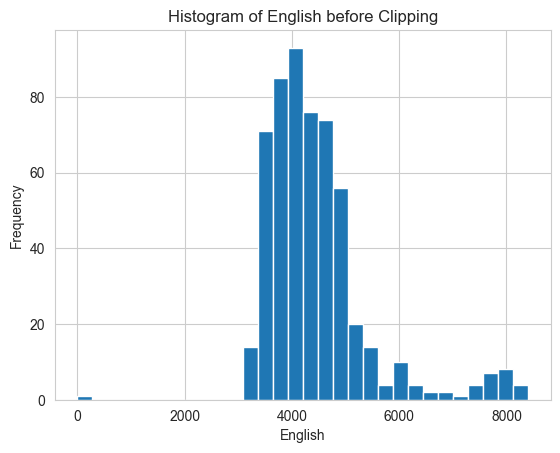

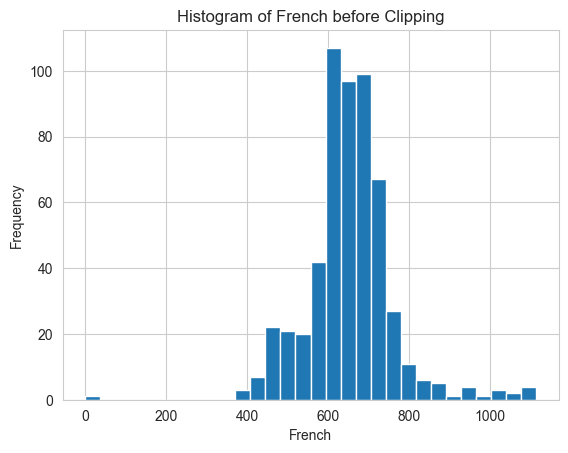

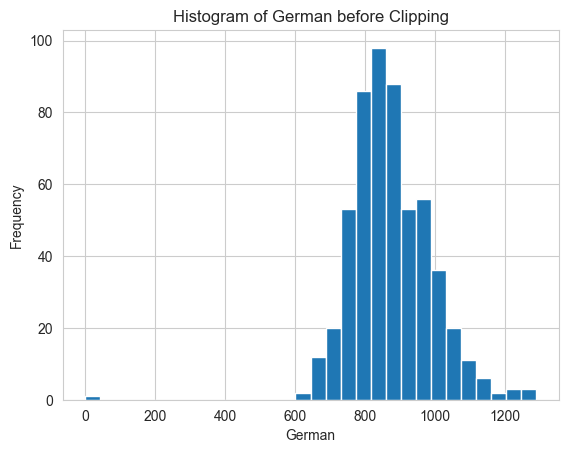

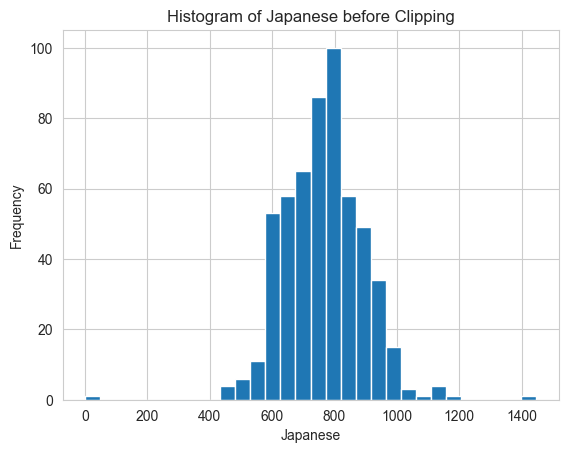

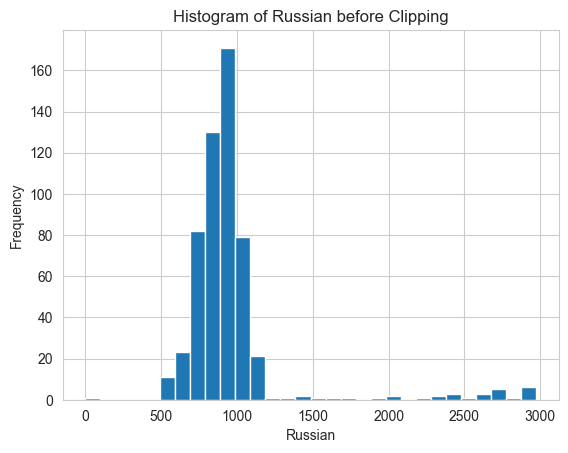

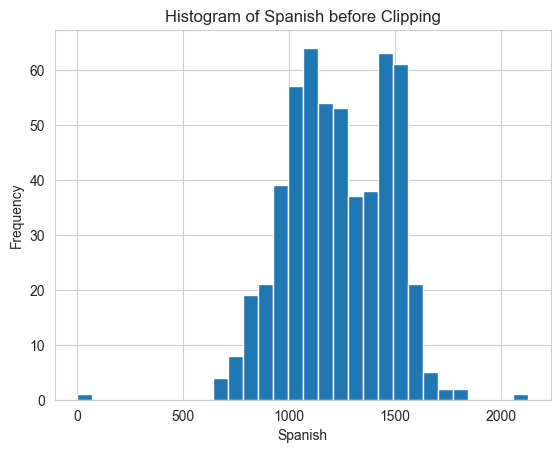

In [13]:
for col in agg_data_means.columns:
    agg_data_means[col].hist(bins= 30)
    plt.title(f"Histogram of {col} before Clipping")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

**Observation**
> Even after aggregating the data, We have anomalies on both sides.

> Particularly on Lower limit side, Mean of page views are in single digits. These are outliers. So better to clip them using quanitle method. 

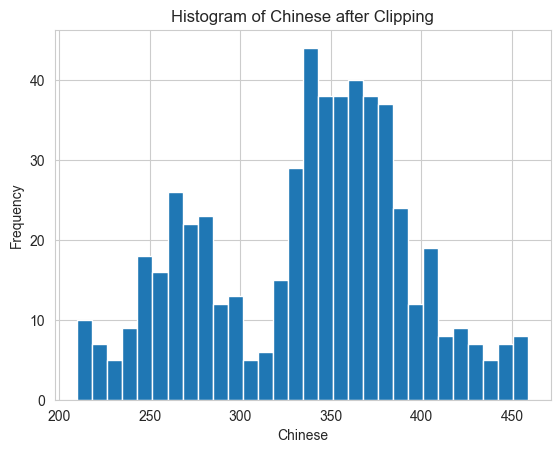

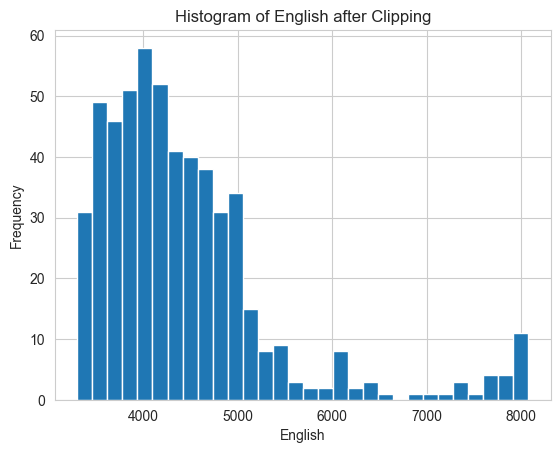

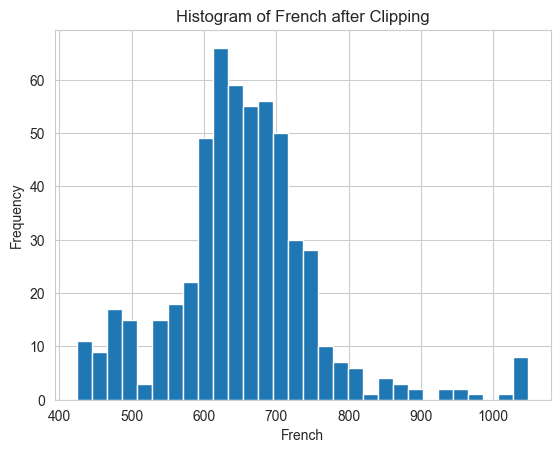

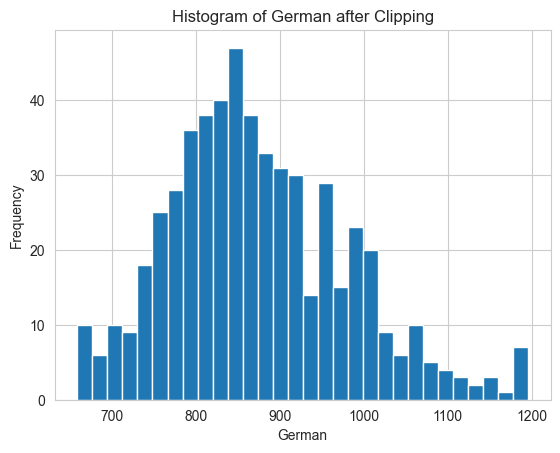

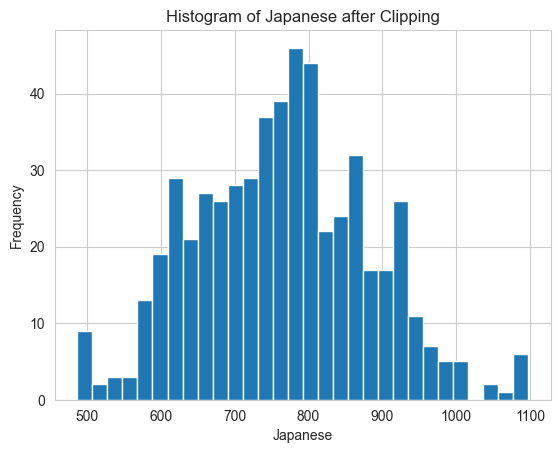

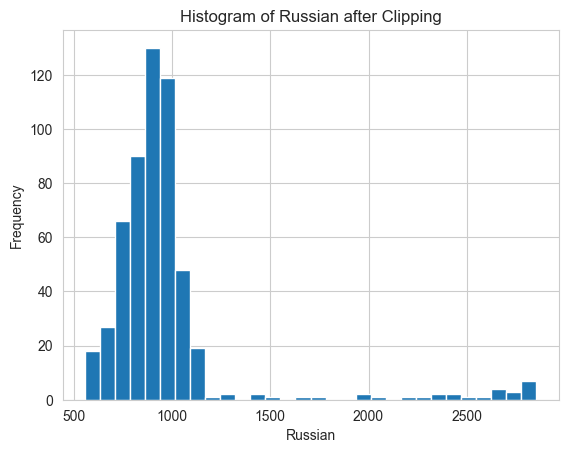

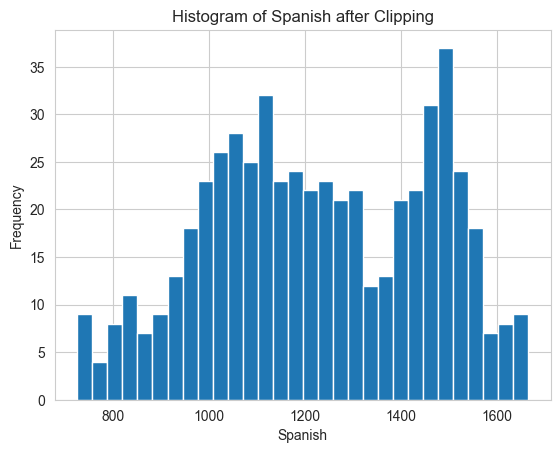

In [14]:
# Create a dictionary to store clipped data for each column
clipped_data_dict = {}

# Clip values between 1st and 99th percentiles and plot
for col in agg_data_means.columns:    
    # Calculate 1st and 99th quantile values
    lower_limit = agg_data_means[col].quantile(0.01)
    upper_limit = agg_data_means[col].quantile(0.99)
    
    # Clip values within the range
    clipped_data = agg_data_means[col].clip(lower=lower_limit, upper=upper_limit)
    
    # Save clipped data to a dictionary with column name as the key
    clipped_data_dict[col] = clipped_data
    
    # Plot histogram after clipping
    clipped_data.hist(bins=30)
    plt.title(f"Histogram of {col} after Clipping")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()


In [19]:
with open("clipped_data_dict.pkl", "wb") as f:
    pickle.dump(clipped_data_dict, f)

In [ ]:
# with open("clipped_data_dict.pkl", "rb") as f:
#     clipped_data_dict = pickle.load(f)

# CHAPTER 3: TIME SERIES DECOMPOSITION, STATIONARITY AND SEASONALITY ANALYSIS

## HYPOTHESIS TESTING - STATIONARITY CHECK

* **Null Hypothesis** - Time Series is Non-Stationary
* **Alternate Hypothesis** - Time Series is Stationary
* **Significant value** - 0.05 (alpha)
* If **p-value > 0.05** - Failed to reject Null hypothesis i.e., Time series is Non Stationary
* If **p-value <= 0.05** - Reject the Null hypothesis i.e., Time series is Stationary

**Augmented Dickey Fuller** test is suitable than **Dickey Fuller** test because
    
    - it considers auto correlation by adding lag term
    - More robust and accurate 

In [15]:
def Augmented_Dickey_Fuller(timeseries, significance_level=0.05):
    # Perform ADF test
    dftest = sm.tsa.stattools.adfuller(timeseries, autolag='AIC')

    # Create summary of ADF results
    df_output = pd.Series(dftest[0:4], 
                          index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    
    # Add critical values
    for key, value in dftest[4].items():
        df_output[f'Critical Value ({key})'] = value

    # Print ADF results
    print("Results of Augmented Dickey-Fuller Test:")
    print(df_output)

    # Stationarity check based on p-value
    p_value = dftest[1]
    if p_value <= significance_level:
        print(f"Time Series is Stationary (p-value: {p_value:.5f} ≤ {significance_level})")
    else:
        print(f"Time Series is NOT Stationary (p-value: {p_value:.5f} > {significance_level})")


In [16]:
# Apply ADF test on clipped data stored in clipped_data_dict
for language in clipped_data_dict.keys():
    print(f"Performing ADF Test for: {language}")
    
    # Run ADF test on the clipped data
    Augmented_Dickey_Fuller(clipped_data_dict[language])
    
    # Add a blank line for better readability
    print()


Performing ADF Test for: Chinese
Results of Augmented Dickey-Fuller Test:
Test Statistic                  -1.621236
p-value                          0.472081
#Lags Used                      19.000000
Number of Observations Used    530.000000
Critical Value (1%)             -3.442749
Critical Value (5%)             -2.867009
Critical Value (10%)            -2.569683
dtype: float64
Time Series is NOT Stationary (p-value: 0.47208 > 0.05)

Performing ADF Test for: English
Results of Augmented Dickey-Fuller Test:
Test Statistic                  -2.267602
p-value                          0.182630
#Lags Used                      14.000000
Number of Observations Used    535.000000
Critical Value (1%)             -3.442632
Critical Value (5%)             -2.866957
Critical Value (10%)            -2.569655
dtype: float64
Time Series is NOT Stationary (p-value: 0.18263 > 0.05)

Performing ADF Test for: French
Results of Augmented Dickey-Fuller Test:
Test Statistic                  -2.813052
p-val

## TIME SERIES DECOMPOSITION

### Plot ACF and PACF to find Period for seasonal decompose

ACF and PACF Plots for Chinese


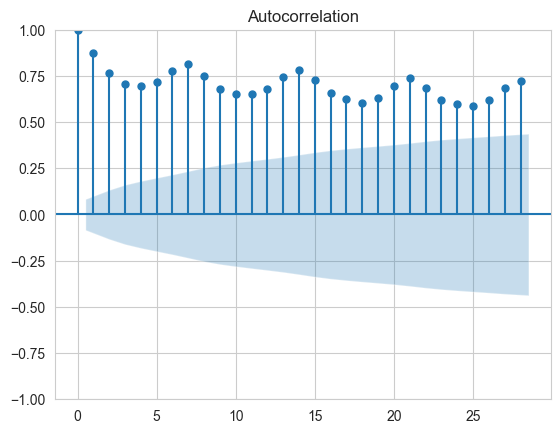

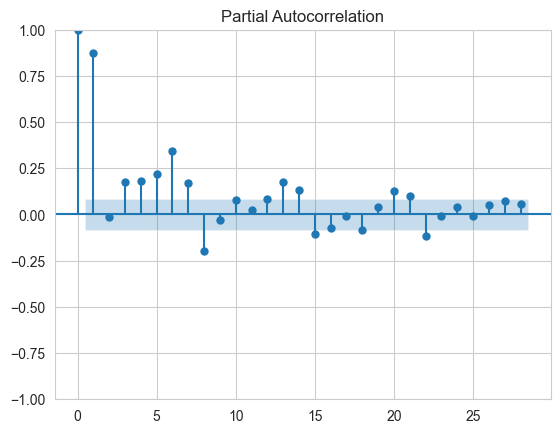

ACF and PACF Plots for English


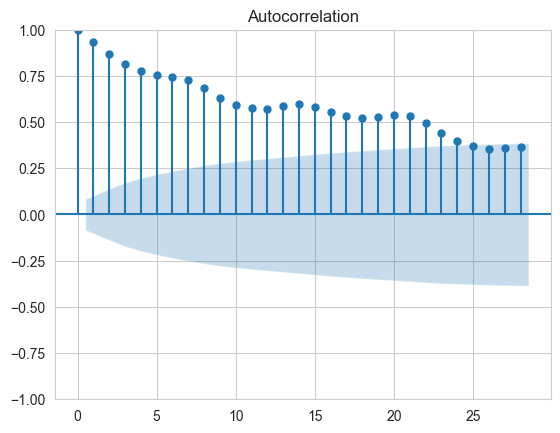

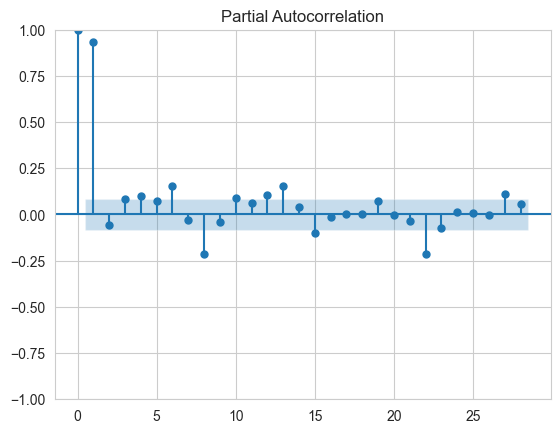

ACF and PACF Plots for French


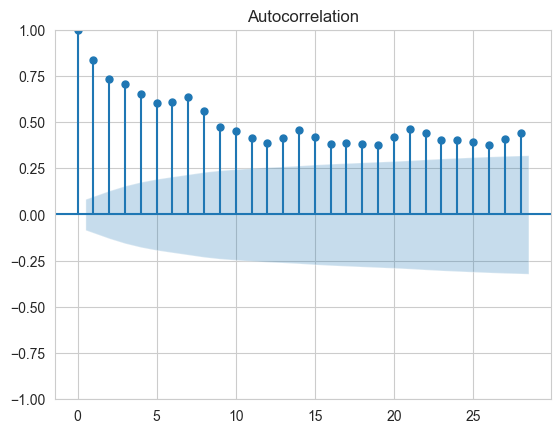

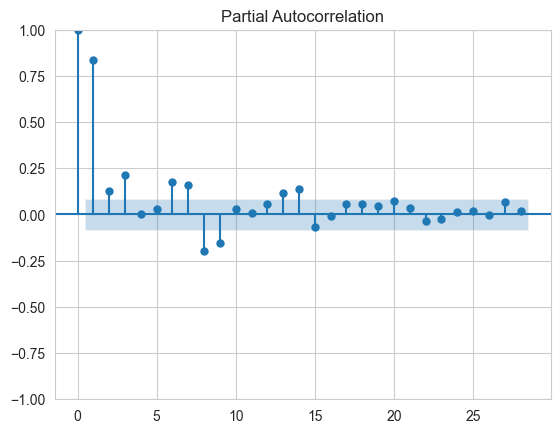

ACF and PACF Plots for German


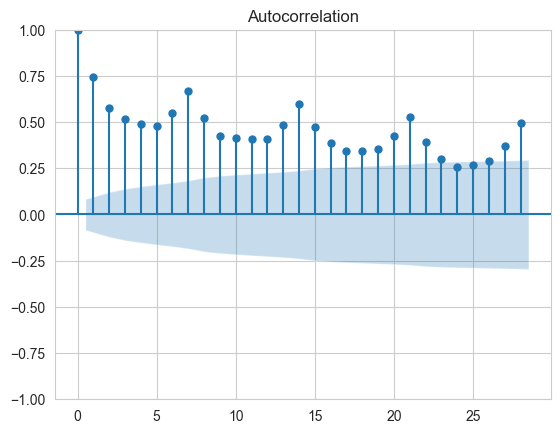

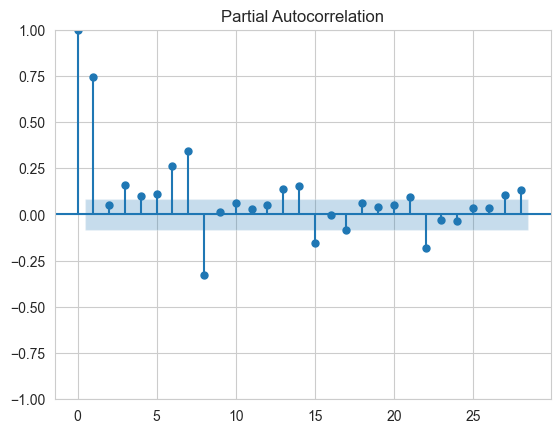

ACF and PACF Plots for Japanese


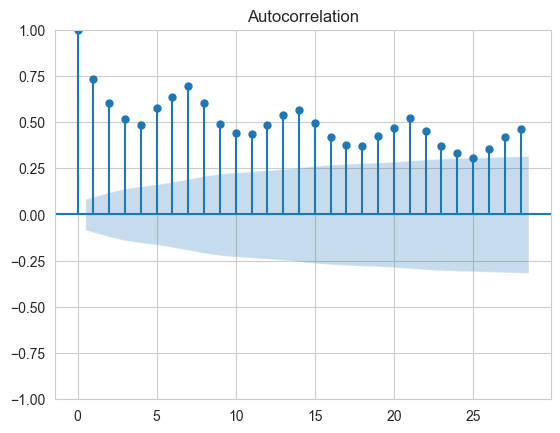

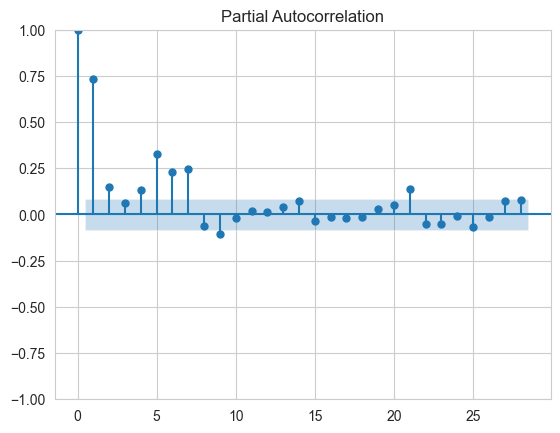

ACF and PACF Plots for Russian


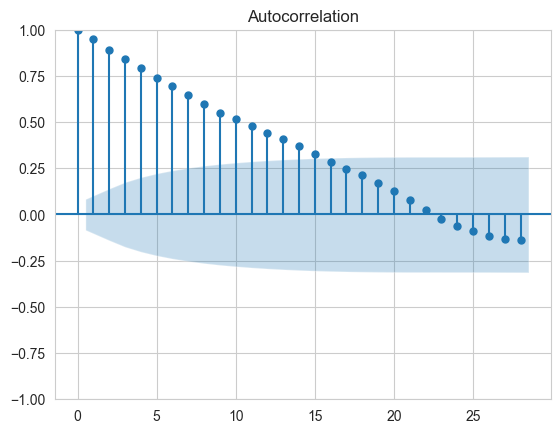

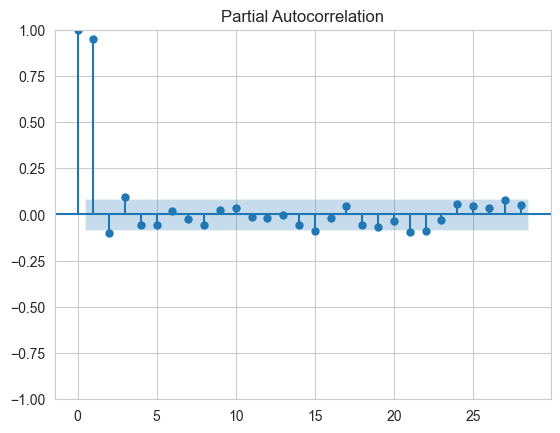

ACF and PACF Plots for Spanish


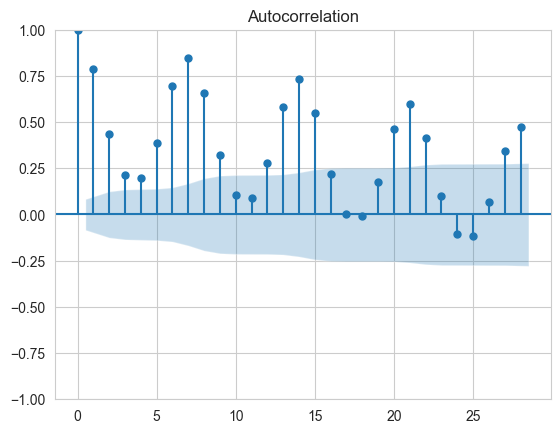

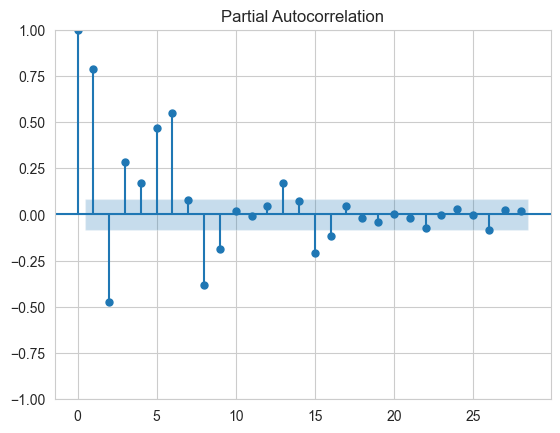

In [29]:
for col in clipped_data_dict.keys():
    print(f"ACF and PACF Plots for {col}")
    sm.tsa.graphics.plot_acf(clipped_data_dict[col])
    sm.tsa.graphics.plot_pacf(clipped_data_dict[col])
    plt.show()

**Observation**
> We are applying ACF and PACF on Non Stationary data to find the period.

> All the above plot show significant spikes in PACF and ACF plot at every 7 intervals `indicating weekly seasonality`.

> Some languages show spike at period 6 but we can also observe small spikes at period 14.  So it is better to assume period 7 for all the languages

### Time series decomposition and ADF test on all languages

Performing Seasonal Decomposition for: Chinese


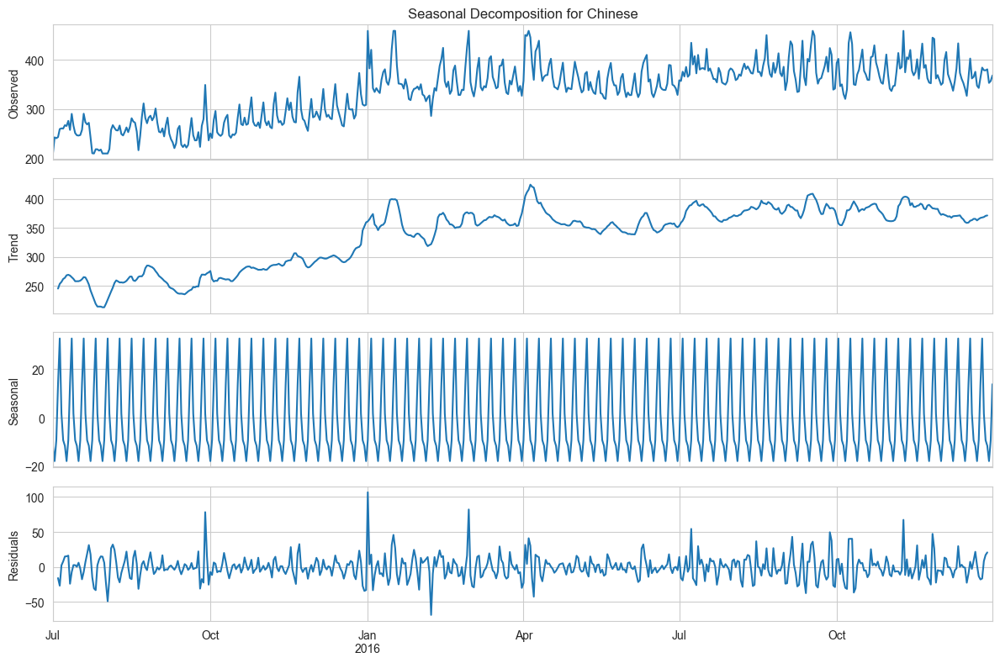

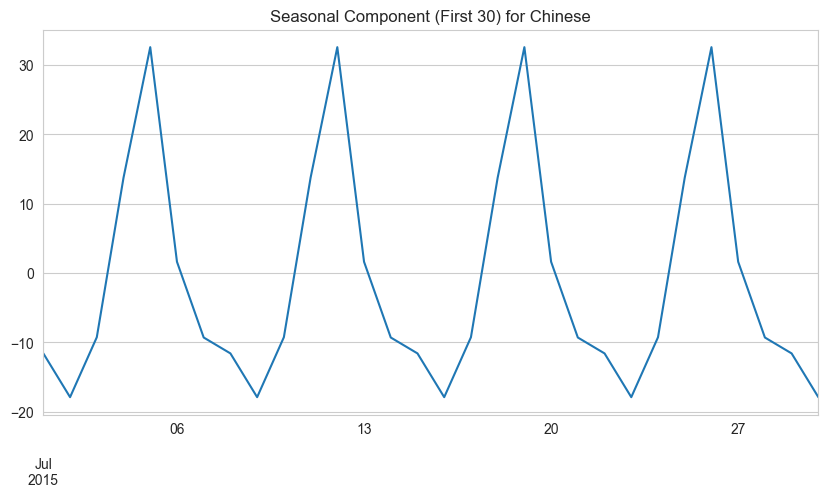

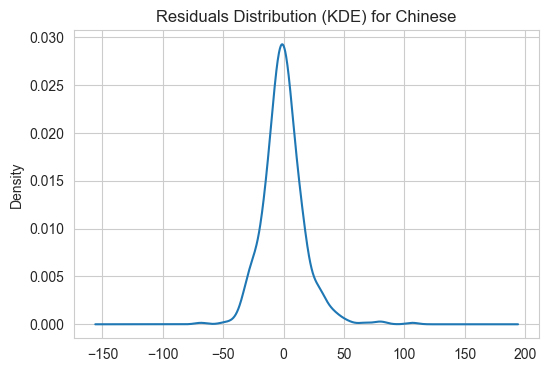

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.006611e+01
p-value                        1.294971e-17
#Lags Used                     1.800000e+01
Number of Observations Used    5.250000e+02
Critical Value (1%)           -3.442867e+00
Critical Value (5%)           -2.867061e+00
Critical Value (10%)          -2.569710e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)


Performing Seasonal Decomposition for: English


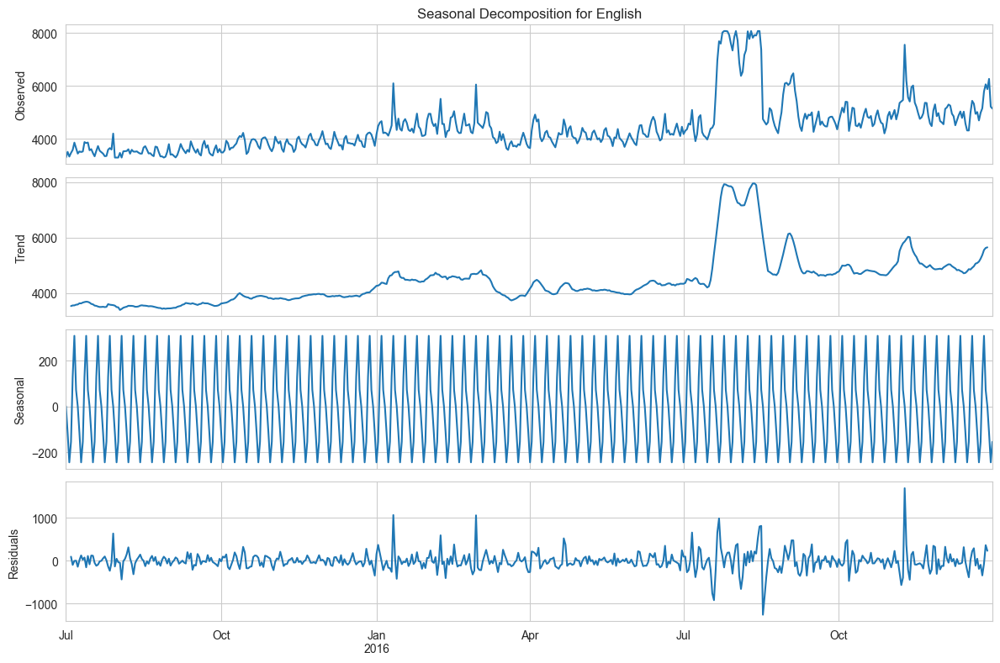

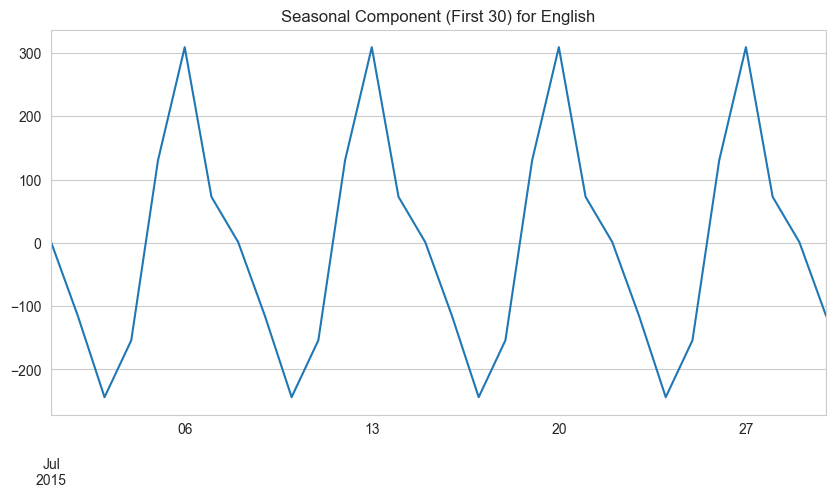

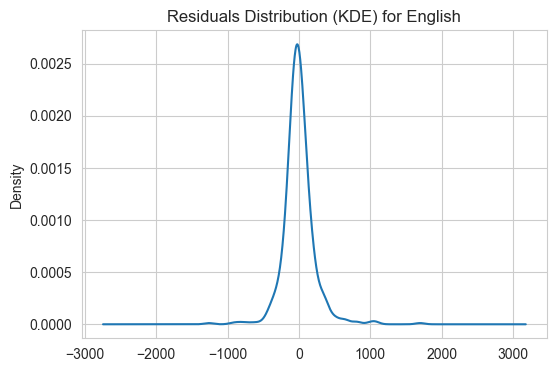

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.037595e+01
p-value                        2.201494e-18
#Lags Used                     1.900000e+01
Number of Observations Used    5.240000e+02
Critical Value (1%)           -3.442891e+00
Critical Value (5%)           -2.867072e+00
Critical Value (10%)          -2.569716e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)


Performing Seasonal Decomposition for: French


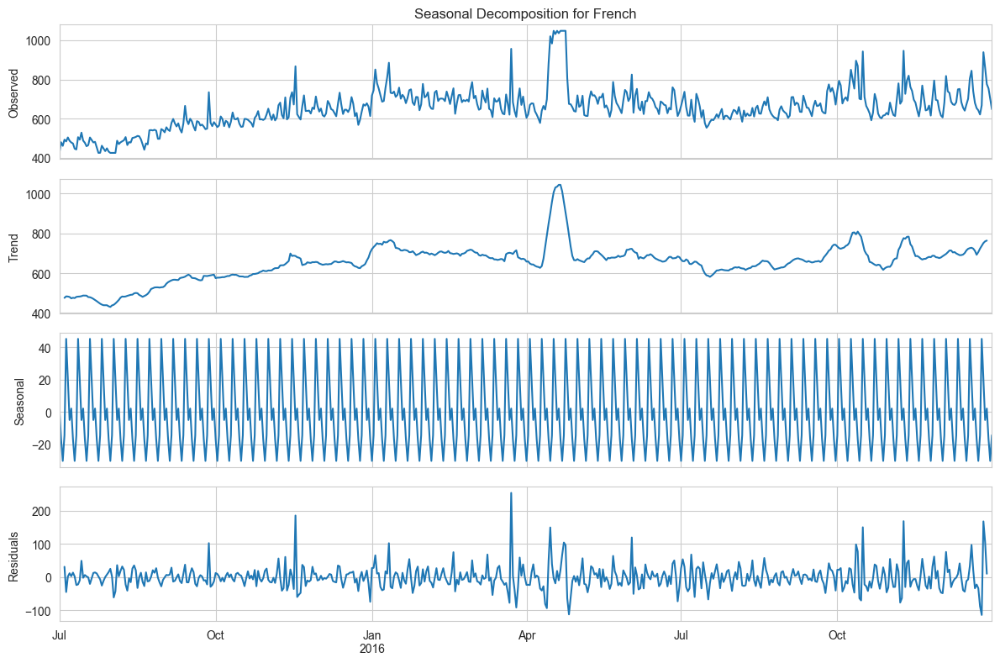

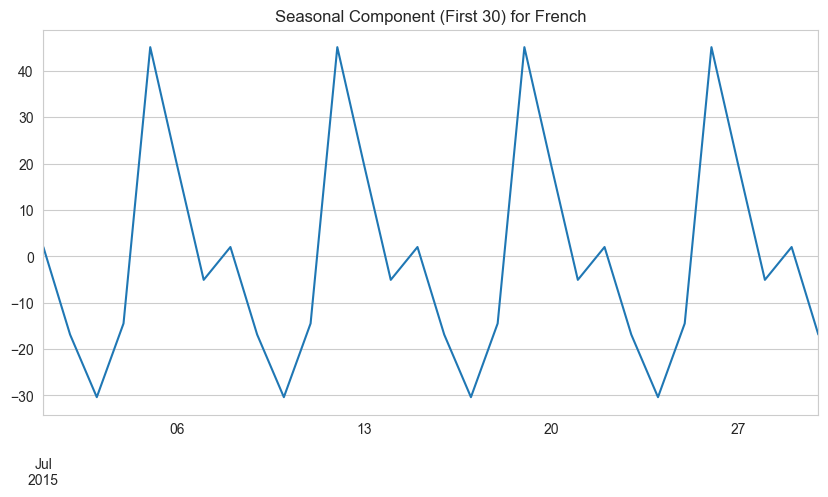

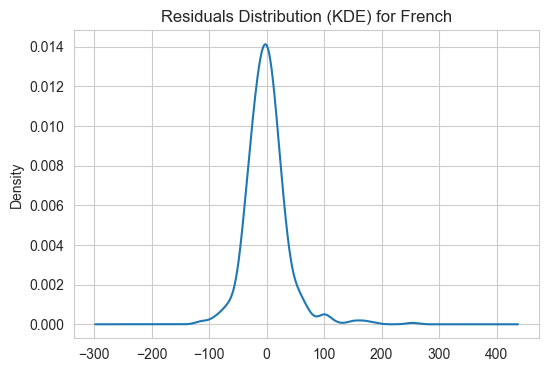

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -9.378458e+00
p-value                        7.062337e-16
#Lags Used                     1.900000e+01
Number of Observations Used    5.240000e+02
Critical Value (1%)           -3.442891e+00
Critical Value (5%)           -2.867072e+00
Critical Value (10%)          -2.569716e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)


Performing Seasonal Decomposition for: German


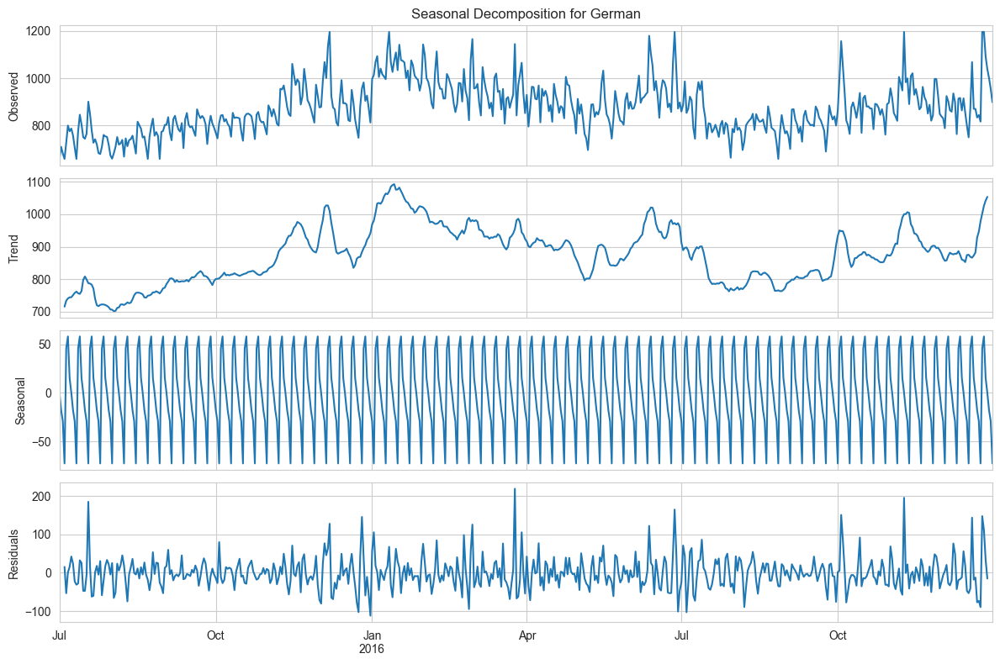

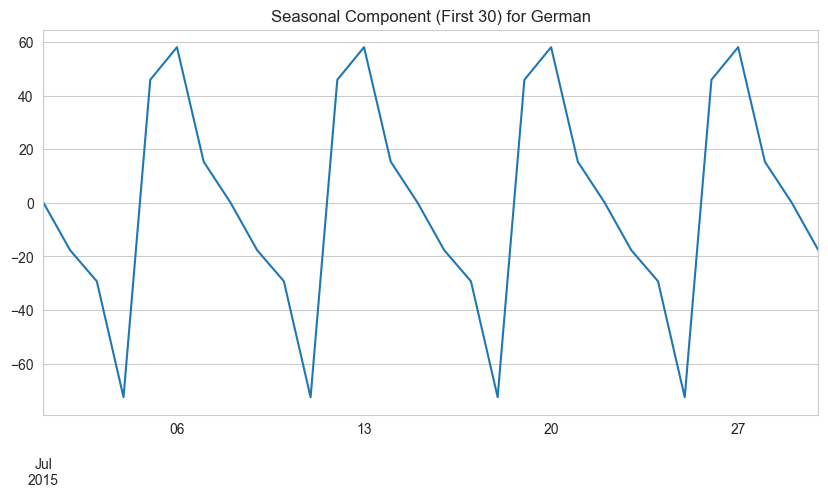

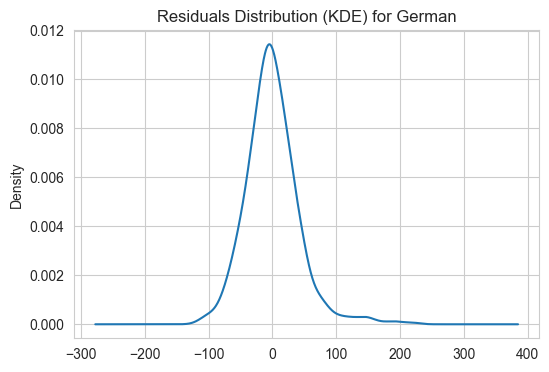

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.018264e+01
p-value                        6.632966e-18
#Lags Used                     1.900000e+01
Number of Observations Used    5.240000e+02
Critical Value (1%)           -3.442891e+00
Critical Value (5%)           -2.867072e+00
Critical Value (10%)          -2.569716e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)


Performing Seasonal Decomposition for: Japanese


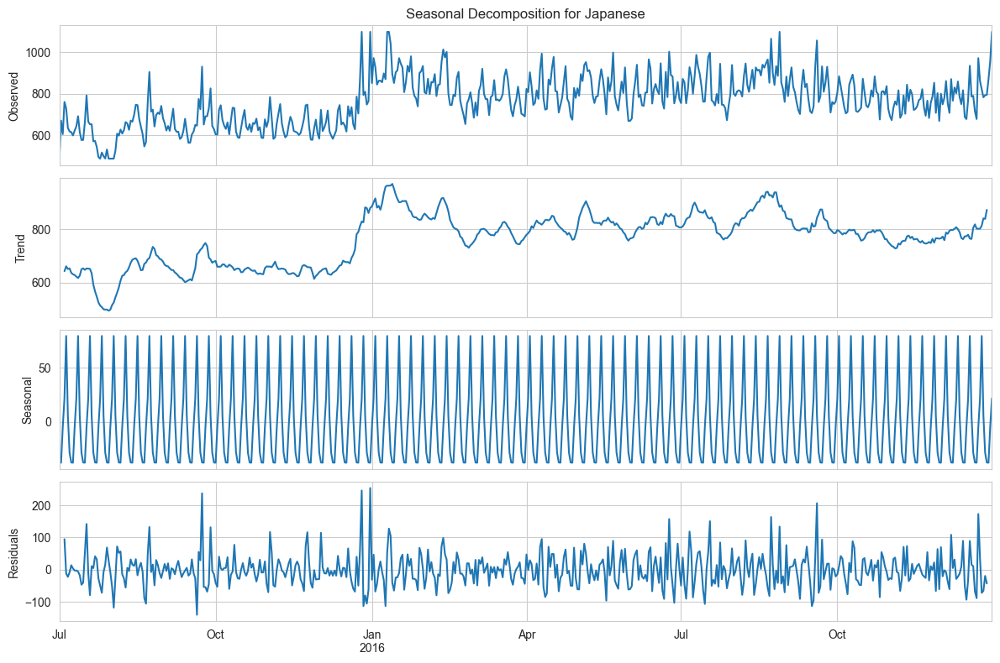

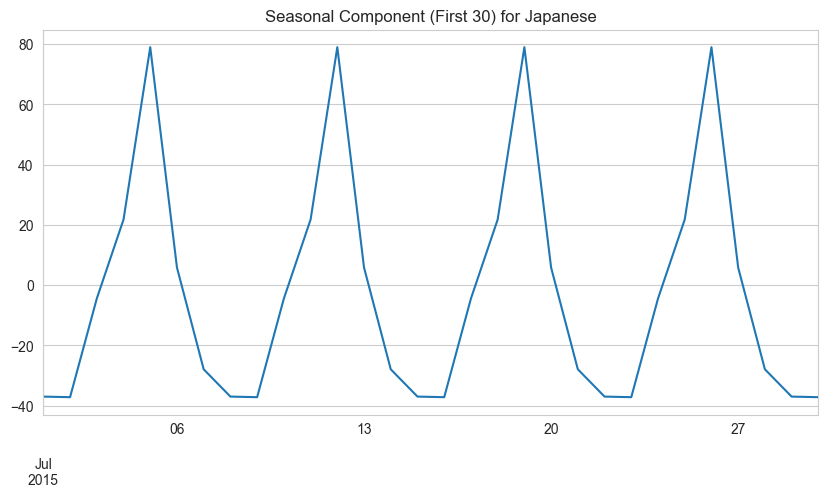

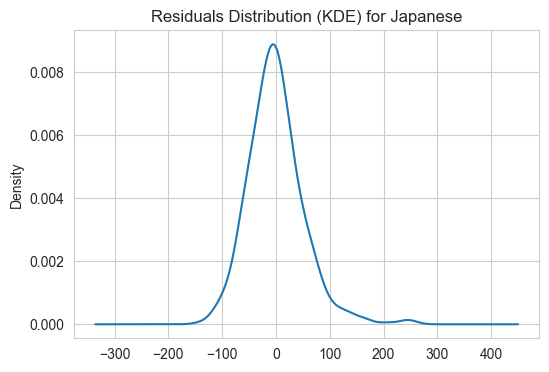

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -9.293110e+00
p-value                        1.165344e-15
#Lags Used                     1.900000e+01
Number of Observations Used    5.240000e+02
Critical Value (1%)           -3.442891e+00
Critical Value (5%)           -2.867072e+00
Critical Value (10%)          -2.569716e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)


Performing Seasonal Decomposition for: Russian


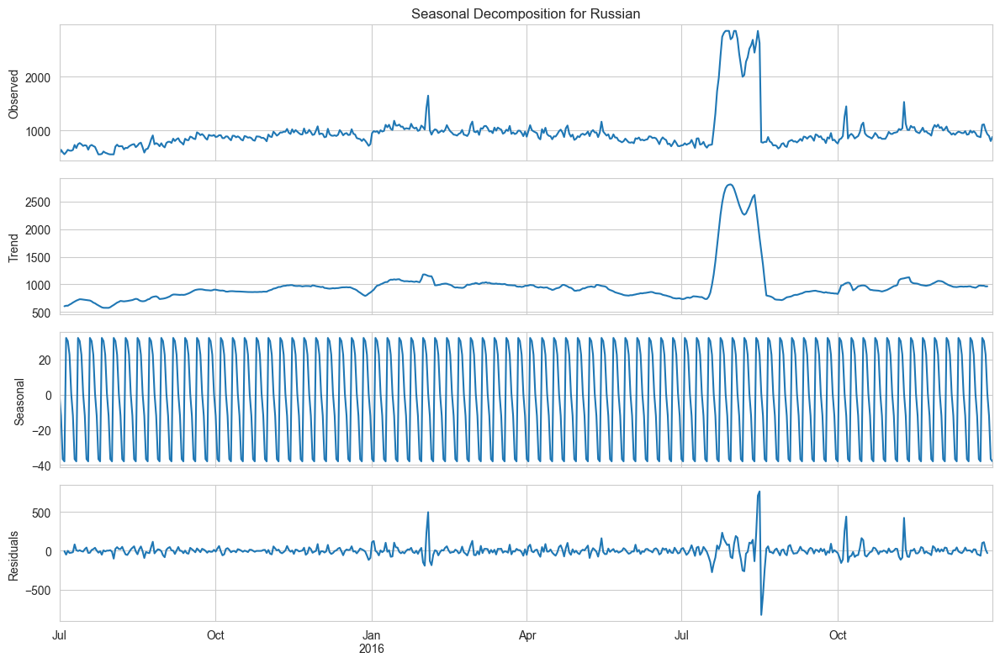

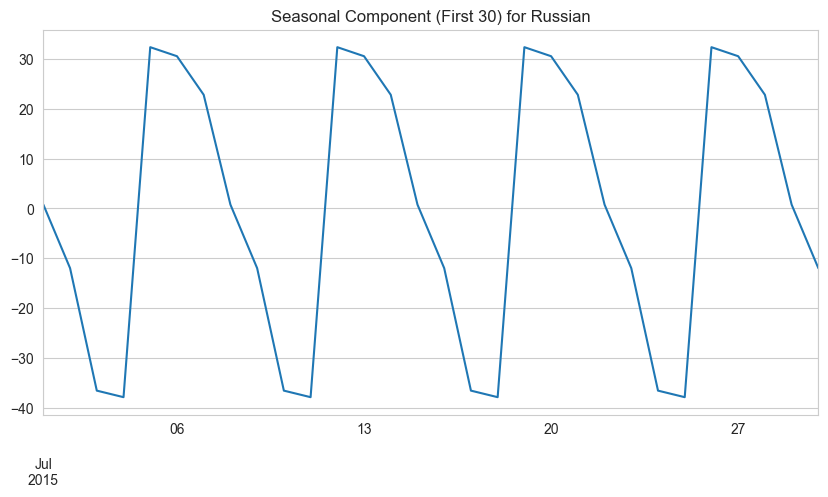

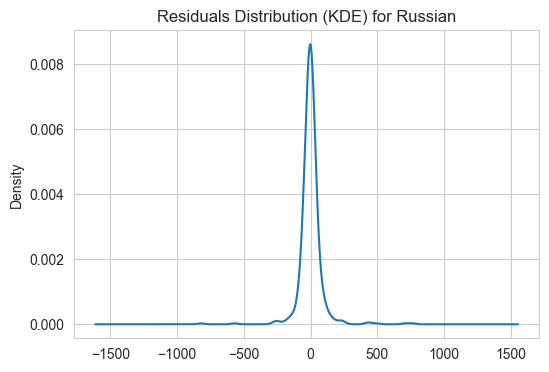

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.072848e+01
p-value                        3.022278e-19
#Lags Used                     1.500000e+01
Number of Observations Used    5.280000e+02
Critical Value (1%)           -3.442796e+00
Critical Value (5%)           -2.867030e+00
Critical Value (10%)          -2.569694e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)


Performing Seasonal Decomposition for: Spanish


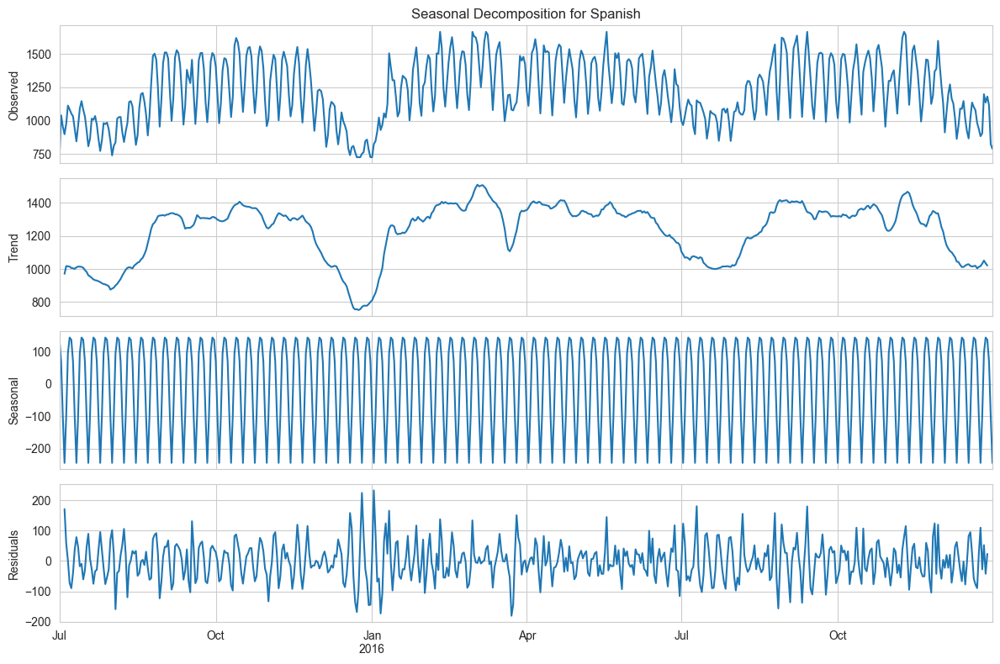

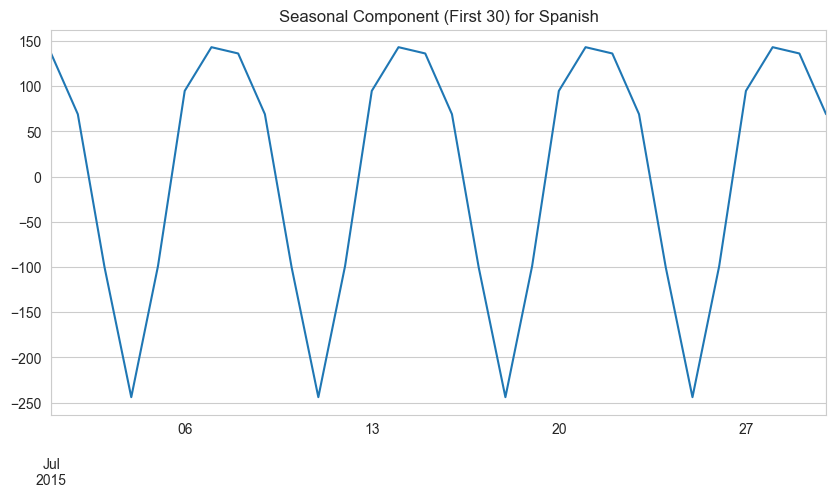

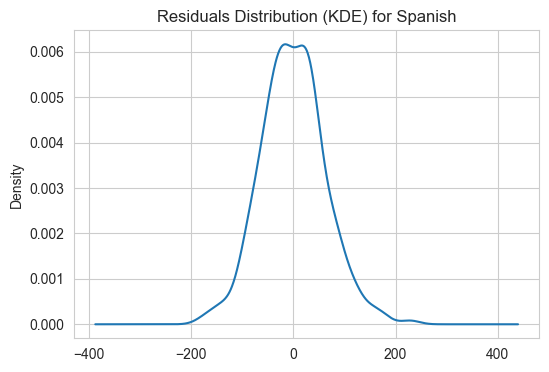

ADF Test on Residuals:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.036284e+01
p-value                        2.371806e-18
#Lags Used                     1.500000e+01
Number of Observations Used    5.280000e+02
Critical Value (1%)           -3.442796e+00
Critical Value (5%)           -2.867030e+00
Critical Value (10%)          -2.569694e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




In [27]:
# Perform seasonal decomposition on the clipped data
decomposition_dict = {}
for language in clipped_data_dict.keys():
    print(f"Performing Seasonal Decomposition for: {language}")

    # Perform seasonal decomposition
    decomposition = seasonal_decompose(clipped_data_dict[language], model='additive', period=7)
    
    # Plot the decomposition properly
    fig, axes = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    axes[0].set_title(f"Seasonal Decomposition for {language}")

    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')

    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')

    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')

    plt.tight_layout()
    plt.show()

    # Plot seasonal component separately for the first 30 values
    plt.figure(figsize=(10, 5))
    decomposition.seasonal.head(30).plot()
    plt.title(f"Seasonal Component (First 30) for {language}")
    plt.show()

    # Plot KDE for residuals
    plt.figure(figsize=(6, 4))
    decomposition.resid.dropna().plot(kind='kde')
    plt.title(f"Residuals Distribution (KDE) for {language}")
    plt.show()

    # Save the decomposition results to a dictionary
    decomposition_dict[language] = decomposition

    # ADF test on residuals
    print("ADF Test on Residuals:")
    Augmented_Dickey_Fuller(decomposition.resid.dropna())
    print("\n")


**Observation**
> All the langauges residuals became stationary after decomposition.

> All languages exhibit different weekly seasonal patterns.

> Sudden random spikes can be observed in every language's residual plot. This indicates may be the presence of `change points, holiday events, events effected by external factors`

> All languages residual kde plots are normally distributed. 

> Additive seasonality with period 7 correctly suited for our case but lets s check strength of seasonality by using diff() and stationarity check.   

## DIFFERENCING TO GET STATIONARY DATA

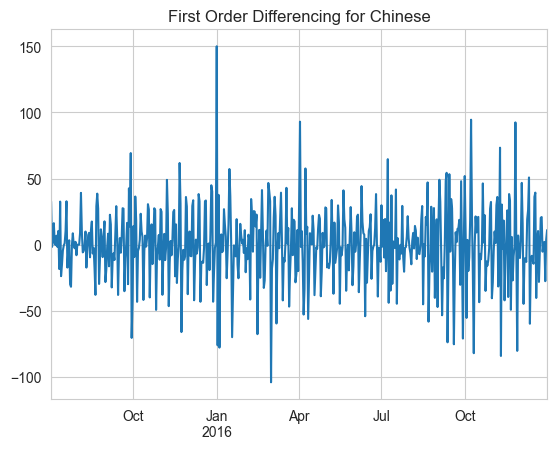

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -7.982759e+00
p-value                        2.596810e-12
#Lags Used                     1.900000e+01
Number of Observations Used    5.290000e+02
Critical Value (1%)           -3.442772e+00
Critical Value (5%)           -2.867019e+00
Critical Value (10%)          -2.569688e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




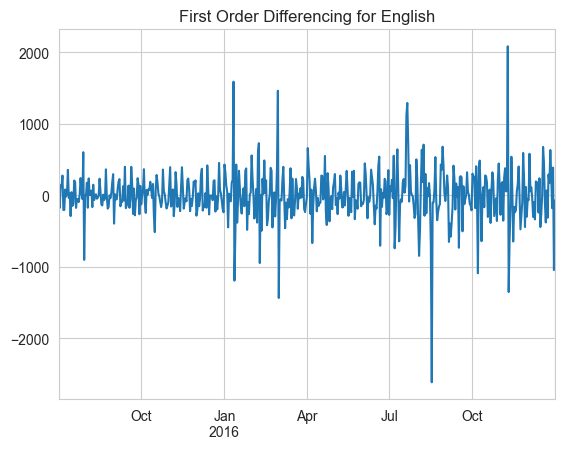

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -8.153780e+00
p-value                        9.540056e-13
#Lags Used                     1.300000e+01
Number of Observations Used    5.350000e+02
Critical Value (1%)           -3.442632e+00
Critical Value (5%)           -2.866957e+00
Critical Value (10%)          -2.569655e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




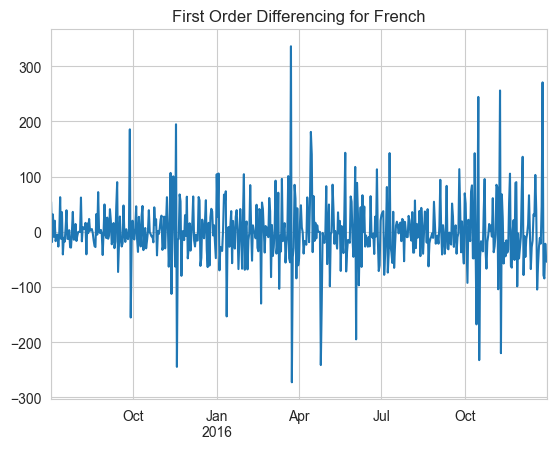

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -8.501457e+00
p-value                        1.235093e-13
#Lags Used                     1.900000e+01
Number of Observations Used    5.290000e+02
Critical Value (1%)           -3.442772e+00
Critical Value (5%)           -2.867019e+00
Critical Value (10%)          -2.569688e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




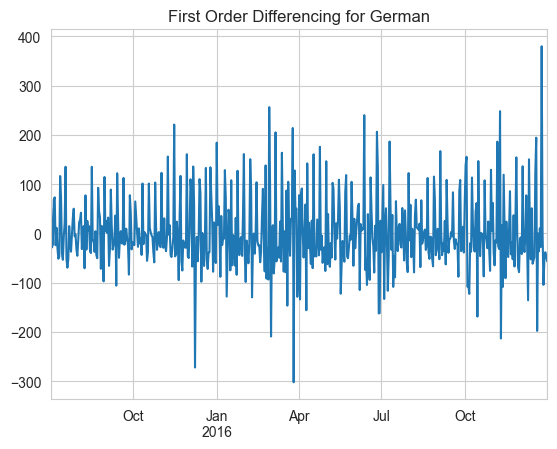

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -7.189503e+00
p-value                        2.525247e-10
#Lags Used                     1.900000e+01
Number of Observations Used    5.290000e+02
Critical Value (1%)           -3.442772e+00
Critical Value (5%)           -2.867019e+00
Critical Value (10%)          -2.569688e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




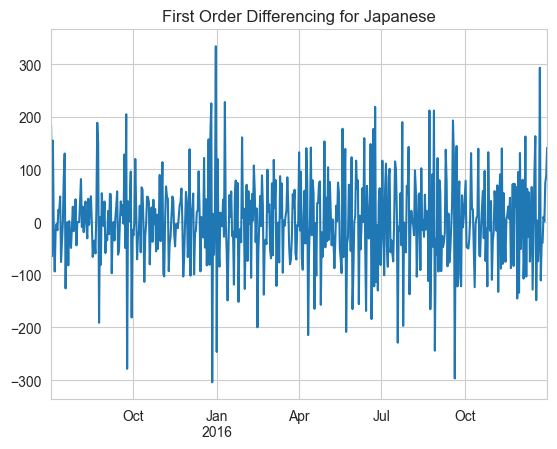

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.093697e+01
p-value                        9.505583e-20
#Lags Used                     7.000000e+00
Number of Observations Used    5.410000e+02
Critical Value (1%)           -3.442495e+00
Critical Value (5%)           -2.866897e+00
Critical Value (10%)          -2.569623e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




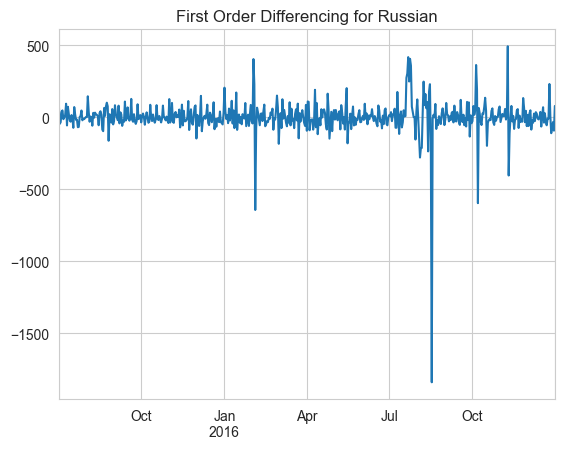

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -1.799507e+01
p-value                        2.746159e-30
#Lags Used                     1.000000e+00
Number of Observations Used    5.470000e+02
Critical Value (1%)           -3.442361e+00
Critical Value (5%)           -2.866838e+00
Critical Value (10%)          -2.569592e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




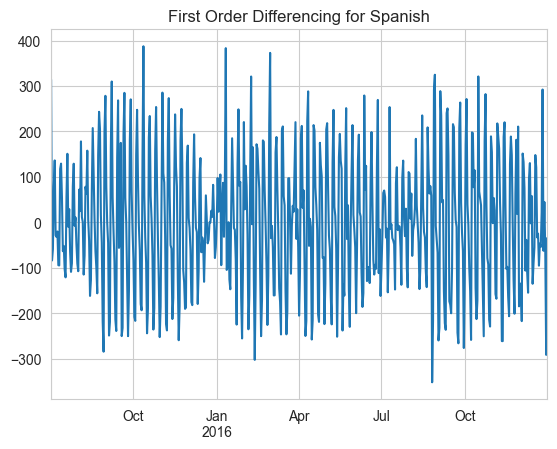

ADF Test on Differenced Data:
Results of Augmented Dickey-Fuller Test:
Test Statistic                -5.795449e+00
p-value                        4.763830e-07
#Lags Used                     1.400000e+01
Number of Observations Used    5.340000e+02
Critical Value (1%)           -3.442655e+00
Critical Value (5%)           -2.866968e+00
Critical Value (10%)          -2.569661e+00
dtype: float64
Time Series is Stationary (p-value: 0.00000 ≤ 0.05)




In [31]:
differenced_dict = {}
for col in clipped_data_dict.keys():
    differenced_dict[col] = clipped_data_dict[col].diff().dropna()

    differenced_dict[col].plot()
    plt.title(f"First Order Differencing for {col}")
    plt.show()

    # ADF test on differenced data
    print("ADF Test on Differenced Data:")
    Augmented_Dickey_Fuller(differenced_dict[col].dropna())
    print("\n")

**Observation**
> Just by using .diff() , We have removed trend and checked the stationarity. All the languages became stationary after simple first order differencing.

> So Weekly seasonality is not strong but Trend is strong. 

### Plot ACF and PACF after first order differencing

ACF and PACF Plots for Chinese


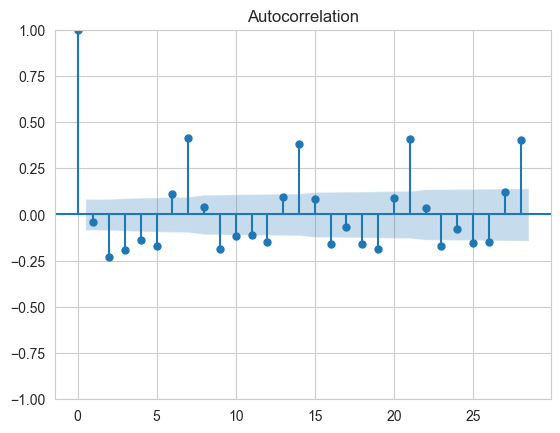

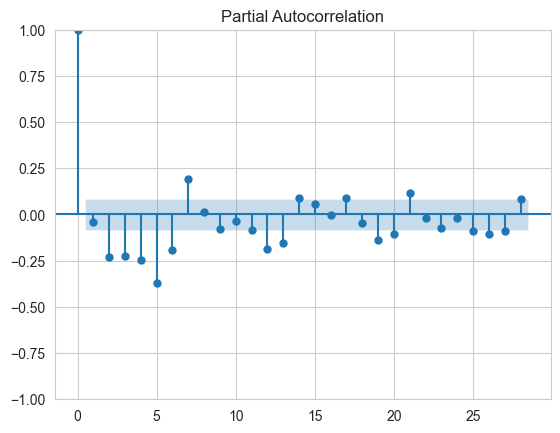

ACF and PACF Plots for English


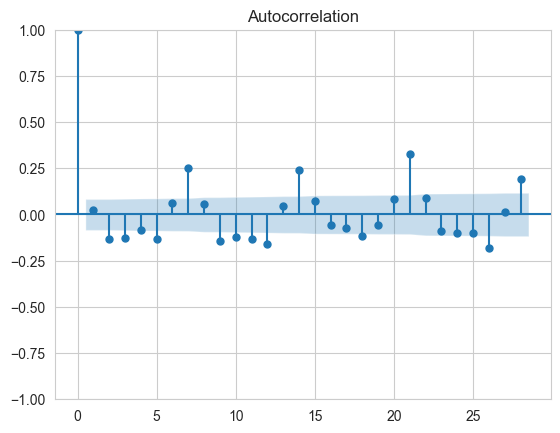

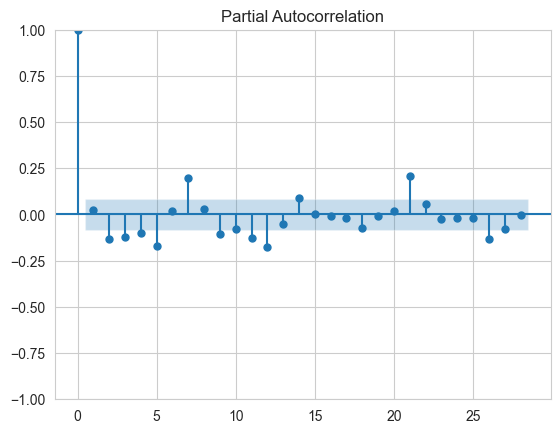

ACF and PACF Plots for French


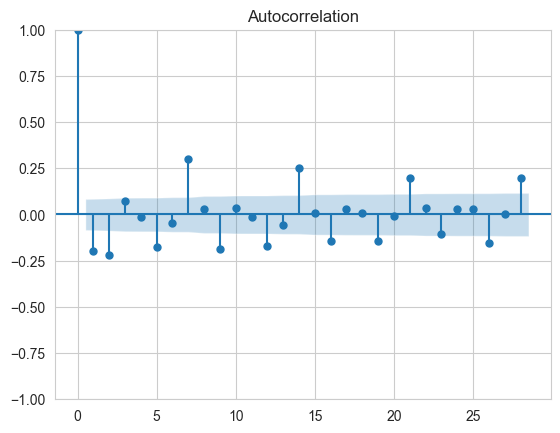

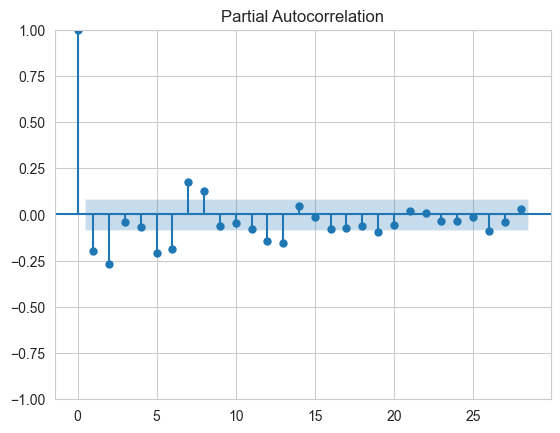

ACF and PACF Plots for German


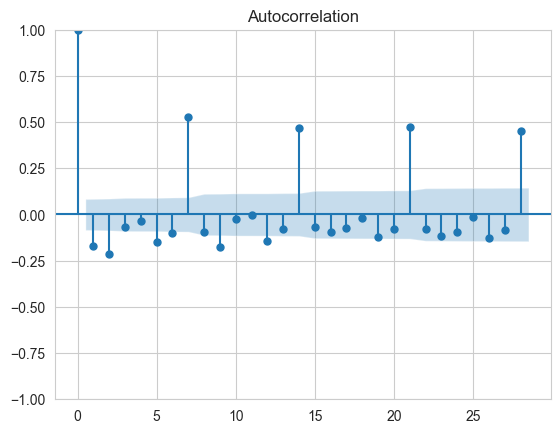

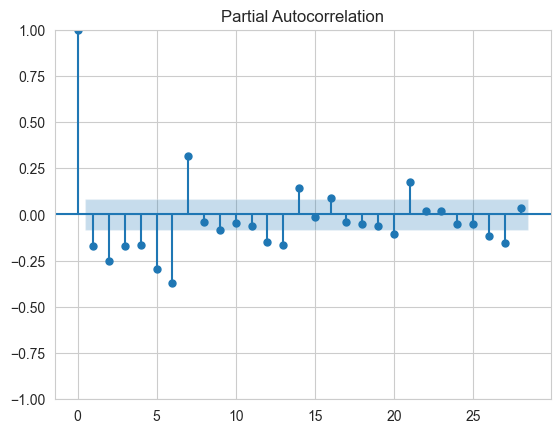

ACF and PACF Plots for Japanese


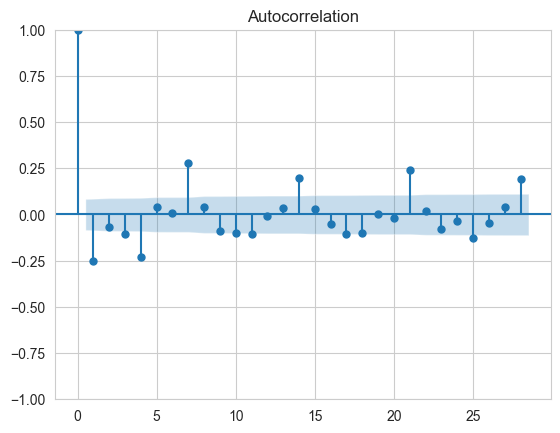

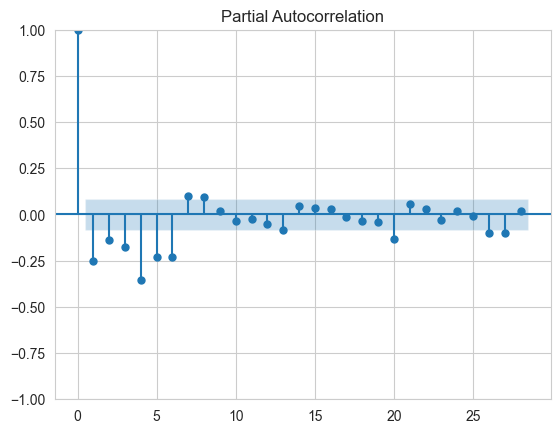

ACF and PACF Plots for Russian


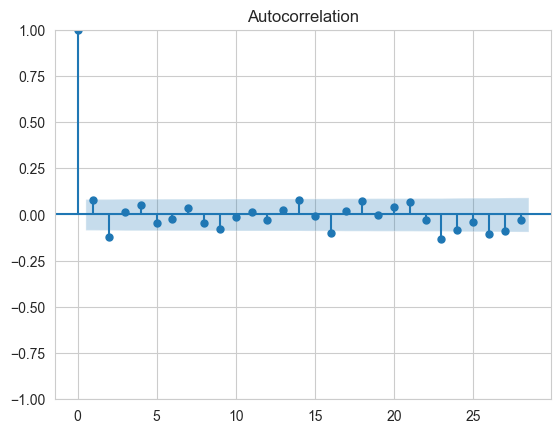

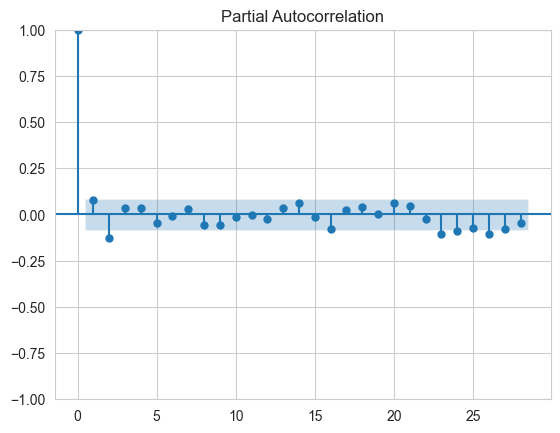

ACF and PACF Plots for Spanish


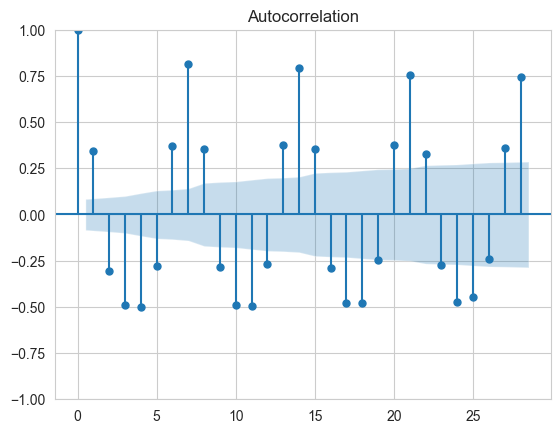

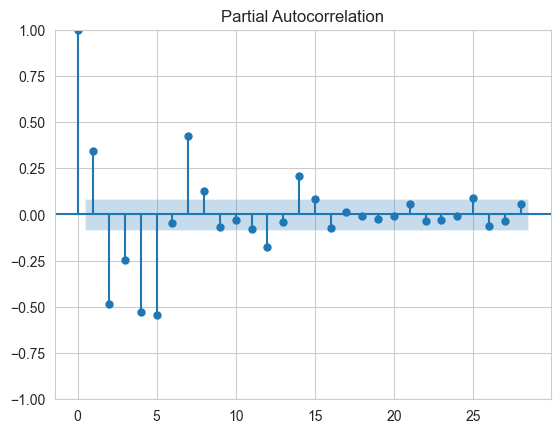

In [36]:
for col in differenced_dict.keys():
    print(f"ACF and PACF Plots for {col}")
    sm.tsa.graphics.plot_acf(differenced_dict[col])
    sm.tsa.graphics.plot_pacf(differenced_dict[col])
    plt.show()

**Observations**
> The ACF and PACF plots on differenced data reveal seasonality factors across different languages:
> * **Chinese:** Peaks at lags 5 and 7, indicating possible weekly patterns but with intermediate lag effects.
> * **English:** Peaks at lags 5 and 7, suggesting weak weekly seasonality, though not dominant.
> * **French:** Peaks at lags 2, 5, 6, and 7, indicating mixed signals of seasonality with weaker patterns.
> * **German:** Peaks at lags 5, 6, and 7, suggesting possible weekly patterns but with inconsistencies.
> * **Japanese:** Peaks at lags 4, 5, 6, and 7, suggesting variable seasonality, likely influenced by noise or external factors.
> * **Russian:** Peak at lag 2 only, indicating no clear weekly seasonality.
> * **Spanish:** Peaks at lags 2, 4, 5, and 7, indicating irregular seasonal patterns, but lag 7 is still prominent.

> All languages except **Russian** exhibit some form of weekly seasonality, although the patterns are weak.

> The presence of multiple significant lags (besides 7) suggests weak and mixed seasonal patterns, likely influenced by external factors.

> Since weekly seasonality is weak, for ARIMA family models:
> * It’s better to either **ignore seasonality** (`seasonal order = 0`) or
> * Include **weekly seasonality** (`seasonal order = 7`) if necessary.

> **SARIMA** can be considered with a seasonal order of `(0, 1, 1, 7)` to account for potential weekly patterns, but it may not add significant value.

> Starting with **ARIMA** and comparing it with **SARIMA** (with `seasonality = 7`) using AIC/BIC or cross-validation scores can help determine the better model.

> So, **`d = 1` and `D = 1` in ARIMA models** because they effectively remove the trend and seasonality, making the time series stationary for accurate modeling and forecasting.
> * **`d = 1`** handles the **non-seasonal differencing** to eliminate linear trends, ensuring that the mean and variance remain stable over time.
> * **`D = 1`** applies **seasonal differencing** to remove recurring patterns at fixed intervals (e.g., weekly or monthly seasonality), making the series stationary with respect to seasonality.
> * These differencing steps prevent the model from overfitting and improve its ability to capture the underlying patterns in the data, enabling more reliable predictions.

# CHAPTER 4: FORECASTING MODEL BUILDING AND TRAINING

## TRAIN TEST SPLIT

In [39]:
# Define train and test dictionaries
train_dict = {}
test_dict = {}

# Define the train-test split ratio
train_ratio = 0.8  # 80% for training, 20% for testing

# Iterate through each language in clipped_data_dict
for language in clipped_data_dict.keys():
    print(f"Splitting data for: {language}")
    
    # Get the data for the current language
    data = clipped_data_dict[language]
    
    # Define the split point based on the train_ratio
    split_point = int(len(data) * train_ratio)
    
    # Split data into train and test
    train_dict[language] = data[:split_point]  # First 80% as training
    test_dict[language] = data[split_point:]  # Remaining 20% as testing
    
    # Print train and test length
    print(f"Train Size: {len(train_dict[language])}, Test Size: {len(test_dict[language])}\n")

# Check keys of train and test dictionaries
print("Languages in train_dict:", train_dict.keys())
print("Languages in test_dict:", test_dict.keys())

Splitting data for: Chinese
Train Size: 440, Test Size: 110

Splitting data for: English
Train Size: 440, Test Size: 110

Splitting data for: French
Train Size: 440, Test Size: 110

Splitting data for: German
Train Size: 440, Test Size: 110

Splitting data for: Japanese
Train Size: 440, Test Size: 110

Splitting data for: Russian
Train Size: 440, Test Size: 110

Splitting data for: Spanish
Train Size: 440, Test Size: 110

Languages in train_dict: dict_keys(['Chinese', 'English', 'French', 'German', 'Japanese', 'Russian', 'Spanish'])
Languages in test_dict: dict_keys(['Chinese', 'English', 'French', 'German', 'Japanese', 'Russian', 'Spanish'])


## MLFLOW LOGGING AND METRIC PRINTING FUNCTION

In [72]:
mlflow.set_experiment("Time Series Forecasting")

def mlflow_logging_and_metric_printing(train, test, model_class, language, run_name, params):
    with mlflow.start_run(run_name=run_name):
        try:
            # Log the language
            mlflow.log_param("Language", language)

            # Force frequency if not set
            train.index.freq = 'D'  # If daily data
            test.index.freq = 'D'  # If daily data

            # Extract model and fit parameters from nested dictionary
            model_params = params.get("model_params", {})
            fit_params = params.get("fit_params", {})

            # Log all parameters (both model and fit)
            mlflow.log_params({"model_params": model_params, "fit_params": fit_params})

            # Initialize the model with model_params
            model = model_class(train, **model_params)

            # Fit the model - check if fit_params are available
            if fit_params:
                results = model.fit(**fit_params)  # Use fit_params if provided
            else:
                results = model.fit()  # Standard fit if no fit_params

            # Forecast on test data
            test_pred = results.forecast(steps=len(test))

            # Save the model using pickle
            model_path = f"{language}_{run_name}.pkl"
            with open(model_path, "wb") as f:
                pickle.dump(results, f)

            # Log the model artifact
            mlflow.log_artifact(model_path, artifact_path="models")

            # Calculate and log all metrics
            mae_score = round(mae(test, test_pred), 4)
            mse_score = round(mse(test, test_pred), 4)
            mape_score = round(mape(test, test_pred) * 100, 4)  # Convert to percentage

            mlflow.log_metric("MAE", mae_score)
            mlflow.log_metric("MSE", mse_score)
            mlflow.log_metric("MAPE", mape_score)

            # Print the metrics
            print(f"Metrics for {language}:")
            print(f"Mean Absolute Error: {mae_score}")
            print(f"Mean Squared Error: {mse_score}")
            print(f"Mean Absolute Percentage Error: {mape_score}%")

            # Plot the results
            plt.figure(figsize=(10, 6))
            plt.plot(train[-100:], label="Training Data")
            plt.plot(test, label="Actual")
            plt.plot(test_pred, label="Predicted")
            plt.title(f"Actual vs Predicted for {language}_{run_name}")
            plt.xlabel("Date")
            plt.ylabel("Page Views")
            plt.legend()

            # Save the plot as an image
            plot_path = f"actual_vs_predicted_{language}_{run_name}.png"
            plt.savefig(plot_path)
            plt.show()
            plt.close()

            # Log the plot as an artifact
            mlflow.log_artifact(plot_path)

            # Remove local model and plot files after logging
            os.remove(model_path)
            os.remove(plot_path)

            print("MLFlow logging is completed successfully")

        except Exception as e:
            print(f"An error occurred for {language}_{run_name}: {e}")


## EXPONENTIAL SMOOTHING MODEL

Metrics for Chinese:
Mean Absolute Error: 19.625
Mean Squared Error: 676.8262
Mean Absolute Percentage Error: 5.0791%


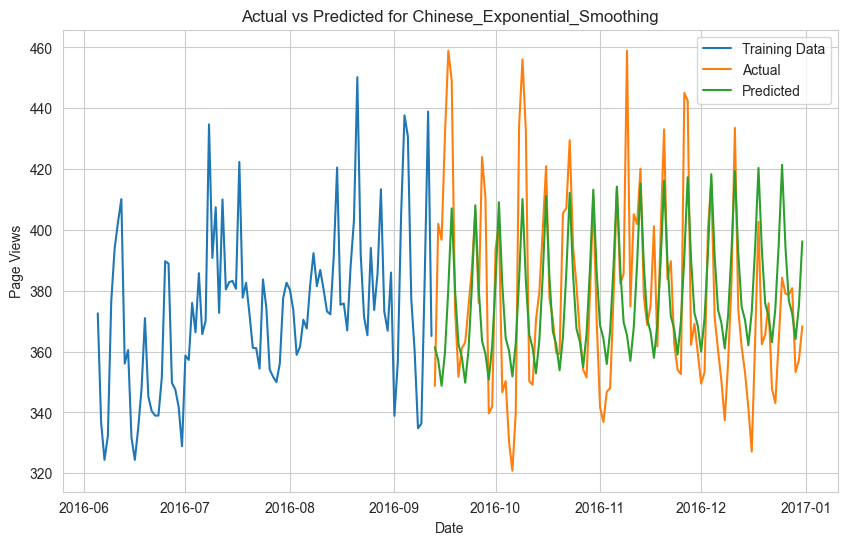

MLFlow logging is completed successfully
Metrics for English:
Mean Absolute Error: 1077.8082
Mean Squared Error: 1569883.632
Mean Absolute Percentage Error: 20.9303%


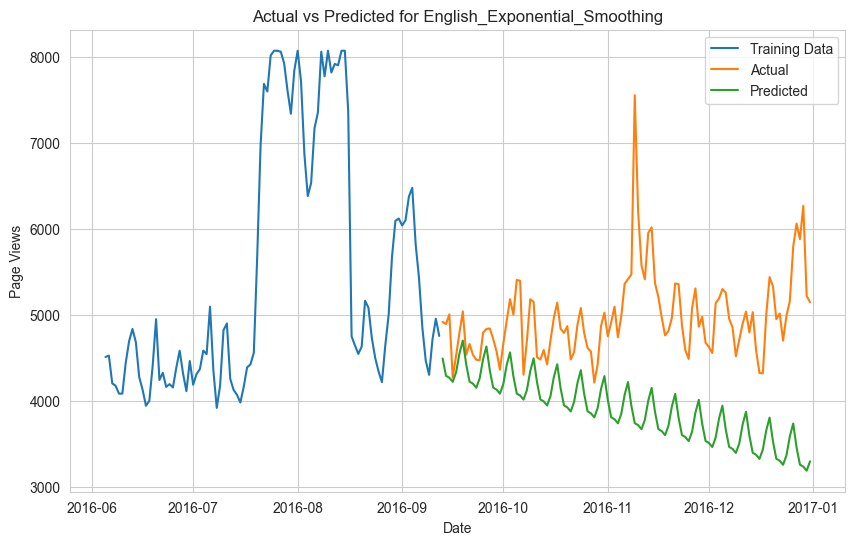

MLFlow logging is completed successfully
Metrics for French:
Mean Absolute Error: 52.1989
Mean Squared Error: 5388.4341
Mean Absolute Percentage Error: 7.0032%


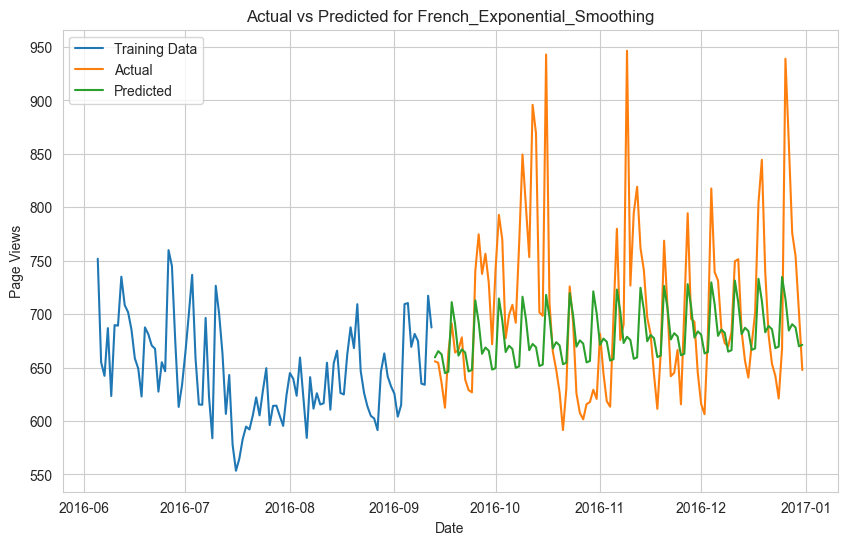

MLFlow logging is completed successfully
Metrics for German:
Mean Absolute Error: 72.8421
Mean Squared Error: 10683.3041
Mean Absolute Percentage Error: 7.6059%


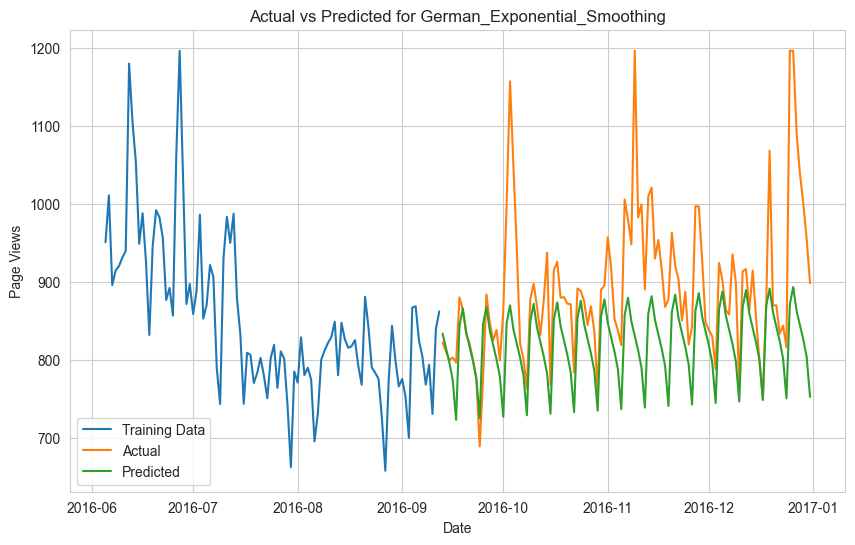

MLFlow logging is completed successfully
Metrics for Japanese:
Mean Absolute Error: 59.6249
Mean Squared Error: 7830.1373
Mean Absolute Percentage Error: 7.1741%


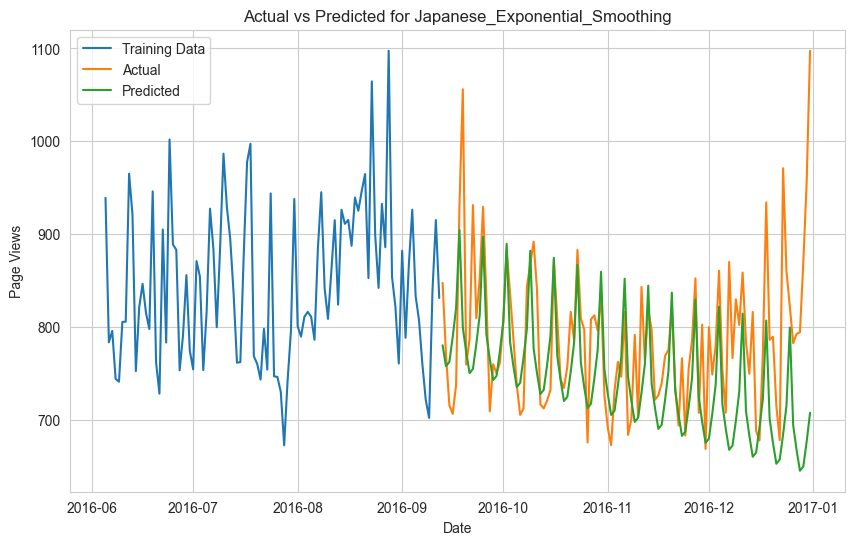

MLFlow logging is completed successfully
Metrics for Russian:
Mean Absolute Error: 91.6575
Mean Squared Error: 17005.7796
Mean Absolute Percentage Error: 9.42%


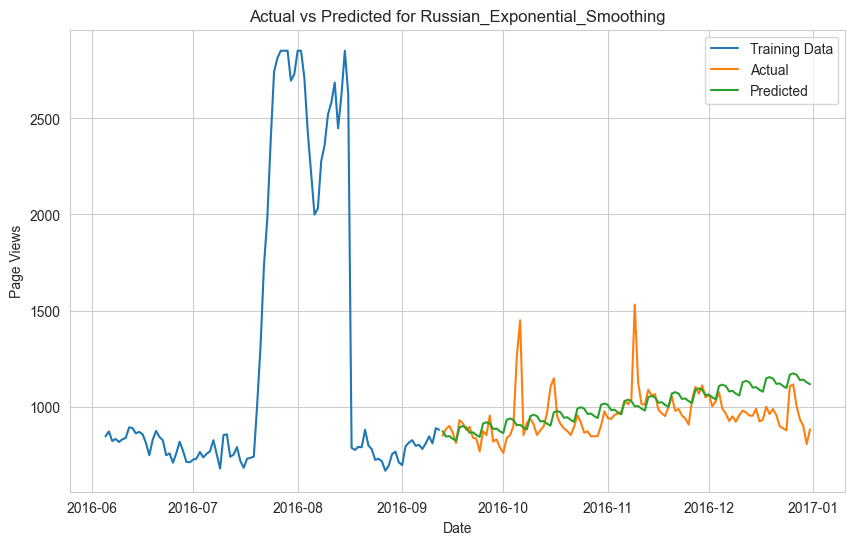

MLFlow logging is completed successfully
Metrics for Spanish:
Mean Absolute Error: 390.1857
Mean Squared Error: 216951.2409
Mean Absolute Percentage Error: 34.7623%


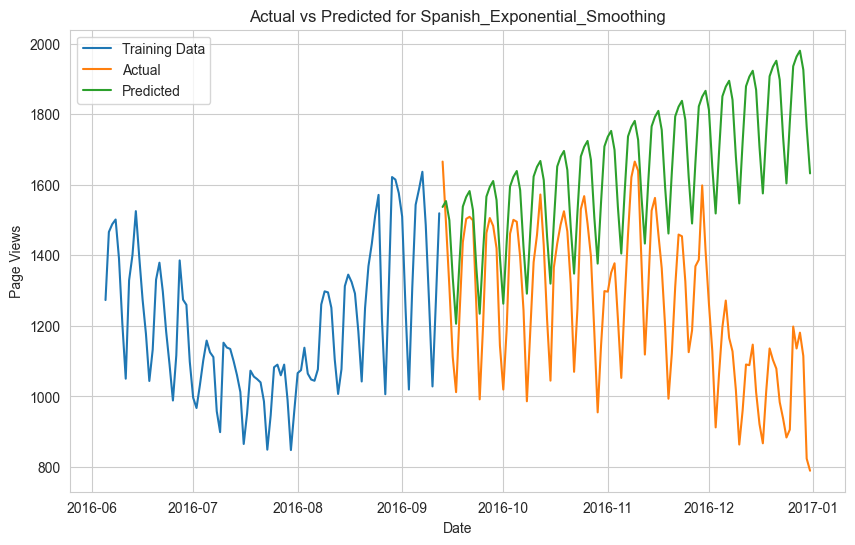

MLFlow logging is completed successfully


In [73]:
# Define model and fit parameters
params = {
    "model_params": {
        "trend": "add",
        "seasonal": "add",
        "seasonal_periods": 7
    },
    "fit_params": {
        "optimized": True
    }
}

# Run the logging and metric printing for each language
for language in train_dict.keys():
    run_name = "Exponential_Smoothing"

    # Log model and metrics
    mlflow_logging_and_metric_printing(
        train_dict[language],
        test_dict[language],
        ExponentialSmoothing,
        language,
        run_name,
        params
    )

### Grid Search Exponential Smoothing

In [89]:
# Grid search for Exponential Smoothing
def grid_search_es(train, seasonal_periods, tscv_splits=5):
    """
    Grid search for Exponential Smoothing to find the best hyperparameters.
    Args:
        - train: Training data
        - seasonal_periods: Period for seasonality (e.g., 7 for weekly data)
        - tscv_splits: Number of splits for TimeSeriesSplit cross-validation
    Returns:
        - best_params: Best model_params and fit_params
    """
    param_grid = {
        "smoothing_level": [0.1, 0.3, 0.5, 0.7, 0.9, None],  # Alpha
        "smoothing_trend": [0.01, 0.1, 0.2, None],  # Beta
        "smoothing_seasonal": [0.1, 0.3, 0.5, None],  # Gamma
    }

    best_score, best_params = float("inf"), None
    tscv = TimeSeriesSplit(n_splits=tscv_splits)

    # Iterate through all parameter combinations
    for alpha in param_grid["smoothing_level"]:
        for beta in param_grid["smoothing_trend"]:
            for gamma in param_grid["smoothing_seasonal"]:
                try:
                    errors = []
                    for train_idx, val_idx in tscv.split(train):
                        train_split, val_split = train.iloc[train_idx], train.iloc[val_idx]

                        # Define the model
                        model = ExponentialSmoothing(
                            train_split,
                            trend="add",
                            seasonal="add",
                            seasonal_periods=seasonal_periods,
                        )
                        
                        # Fit the model
                        results = model.fit(
                            smoothing_level=alpha,
                            smoothing_trend=beta,
                            smoothing_seasonal=gamma,
                            optimized=True,
                        )
                        
                        # Forecast and calculate error
                        predictions = results.forecast(steps=len(val_split))
                        error = mape(val_split, predictions)
                        errors.append(error)

                    avg_error = np.mean(errors)
                    if avg_error < best_score:
                        best_score = avg_error
                        best_params = {
                            "model_params": {
                                "trend": "add",
                                "seasonal": "add",
                                "seasonal_periods": seasonal_periods,
                            },
                            "fit_params": {
                                "smoothing_level": alpha,
                                "smoothing_trend": beta,
                                "smoothing_seasonal": gamma,
                                "optimized": True,
                            },
                        }
                except Exception as e:
                    print(f"Error occurred with params ({alpha}, {beta}, {gamma}): {e}")
                    continue

    print(f"Best params: {best_params} with MSE: {best_score}%")
    return best_params


Processing language: Chinese
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': 0.9, 'smoothing_trend': None, 'smoothing_seasonal': None, 'optimized': True}} with MSE: 0.06481464477988563%
Metrics for Chinese:
Mean Absolute Error: 50.4411
Mean Squared Error: 3196.5782
Mean Absolute Percentage Error: 13.059%


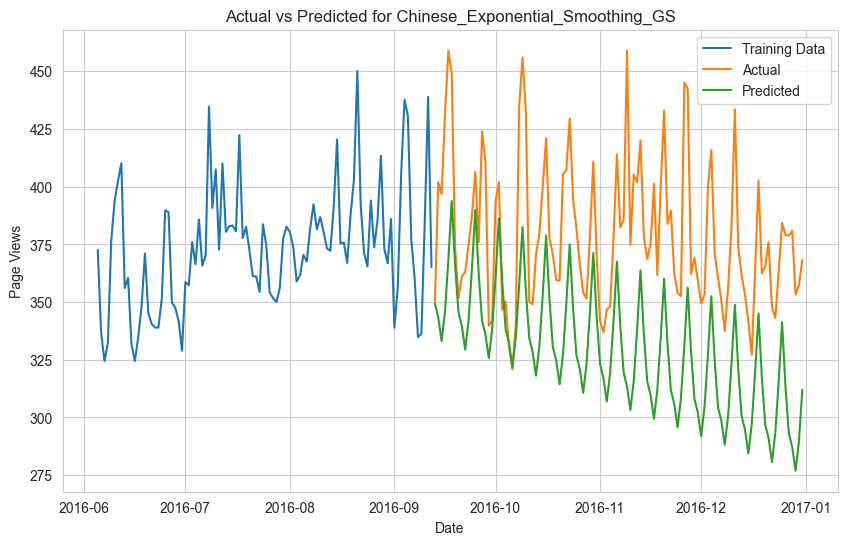

MLFlow logging is completed successfully
Processing language: English
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': 0.1, 'smoothing_trend': 0.1, 'smoothing_seasonal': 0.1, 'optimized': True}} with MSE: 0.09022695840989041%
Metrics for English:
Mean Absolute Error: 3939.1099
Mean Squared Error: 20619603.3592
Mean Absolute Percentage Error: 77.916%


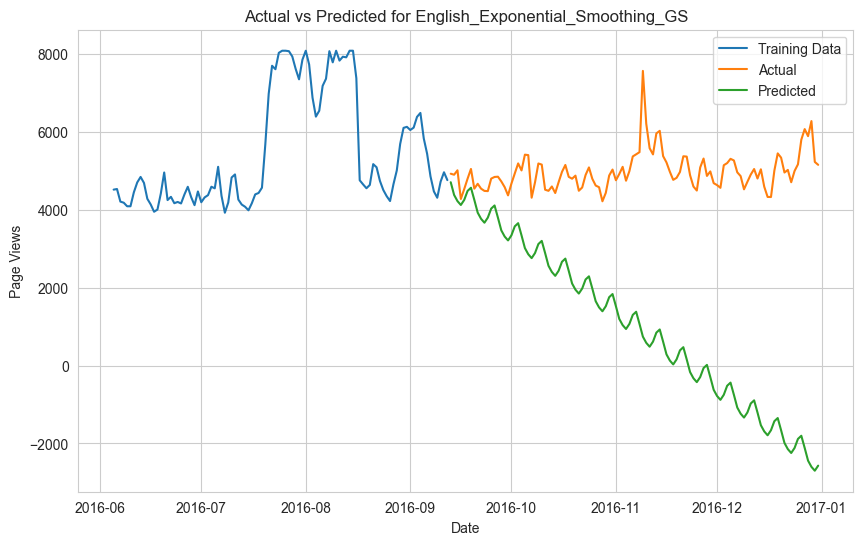

MLFlow logging is completed successfully
Processing language: French
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': 0.1, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'optimized': True}} with MSE: 0.12158407286950441%
Metrics for French:
Mean Absolute Error: 60.6262
Mean Squared Error: 7372.8728
Mean Absolute Percentage Error: 7.9499%


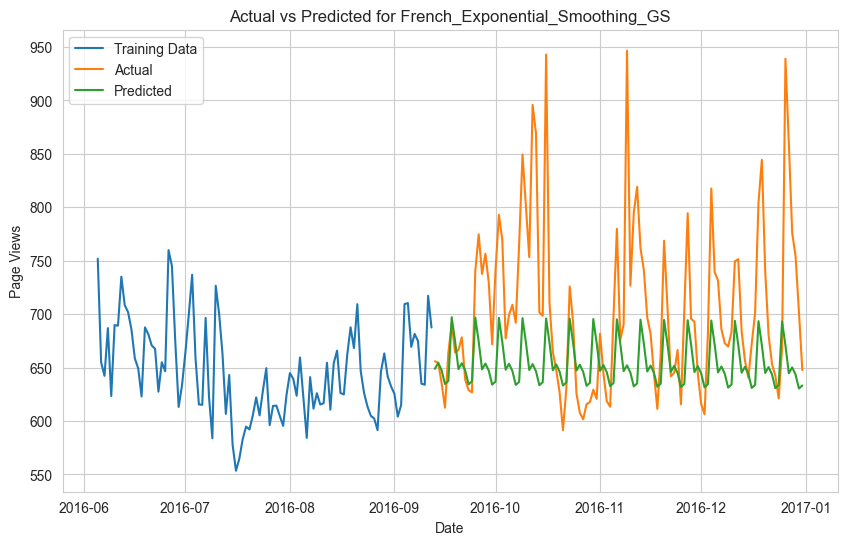

MLFlow logging is completed successfully
Processing language: German
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': 0.9, 'smoothing_trend': None, 'smoothing_seasonal': None, 'optimized': True}} with MSE: 0.0669819842617824%
Metrics for German:
Mean Absolute Error: 139.9304
Mean Squared Error: 27198.9642
Mean Absolute Percentage Error: 15.0865%


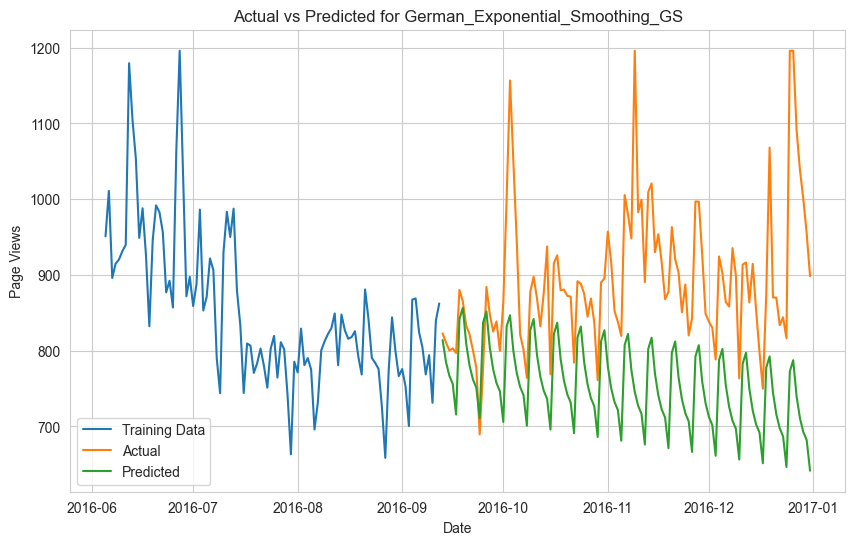

MLFlow logging is completed successfully
Processing language: Japanese
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': None, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'optimized': True}} with MSE: 0.10033359427188895%
Metrics for Japanese:
Mean Absolute Error: 54.561
Mean Squared Error: 4998.0387
Mean Absolute Percentage Error: 6.8923%


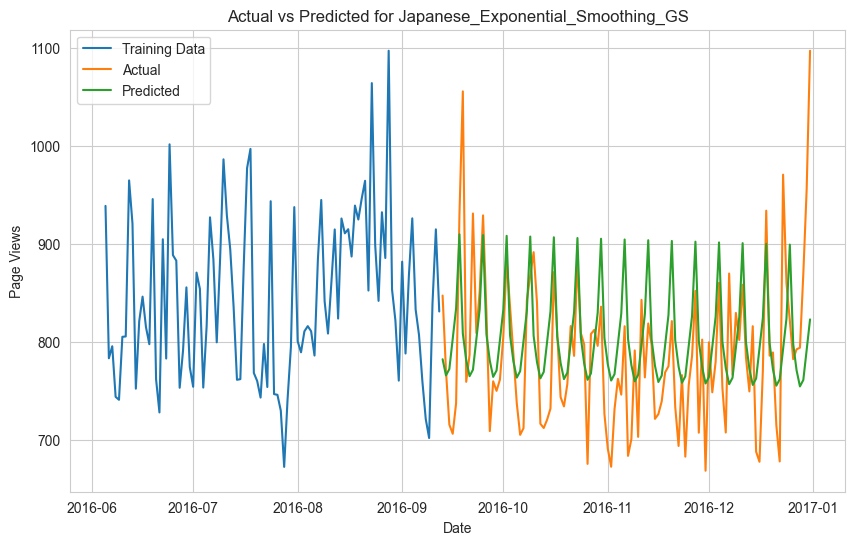

MLFlow logging is completed successfully
Processing language: Russian
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': 0.9, 'smoothing_trend': None, 'smoothing_seasonal': 0.1, 'optimized': True}} with MSE: 0.13441052221166688%
Metrics for Russian:
Mean Absolute Error: 308.5614
Mean Squared Error: 123015.5647
Mean Absolute Percentage Error: 31.2278%


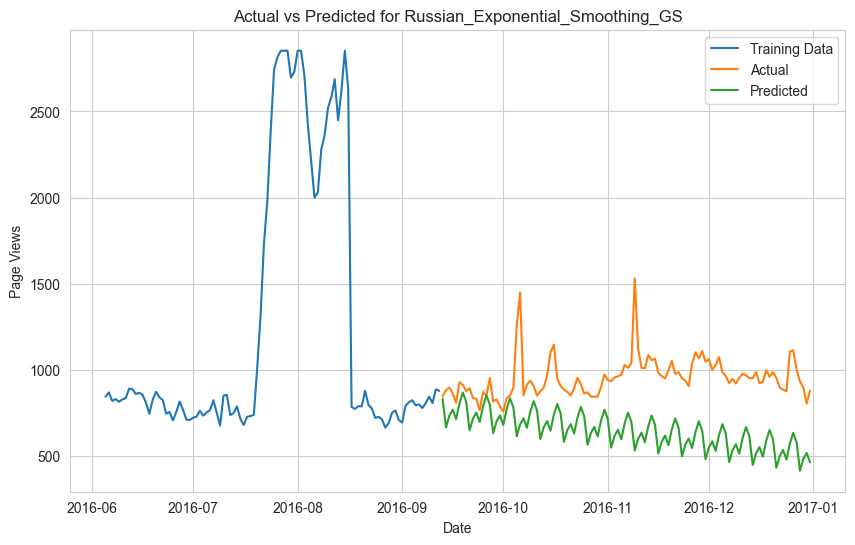

MLFlow logging is completed successfully
Processing language: Spanish
Best params: {'model_params': {'trend': 'add', 'seasonal': 'add', 'seasonal_periods': 7}, 'fit_params': {'smoothing_level': 0.7, 'smoothing_trend': None, 'smoothing_seasonal': 0.3, 'optimized': True}} with MSE: 0.132899969270867%
Metrics for Spanish:
Mean Absolute Error: 150.9739
Mean Squared Error: 42908.2884
Mean Absolute Percentage Error: 13.4837%


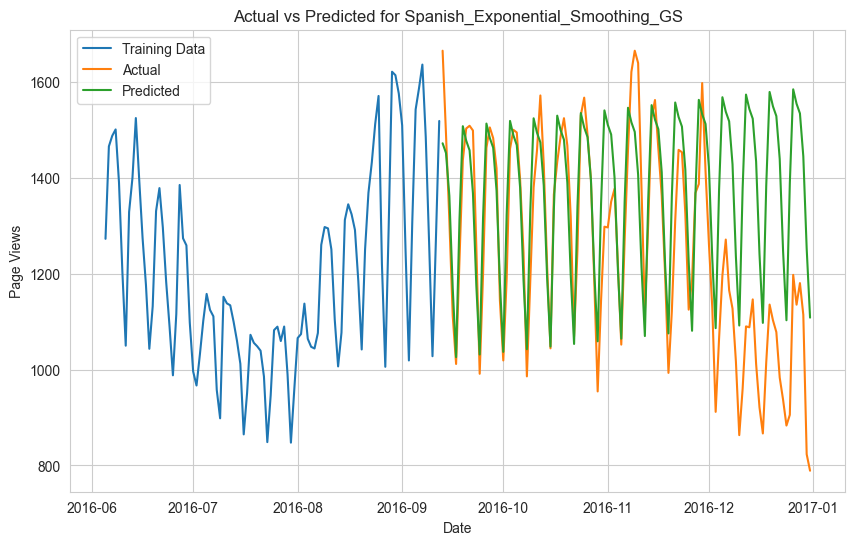

MLFlow logging is completed successfully


In [90]:
# Iterate through all languages to apply Exponential Smoothing
for language in train_dict.keys():
    print(f"Processing language: {language}")

    # Define seasonal_periods dynamically per language if required
    seasonal_periods = 7  # Weekly seasonality (modify if needed)

    # Perform grid search to get best params
    best_params = grid_search_es(train_dict[language], seasonal_periods)

    # Define the run name for MLFlow
    run_name = "Exponential_Smoothing_GS"

    # Log model and metrics using MLflow
    mlflow_logging_and_metric_printing(
        train_dict[language],
        test_dict[language],
        ExponentialSmoothing,
        language,
        run_name,
        best_params,
    )

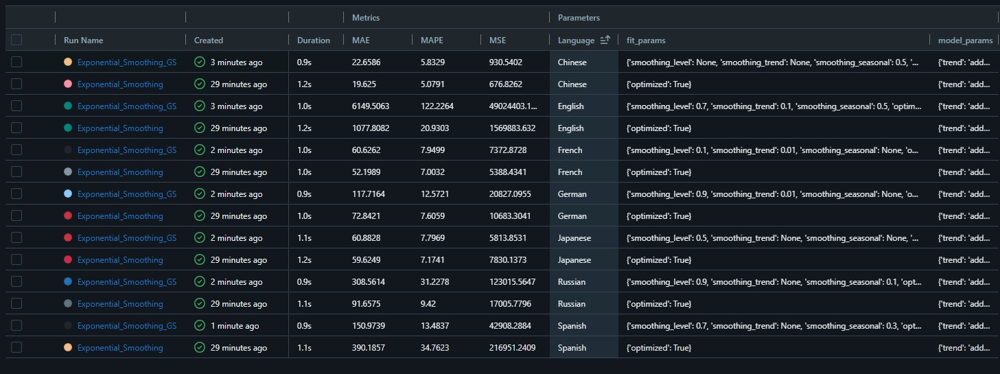


> We can clearly observe in above image that optimised alpha, beta , values produce better MAPE in all language except Spanish.
> Spanish best params obtained from grid search are `{'smoothing_level': 0.7, 'smoothing_trend': None, 'smoothing_seasonal': 0.3}` and `Mean Absolute Percentage Error: 13.48% (< 34.76%)`

> Exponential Smoothing methods are not performing well for our dataset particularly for ` English and Spanish` languages.

## ARIMA

Metrics for Chinese:
Mean Absolute Error: 25.4951
Mean Squared Error: 987.689
Mean Absolute Percentage Error: 6.6601%


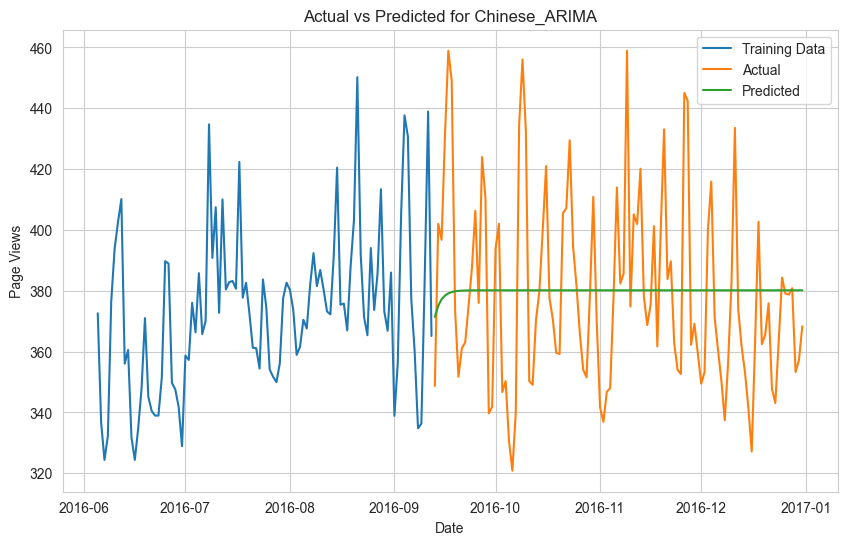

MLFlow logging is completed successfully
Metrics for English:
Mean Absolute Error: 370.2654
Mean Squared Error: 289787.5088
Mean Absolute Percentage Error: 6.9688%


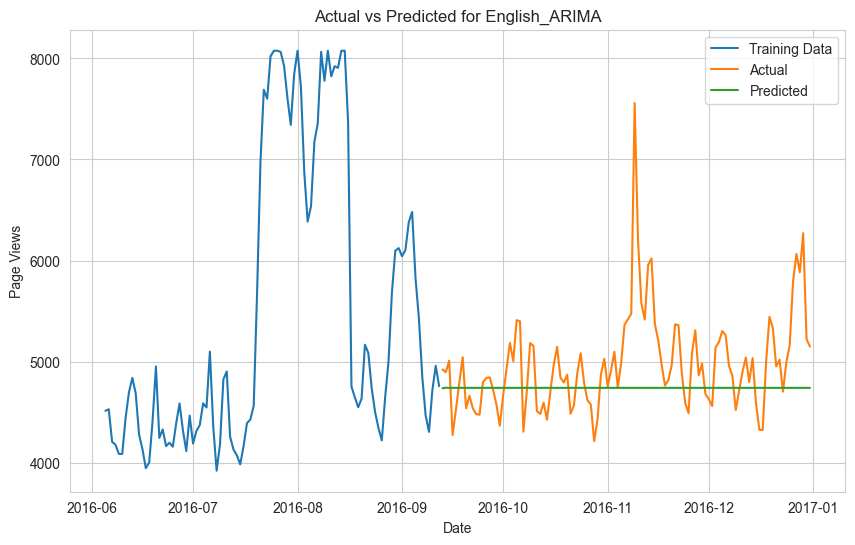

MLFlow logging is completed successfully
Metrics for French:
Mean Absolute Error: 64.1548
Mean Squared Error: 8067.3957
Mean Absolute Percentage Error: 8.4442%


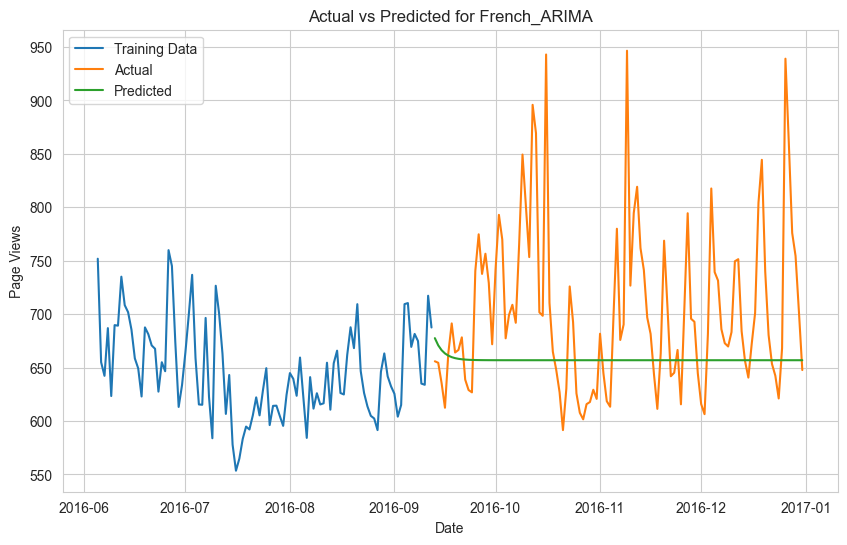

MLFlow logging is completed successfully
Metrics for German:
Mean Absolute Error: 94.7622
Mean Squared Error: 16013.9778
Mean Absolute Percentage Error: 9.9117%


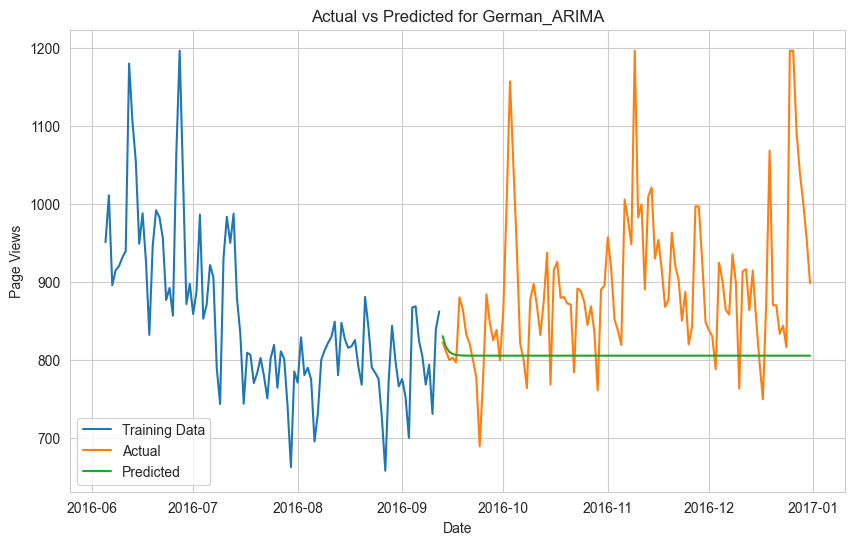

MLFlow logging is completed successfully
Metrics for Japanese:
Mean Absolute Error: 76.2515
Mean Squared Error: 8420.8853
Mean Absolute Percentage Error: 10.0069%


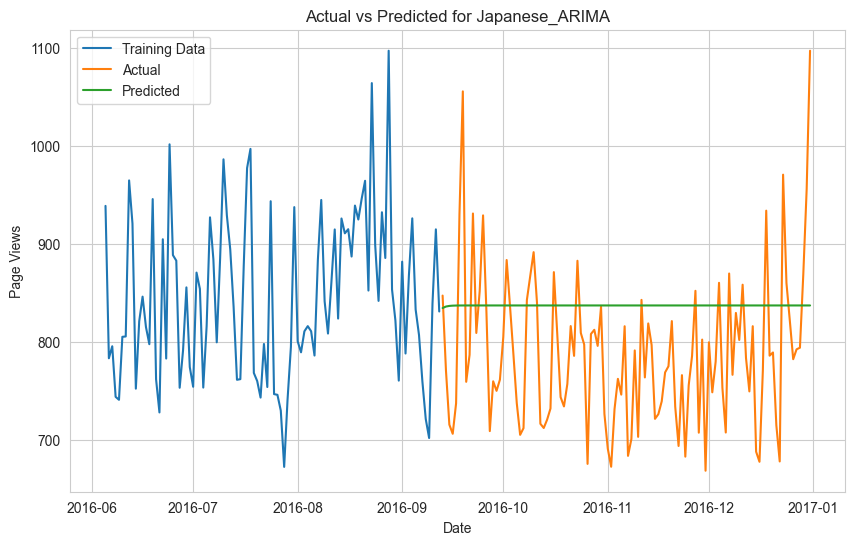

MLFlow logging is completed successfully
Metrics for Russian:
Mean Absolute Error: 98.4654
Mean Squared Error: 19952.0987
Mean Absolute Percentage Error: 9.4786%


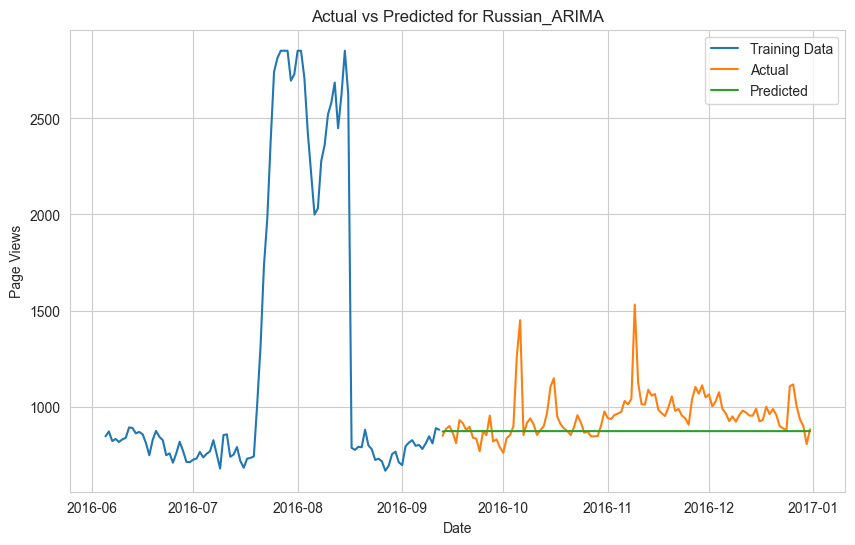

MLFlow logging is completed successfully
Metrics for Spanish:
Mean Absolute Error: 299.0527
Mean Squared Error: 129753.2502
Mean Absolute Percentage Error: 27.4975%


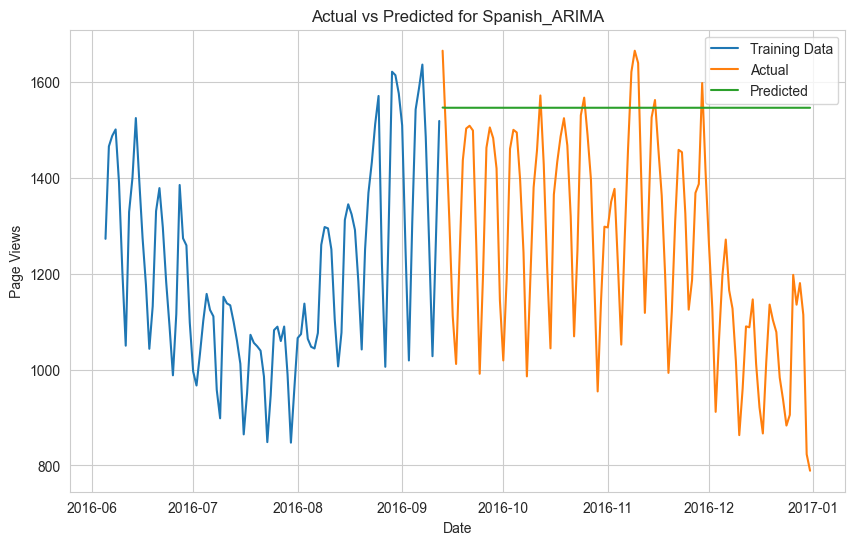

MLFlow logging is completed successfully


In [91]:
# Define model and fit parameters for ARIMA
params_arima = {
    "model_params": {
        "order": (1, 1, 1),  # Simple ARIMA(1,1,1) model
    },
    "fit_params": {}  # No additional fit parameters
}

# Run the logging and metric printing for each language
for language in train_dict.keys():
    run_name = "ARIMA"

    # Log model and metrics for ARIMA
    mlflow_logging_and_metric_printing(
        train_dict[language],
        test_dict[language],
        ARIMA,  # Corrected model class
        language,
        run_name,
        params_arima,
    )

### Grid Search ARIMA

In [92]:
def grid_search_arima(train, param_grid, tscv_splits=5):
    warnings.filterwarnings("ignore")

    best_score, best_params = float("inf"), None
    tscv = TimeSeriesSplit(n_splits=tscv_splits)

    # Iterate through all possible combinations of p, d, q
    for p in param_grid["p"]:
        for d in param_grid["d"]:
            for q in param_grid["q"]:
                try:
                    errors = []
                    for train_idx, val_idx in tscv.split(train):
                        train_split, val_split = train.iloc[train_idx], train.iloc[val_idx]

                        # Define and fit ARIMA model
                        model = ARIMA(train_split, order=(p, d, q),enforce_stationarity=False,enforce_invertibility=False)
                        results = model.fit()

                        # Forecast and calculate error
                        predictions = results.forecast(steps=len(val_split))
                        error = mape(val_split, predictions)
                        errors.append(error)

                    # Calculate average error
                    avg_error = np.mean(errors)
                    if avg_error < best_score:
                        best_score = avg_error
                        best_params = {
                            "model_params": {
                                "order": (p, d, q),
                            },
                            "fit_params": {},  # No additional fit parameters for ARIMA
                        }
                except Exception as e:
                    print(f"Error occurred with params ({p}, {d}, {q}): {e}")
                    continue

    print(f"Best params: {best_params} with MSE: {best_score}%")
    return best_params


Processing language: Chinese


Best params: {'model_params': {'order': (2, 2, 2)}, 'fit_params': {}} with MSE: 0.07506106601753548%
Metrics for Chinese:
Mean Absolute Error: 31.0577
Mean Squared Error: 1328.7054
Mean Absolute Percentage Error: 8.2398%


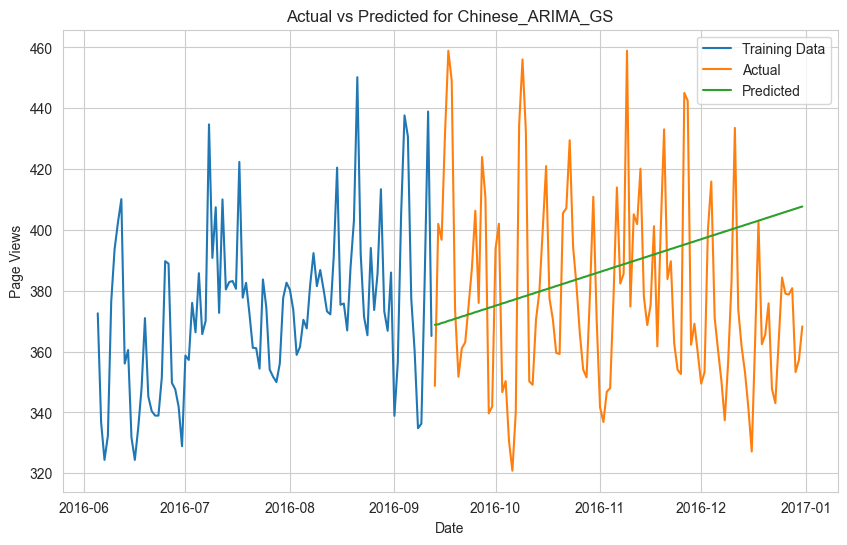

MLFlow logging is completed successfully
Processing language: English
Best params: {'model_params': {'order': (1, 2, 2)}, 'fit_params': {}} with MSE: 0.09889688042370148%
Metrics for English:
Mean Absolute Error: 323.9193
Mean Squared Error: 211315.2543
Mean Absolute Percentage Error: 6.3407%


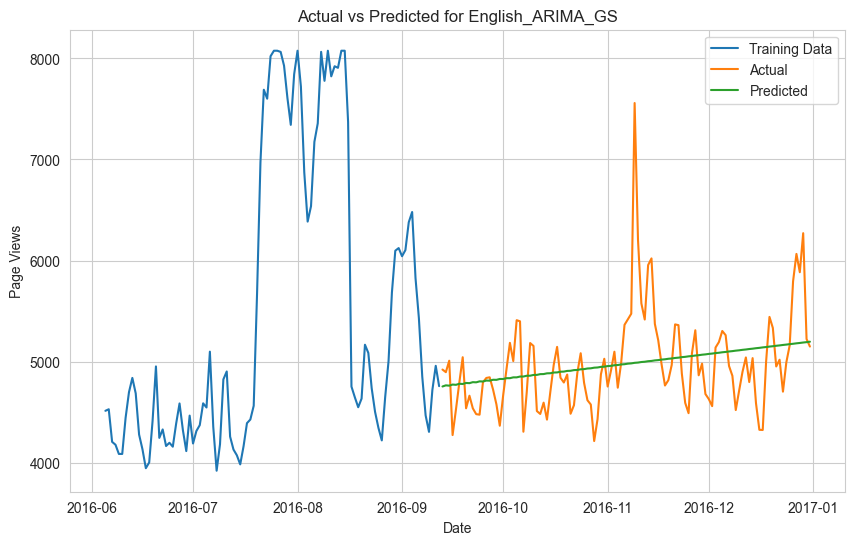

MLFlow logging is completed successfully
Processing language: French
Best params: {'model_params': {'order': (1, 0, 1)}, 'fit_params': {}} with MSE: 0.10846894421306967%
Metrics for French:
Mean Absolute Error: 69.8231
Mean Squared Error: 9407.3568
Mean Absolute Percentage Error: 9.1568%


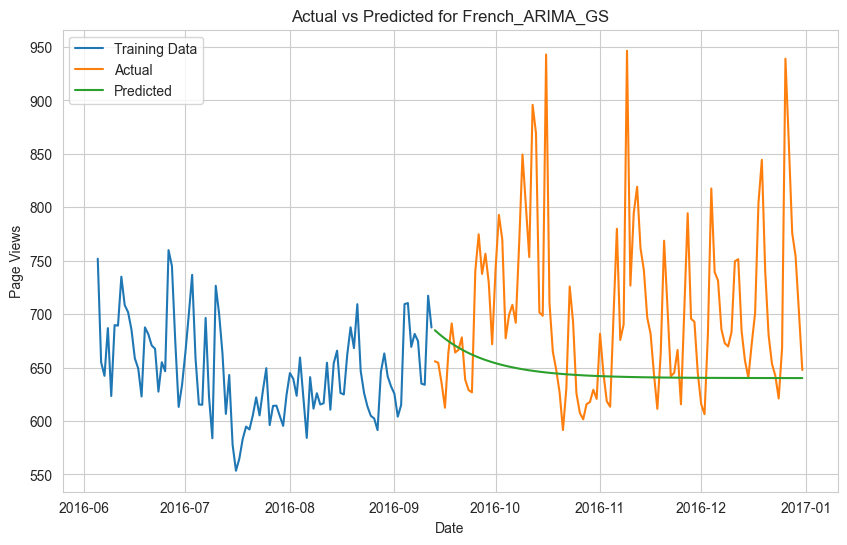

MLFlow logging is completed successfully
Processing language: German
Best params: {'model_params': {'order': (3, 2, 3)}, 'fit_params': {}} with MSE: 0.07686196962112528%
Metrics for German:
Mean Absolute Error: 64.3134
Mean Squared Error: 8765.1466
Mean Absolute Percentage Error: 6.7684%


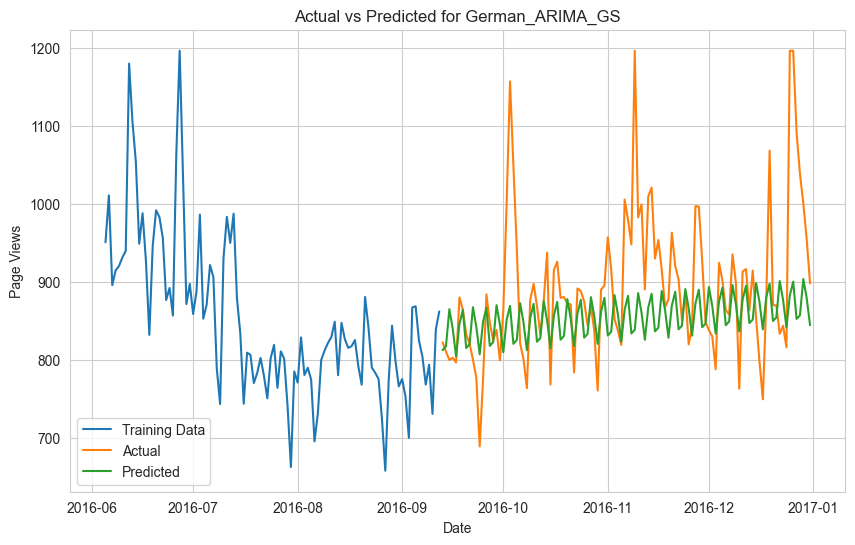

MLFlow logging is completed successfully
Processing language: Japanese
Best params: {'model_params': {'order': (3, 1, 3)}, 'fit_params': {}} with MSE: 0.0998489893551146%
Metrics for Japanese:
Mean Absolute Error: 57.2688
Mean Squared Error: 5401.9307
Mean Absolute Percentage Error: 7.3368%


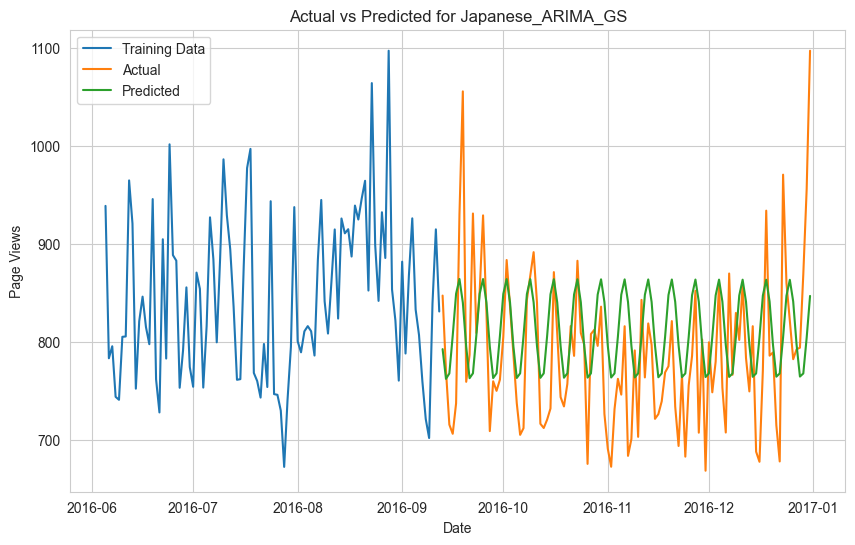

MLFlow logging is completed successfully
Processing language: Russian
Best params: {'model_params': {'order': (1, 1, 0)}, 'fit_params': {}} with MSE: 0.1265115506277504%
Metrics for Russian:
Mean Absolute Error: 95.3818
Mean Squared Error: 19060.032
Mean Absolute Percentage Error: 9.1859%


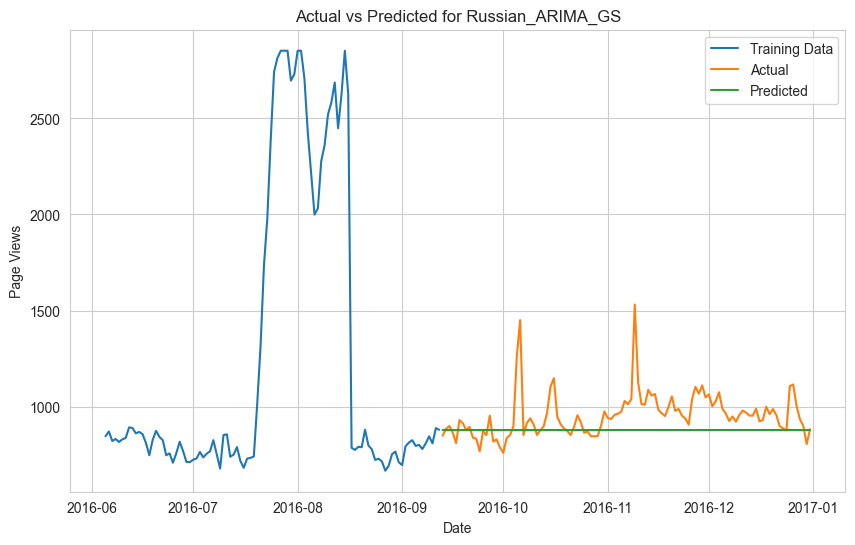

MLFlow logging is completed successfully
Processing language: Spanish
Best params: {'model_params': {'order': (2, 1, 3)}, 'fit_params': {}} with MSE: 0.1487154264298282%
Metrics for Spanish:
Mean Absolute Error: 171.4252
Mean Squared Error: 48344.6333
Mean Absolute Percentage Error: 15.4435%


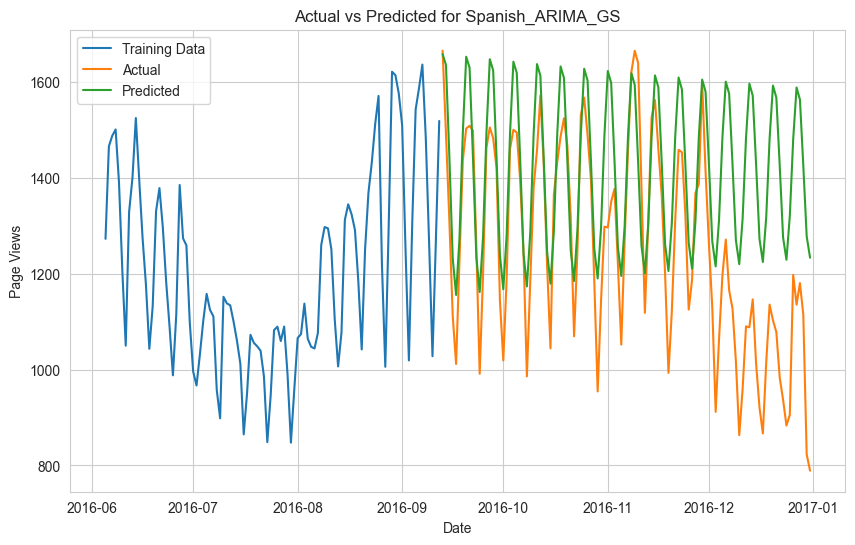

MLFlow logging is completed successfully


In [93]:
warnings.filterwarnings("ignore")

# Define ARIMA param grid
param_grid_arima = {
    "p": [0, 1, 2, 3],  # Possible AR terms
    "d": [0, 1, 2],     # Possible differencing orders
    "q": [0, 1, 2, 3],  # Possible MA terms
}
# Run grid search for ARIMA
for language in train_dict.keys():
    print(f"Processing language: {language}")

    # Get best ARIMA params
    best_params_arima = grid_search_arima(train_dict[language], param_grid_arima)

    # Define run name
    run_name = "ARIMA_GS"

    # Log model and metrics with best params
    mlflow_logging_and_metric_printing(
        train_dict[language],
        test_dict[language],
        ARIMA,  # Pass ARIMA model
        language,
        run_name,
        best_params_arima,
    )

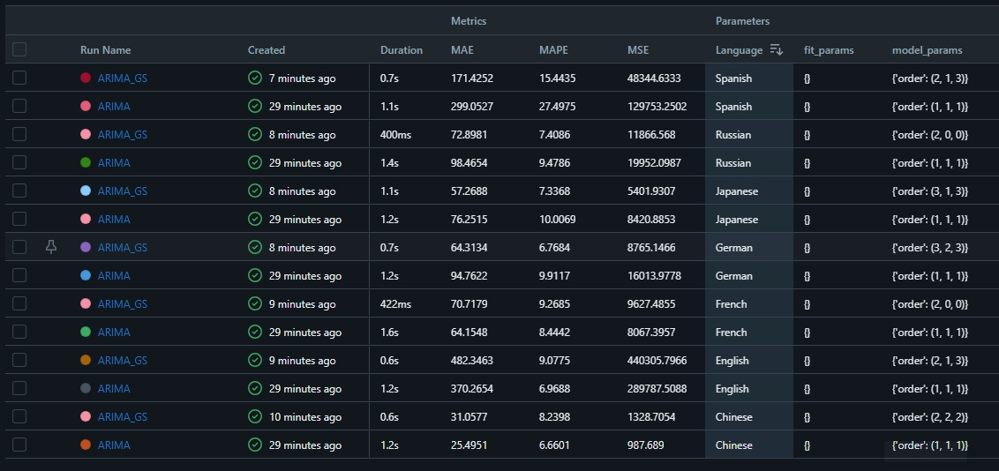


**Observations**
> `Spanish, Russian,Japanese,German` are performed better with ARIMA grid search parameters based on MAPE.

> `French,English,Chinese` are performed better with simple ARIMA model based on MAPE. 

## SARIMAX

Metrics for Chinese:
Mean Absolute Error: 24.049
Mean Squared Error: 853.3807
Mean Absolute Percentage Error: 6.4283%


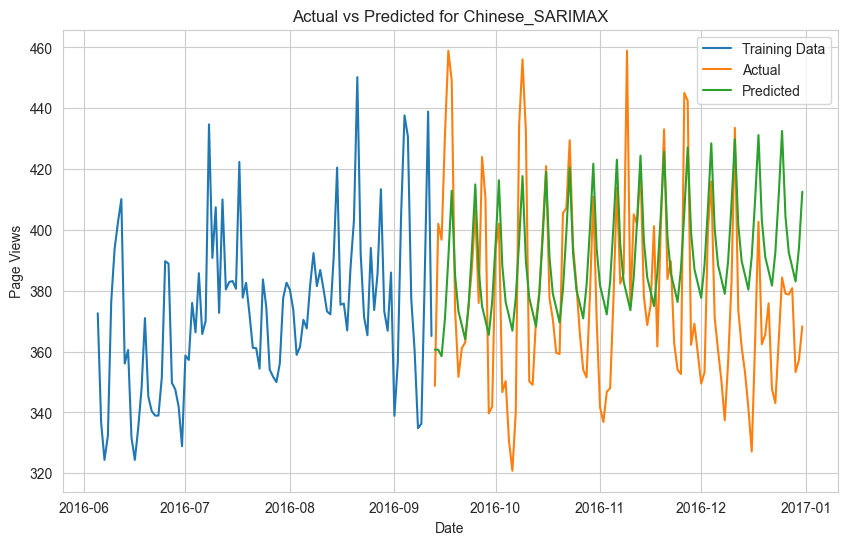

MLFlow logging is completed successfully
Metrics for English:
Mean Absolute Error: 599.2184
Mean Squared Error: 454156.004
Mean Absolute Percentage Error: 12.2166%


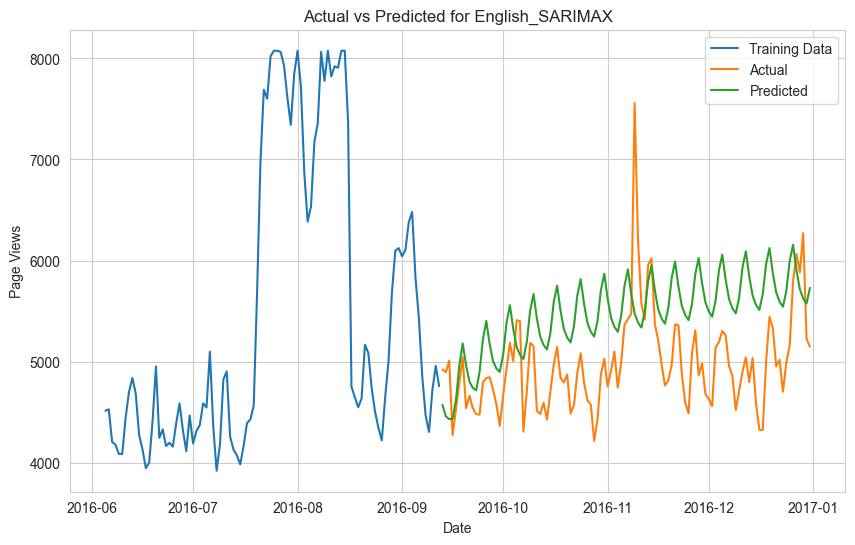

MLFlow logging is completed successfully
Metrics for French:
Mean Absolute Error: 63.3931
Mean Squared Error: 8025.6038
Mean Absolute Percentage Error: 8.2953%


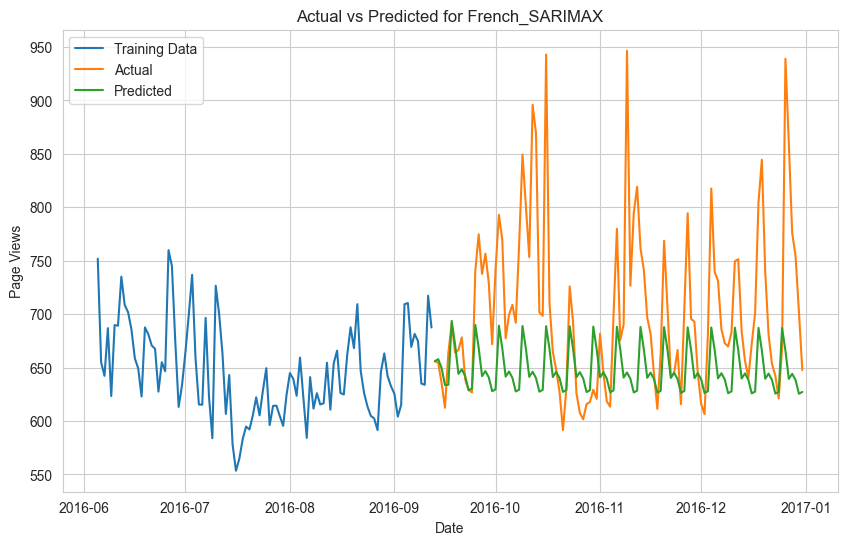

MLFlow logging is completed successfully
Metrics for German:
Mean Absolute Error: 121.3628
Mean Squared Error: 21578.864
Mean Absolute Percentage Error: 12.9875%


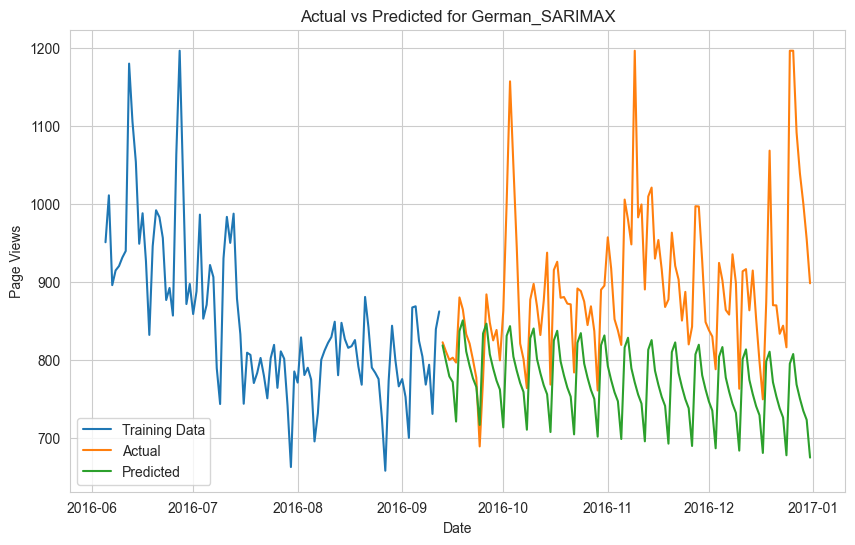

MLFlow logging is completed successfully
Metrics for Japanese:
Mean Absolute Error: 58.164
Mean Squared Error: 5394.8279
Mean Absolute Percentage Error: 7.4411%


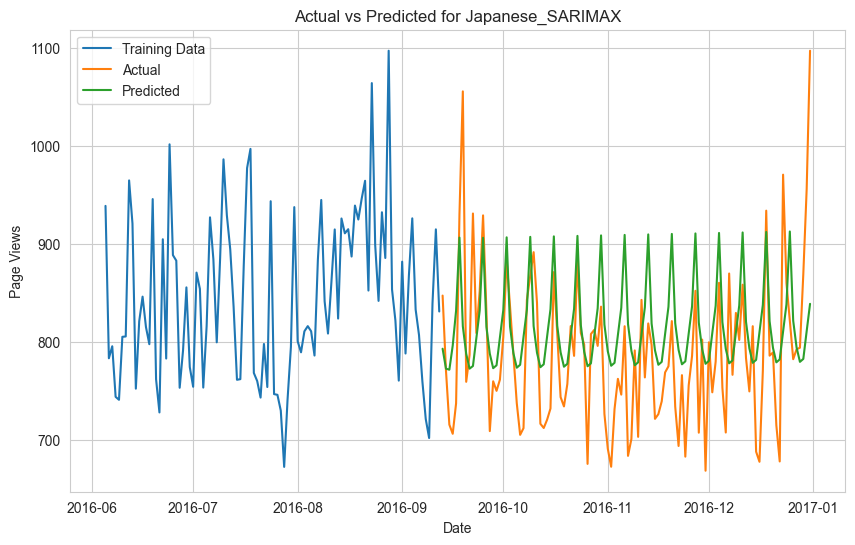

MLFlow logging is completed successfully
Metrics for Russian:
Mean Absolute Error: 248.9217
Mean Squared Error: 82792.006
Mean Absolute Percentage Error: 25.0015%


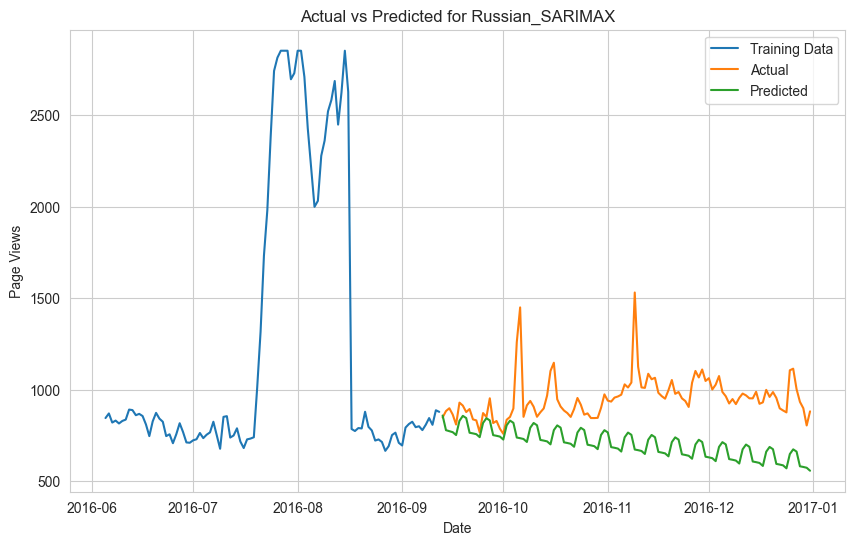

MLFlow logging is completed successfully
Metrics for Spanish:
Mean Absolute Error: 194.3994
Mean Squared Error: 63337.6165
Mean Absolute Percentage Error: 17.6549%


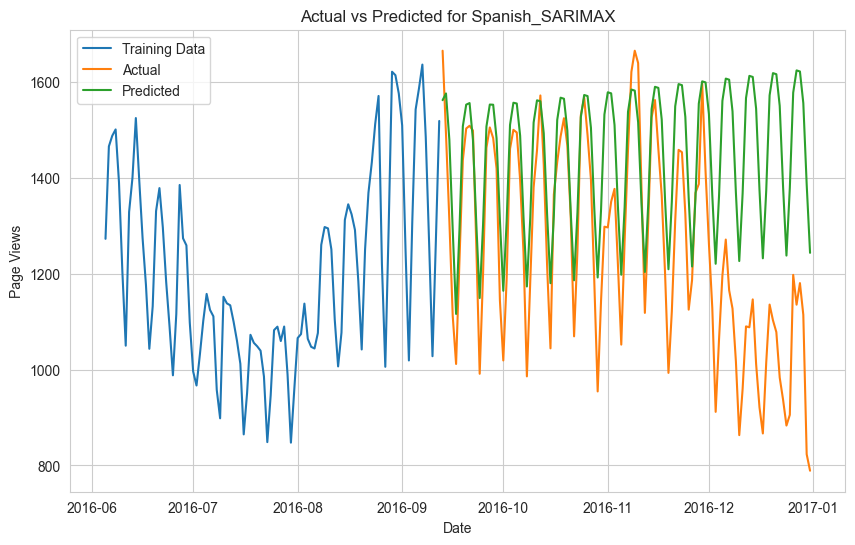

MLFlow logging is completed successfully


In [94]:
warnings.filterwarnings("ignore")

# Define model and fit parameters for SARIMAX
params_sarimax = {
    "model_params": {
        "order": (1, 1, 1),  # (p, d, q) for non-seasonal component
        "seasonal_order": (1, 1, 1, 7),  # (P, D, Q, S) for seasonal component (weekly seasonality)
        "enforce_stationarity": False,  # Avoid convergence errors
        "enforce_invertibility": False,
    },
    "fit_params": {}  # No additional fit parameters for SARIMAX
}

# Run the logging and metric printing for each language
for language in train_dict.keys():
    run_name = "SARIMAX"

    # Log model and metrics for SARIMAX
    mlflow_logging_and_metric_printing(
        train_dict[language],
        test_dict[language],
        SARIMAX,  # Corrected model class
        language,
        run_name,
        params_sarimax,
    )


### Grid Search SARIMAX

In [95]:
# Grid search for SARIMAX
def grid_search_sarimax(train, param_grid, tscv_splits=5):
    warnings.filterwarnings("ignore")

    best_score, best_params = float("inf"), None
    tscv = TimeSeriesSplit(n_splits=tscv_splits)

    # Iterate through all possible combinations of p, d, q, P, D, Q, S
    for p in param_grid["p"]:
        for d in param_grid["d"]:
            for q in param_grid["q"]:
                for P in param_grid["P"]:
                    for D in param_grid["D"]:
                        for Q in param_grid["Q"]:
                            for S in param_grid["S"]:
                                try:
                                    errors = []
                                    for train_idx, val_idx in tscv.split(train):
                                        train_split, val_split = (
                                            train.iloc[train_idx],
                                            train.iloc[val_idx],
                                        )

                                        # Define and fit SARIMAX model
                                        model = SARIMAX(
                                            train_split,
                                            order=(p, d, q),
                                            seasonal_order=(P, D, Q, S),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,
                                        )
                                        results = model.fit(disp=False)

                                        # Forecast and calculate error
                                        predictions = results.forecast(steps=len(val_split))
                                        error = mape(val_split, predictions)
                                        errors.append(error)

                                    # Calculate average error
                                    avg_error = np.mean(errors)
                                    if avg_error < best_score:
                                        best_score = avg_error
                                        best_params = {
                                            "model_params": {
                                                "order": (p, d, q),
                                                "seasonal_order": (P, D, Q, S),
                                                "enforce_stationarity": False,
                                                "enforce_invertibility": False,
                                            },
                                            "fit_params": {},  # No additional fit params
                                        }
                                except Exception as e:
                                    print(
                                        f"Error occurred with params ({p}, {d}, {q}, {P}, {D}, {Q}, {S}): {e}"
                                    )
                                    continue

    print(f"Best params: {best_params} with MSE: {best_score}%")
    return best_params


Processing language: Chinese
Best params: {'model_params': {'order': (2, 2, 2), 'seasonal_order': (0, 0, 0, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.07506106601753548%
Metrics for Chinese:
Mean Absolute Error: 29.897
Mean Squared Error: 1242.0968
Mean Absolute Percentage Error: 7.9136%


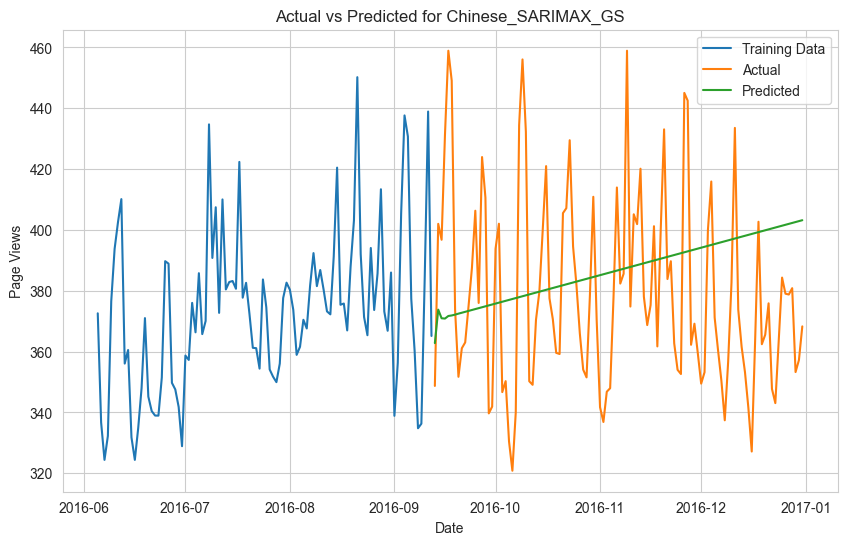

MLFlow logging is completed successfully
Processing language: English
Best params: {'model_params': {'order': (0, 1, 0), 'seasonal_order': (1, 0, 1, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.09884788553744443%
Metrics for English:
Mean Absolute Error: 629.8345
Mean Squared Error: 613944.7869
Mean Absolute Percentage Error: 12.0524%


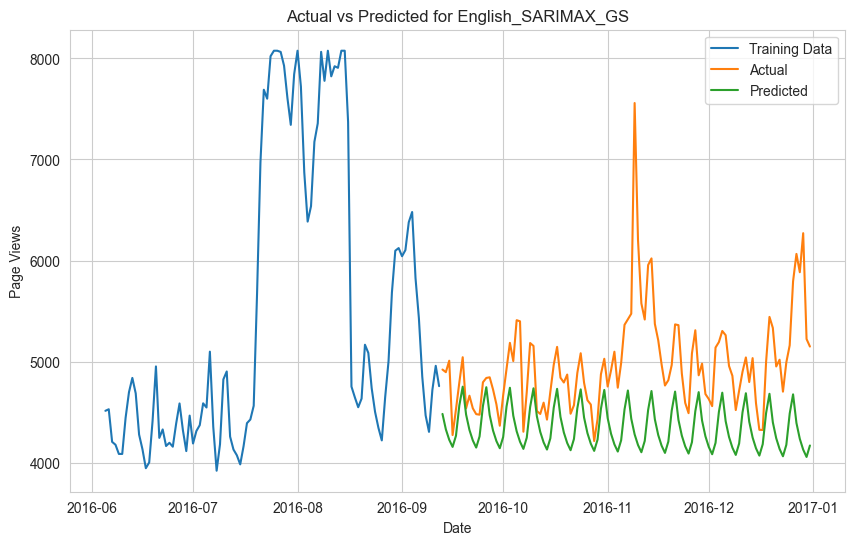

MLFlow logging is completed successfully
Processing language: French
Best params: {'model_params': {'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.0856720027770733%
Metrics for French:
Mean Absolute Error: 59.7394
Mean Squared Error: 7156.014
Mean Absolute Percentage Error: 7.8511%


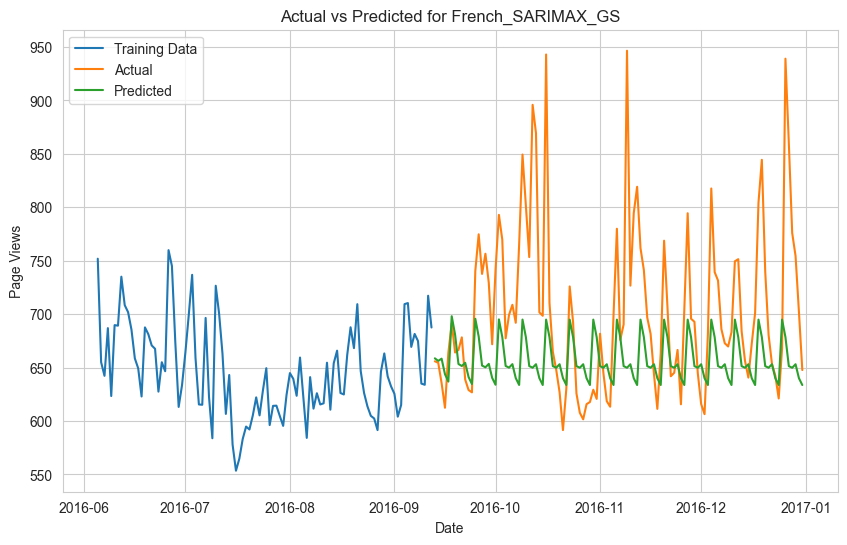

MLFlow logging is completed successfully
Processing language: German
Best params: {'model_params': {'order': (3, 0, 0), 'seasonal_order': (0, 0, 0, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.07028916765897307%
Metrics for German:
Mean Absolute Error: 113.4885
Mean Squared Error: 21488.4012
Mean Absolute Percentage Error: 11.9509%


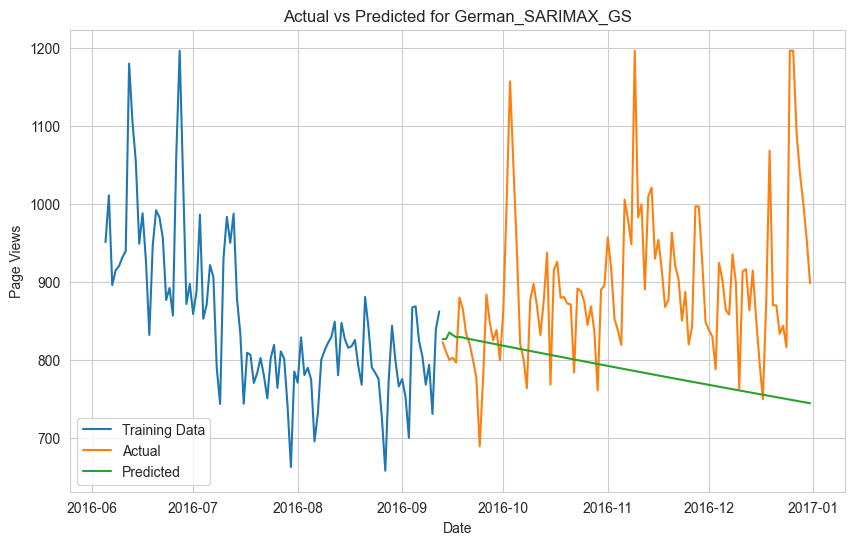

MLFlow logging is completed successfully
Processing language: Japanese
Best params: {'model_params': {'order': (1, 0, 0), 'seasonal_order': (0, 1, 1, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.08698046125595732%
Metrics for Japanese:
Mean Absolute Error: 74.9386
Mean Squared Error: 7865.0242
Mean Absolute Percentage Error: 9.7254%


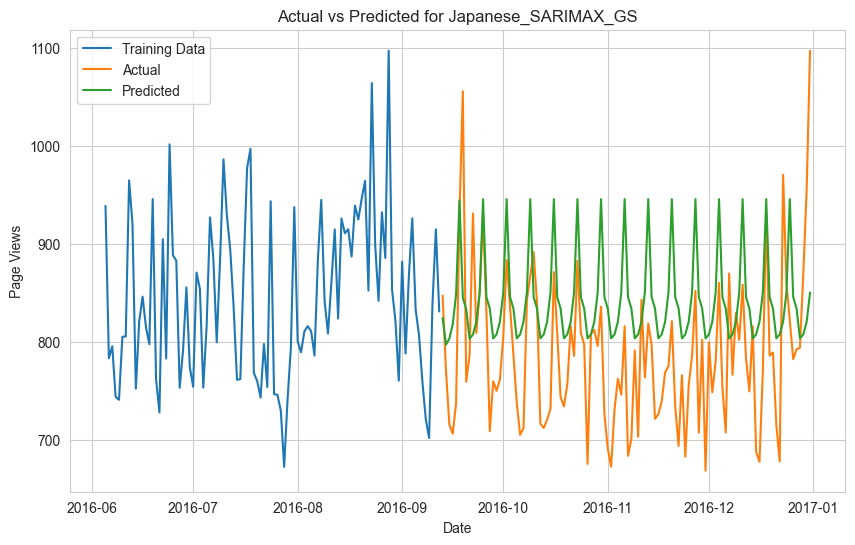

MLFlow logging is completed successfully
Processing language: Russian
Best params: {'model_params': {'order': (0, 1, 1), 'seasonal_order': (1, 0, 1, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.11916103691414599%
Metrics for Russian:
Mean Absolute Error: 282.5719
Mean Squared Error: 103742.1406
Mean Absolute Percentage Error: 28.4135%


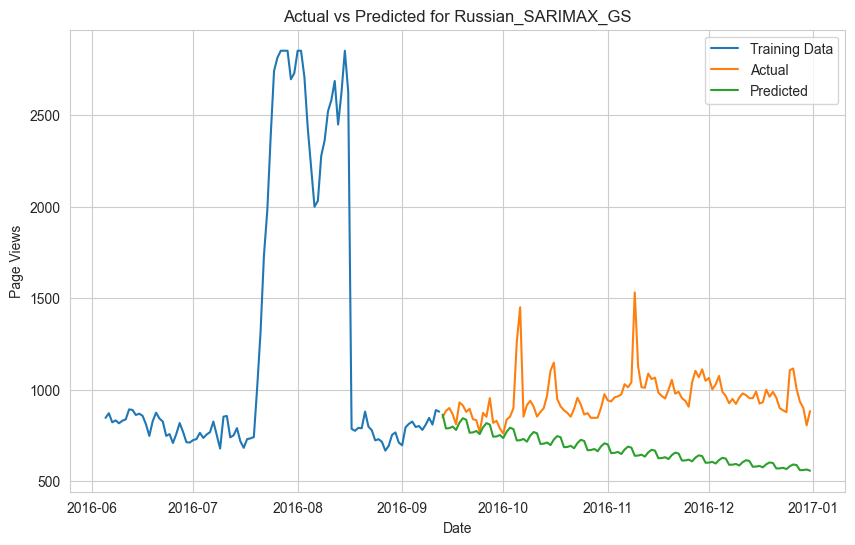

MLFlow logging is completed successfully
Processing language: Spanish
Best params: {'model_params': {'order': (3, 0, 1), 'seasonal_order': (1, 1, 1, 7), 'enforce_stationarity': False, 'enforce_invertibility': False}, 'fit_params': {}} with MSE: 0.10412346576778417%
Metrics for Spanish:
Mean Absolute Error: 111.029
Mean Squared Error: 19996.1532
Mean Absolute Percentage Error: 9.5003%


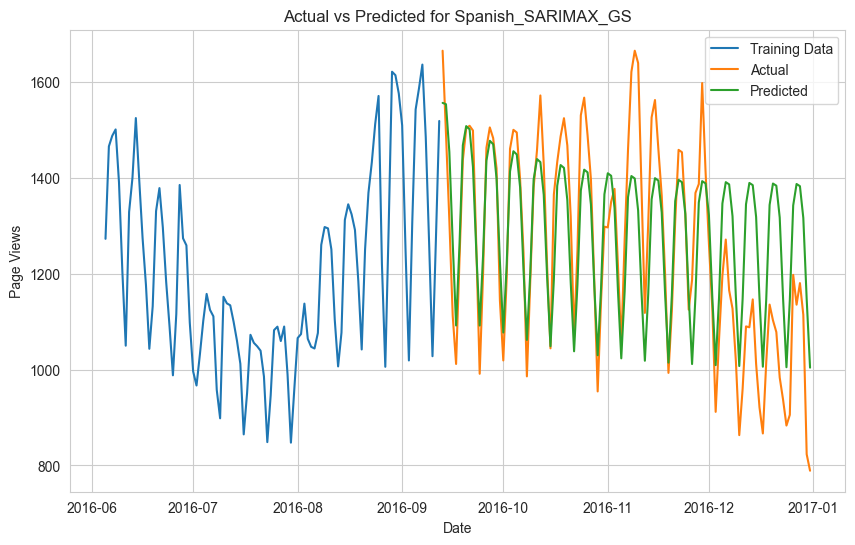

MLFlow logging is completed successfully


In [96]:
warnings.filterwarnings("ignore")

# Define SARIMAX param grid
param_grid_sarimax = {
    "p": [0, 1, 2, 3],     # Possible AR terms
    "d": [0, 1, 2],        # Possible differencing orders
    "q": [0, 1, 2, 3],     # Possible MA terms
    "P": [0, 1],           # Possible seasonal AR terms
    "D": [0, 1],           # Possible seasonal differencing orders
    "Q": [0, 1],           # Possible seasonal MA terms
    "S": [7],              # Seasonal period (e.g., 7 for weekly seasonality)
}

# Run grid search for SARIMAX
for language in train_dict.keys():
    print(f"Processing language: {language}")

    # Get best SARIMAX params
    best_params_sarimax = grid_search_sarimax(train_dict[language], param_grid_sarimax)

    # Define run name
    run_name = "SARIMAX_GS"

    # Log model and metrics with best params
    mlflow_logging_and_metric_printing(
        train_dict[language],
        test_dict[language],
        SARIMAX,  # Pass SARIMAX model
        language,
        run_name,
        best_params_sarimax,
    )


### SARIMAX with exog_data for English language

#### Modified MLFLOW function for exog_data

In [123]:
def mlflow_logging_and_metric_printing(train, test, model_class, language, run_name, params, exog_test=None):
    with mlflow.start_run(run_name=run_name):
        try:
            # Log language
            mlflow.log_param("Language", language)

            # Extract model and fit parameters from nested dictionary
            model_params = params.get("model_params", {})
            fit_params = params.get("fit_params", {})

            # Log all parameters
            mlflow.log_params({"model_params": model_params, "fit_params": fit_params})

            # Initialize and fit the SARIMAX model
            model = model_class(
                train,
                exog=exog_train if exog_test is not None else None,
                **model_params,
            )
            results = model.fit(**fit_params)

            # Forecast using test data
            test_pred = results.forecast(steps=len(test), exog=exog_test)

            # Save the model using pickle
            model_path = f"{language}_{run_name}.pkl"
            with open(model_path, "wb") as f:
                pickle.dump(results, f)

            # Log the model artifact
            mlflow.log_artifact(model_path, artifact_path="models")

            # Calculate and log metrics
            mae_score = round(mae(test, test_pred), 4)
            mse_score = round(mse(test, test_pred), 4)
            mape_score = round(mape(test, test_pred) * 100, 4)

            mlflow.log_metric("MAE", mae_score)
            mlflow.log_metric("MSE", mse_score)
            mlflow.log_metric("MAPE", mape_score)

            # Print metrics
            print(f"Metrics for {language}:")
            print(f"Mean Absolute Error: {mae_score}")
            print(f"Mean Squared Error: {mse_score}")
            print(f"Mean Absolute Percentage Error: {mape_score}%")

            # Plot actual vs predicted
            plt.figure(figsize=(10, 6))
            plt.plot(train[-100:], label="Training Data")
            plt.plot(test, label="Actual")
            plt.plot(test_pred, label="Predicted")
            plt.title(f"Actual vs Predicted for {language}_{run_name}")
            plt.xlabel("Date")
            plt.ylabel("Page Views")
            plt.legend()

            # Save and log the plot
            plot_path = f"actual_vs_predicted_{language}_{run_name}.png"
            plt.savefig(plot_path)
            plt.show()
            plt.close()

            mlflow.log_artifact(plot_path)

            # Clean up model and plot files
            os.remove(model_path)
            os.remove(plot_path)

            print("MLFlow logging completed successfully")

        except Exception as e:
            print(f"An error occurred for {language}_{run_name}: {e}")


In [ ]:

# Create datetime index for exog_data
start_date = pd.to_datetime("2015-07-01")  # Starting date of your data
exog_data.index = pd.date_range(start=start_date, periods=len(exog_data), freq="D")

# Split exog_data with 80:20 rule for 550 days
train_size = int(0.8 * len(exog_data))  # 440 rows for training, 110 for testing
exog_train, exog_test = exog_data.iloc[:train_size], exog_data.iloc[train_size:]

# Check correct lengths
print(f"Exog data aligned. Train size: {len(exog_train)}, Test size: {len(exog_test)}")


Exog data aligned. Train size: 440, Test size: 110


#### Grid Search SARIMAX with Exog data for English language

In [ ]:
def grid_search_sarimax(train, exog_train, param_grid, tscv_splits=5):
    warnings.filterwarnings("ignore")

    best_score, best_params = float("inf"), None
    tscv = TimeSeriesSplit(n_splits=tscv_splits)

    # Iterate through all possible combinations of p, d, q, P, D, Q, seasonal_period
    for p in param_grid["p"]:
        for d in param_grid["d"]:
            for q in param_grid["q"]:
                for P in param_grid["P"]:
                    for D in param_grid["D"]:
                        for Q in param_grid["Q"]:
                            for sp in param_grid["seasonal_period"]:
                                try:
                                    errors = []
                                    for train_idx, val_idx in tscv.split(train):
                                        train_split, val_split = train.iloc[train_idx], train.iloc[val_idx]
                                        exog_split_train, exog_split_val = (
                                            exog_train.iloc[train_idx],
                                            exog_train.iloc[val_idx],
                                        )

                                        # Define SARIMAX model
                                        model = SARIMAX(
                                            train_split,
                                            exog=exog_split_train,
                                            order=(p, d, q),
                                            seasonal_order=(P, D, Q, sp),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,
                                        )

                                        # Fit the model
                                        results = model.fit(disp=False)

                                        # Forecast and calculate error
                                        predictions = results.forecast(
                                            steps=len(val_split), exog=exog_split_val
                                        )
                                        error = mse(val_split, predictions)
                                        errors.append(error)

                                    # Calculate average error
                                    avg_error = np.mean(errors)
                                    if avg_error < best_score:
                                        best_score = avg_error
                                        best_params = {
                                            "model_params": {
                                                "order": (p, d, q),
                                                "seasonal_order": (P, D, Q, sp),
                                            },
                                            "fit_params": {},  # No additional fit params needed
                                        }
                                except Exception as e:
                                    print(f"Error occurred with params ({p}, {d}, {q}, {P}, {D}, {Q}, {sp}): {e}")
                                    continue

    print(f"Best params: {best_params} with MSE: {best_score}")
    return best_params


Best params: {'model_params': {'order': (0, 0, 1), 'seasonal_order': (1, 0, 0, 7)}, 'fit_params': {}} with MSE: 482441.4513866366
Metrics for English:
Mean Absolute Error: 567.4453
Mean Squared Error: 501314.6266
Mean Absolute Percentage Error: 10.904%


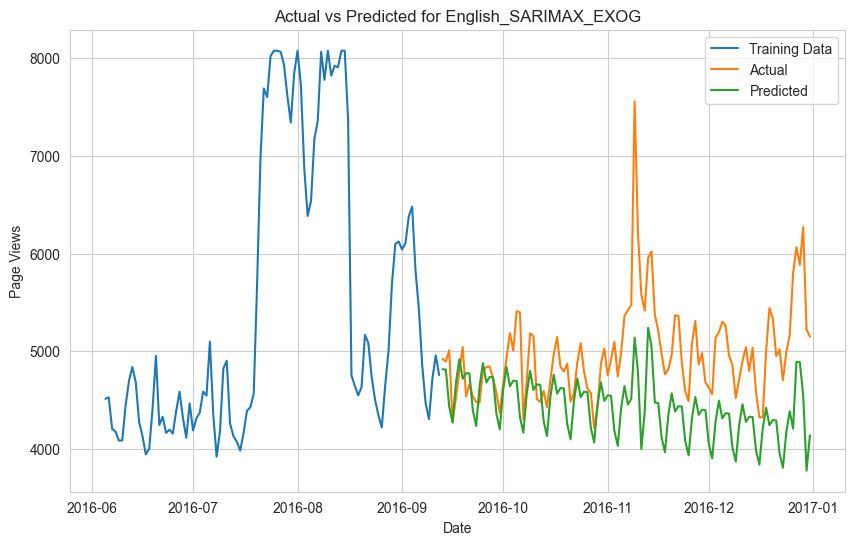

MLFlow logging completed successfully


In [ ]:
# Define SARIMAX param grid
param_grid_sarimax = {
    "p": [0, 1, 2, 3],
    "d": [0, 1],
    "q": [0, 1, 2, 3],
    "P": [0, 1],
    "D": [0, 1],
    "Q": [0, 1],
    "seasonal_period": [7],  # Weekly or bi-weekly seasonality
}

# Run grid search and get best params for SARIMAX with exog data
best_params_sarimax = grid_search_sarimax(train_dict["English"], exog_train, param_grid_sarimax)

# Define run name for SARIMAX with exogenous data
run_name = "SARIMAX_EXOG"

# ----------------------------
# Run model with best params and log metrics
# ----------------------------

mlflow_logging_and_metric_printing(
    train_dict["English"],
    test_dict["English"],
    SARIMAX,
    "English",
    run_name,
    best_params_sarimax,
    exog_test,
)


# CHAPTER 5: FACEBOOK PROPHET

In [215]:
time_series = clipped_data_dict["English"].copy(deep = True)
time_series = time_series.reset_index()
time_series = time_series[['index', 'English']]
time_series.columns = ['ds', 'y']
exog = exog_data.copy(deep = True)
time_series['exog'] = exog.values

21:36:12 - cmdstanpy - INFO - Chain [1] start processing
21:36:12 - cmdstanpy - INFO - Chain [1] done processing


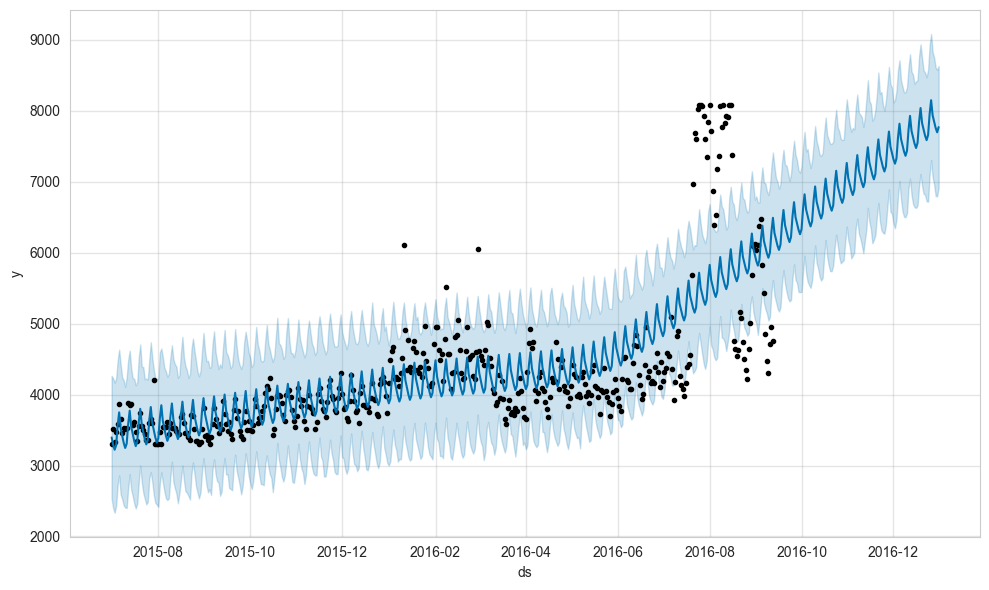

In [220]:
prophet1 = Prophet(weekly_seasonality=True)
prophet1.fit(time_series[['ds', 'y']][:-110])
future = prophet1.make_future_dataframe(periods=110, freq= 'D')
forecast = prophet1.predict(future)
fig1 = prophet1.plot(forecast)

21:36:20 - cmdstanpy - INFO - Chain [1] start processing
21:36:20 - cmdstanpy - INFO - Chain [1] done processing


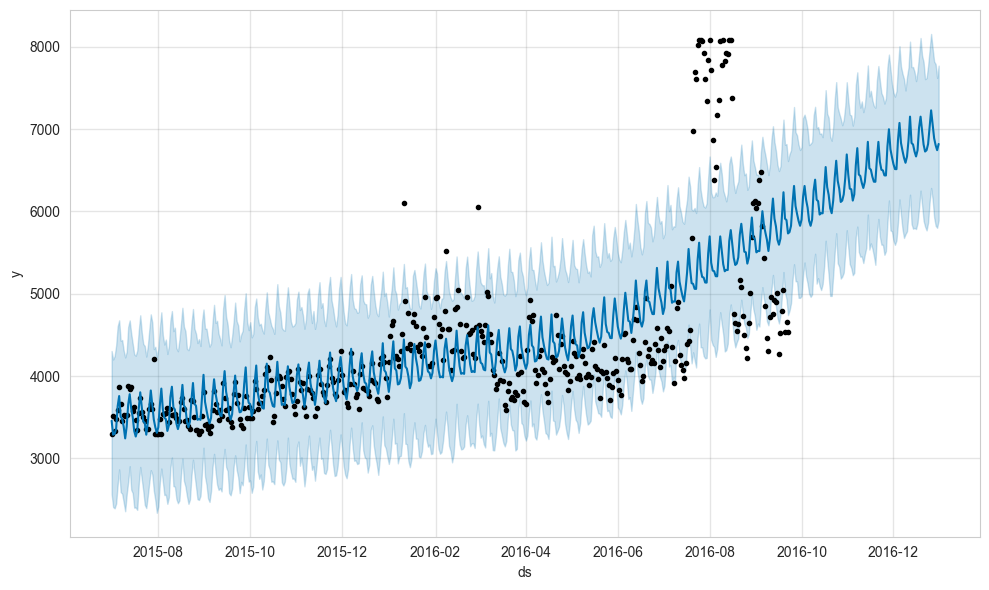

In [221]:
prophet2 = Prophet(weekly_seasonality=True)
prophet2.add_regressor('exog')
prophet2.fit(time_series[:-100])
#future2 = prophet2.make_future_dataframe(periods=100, freq= 'D')
forecast2 = prophet2.predict(time_series)
fig2 = prophet2.plot(forecast2)

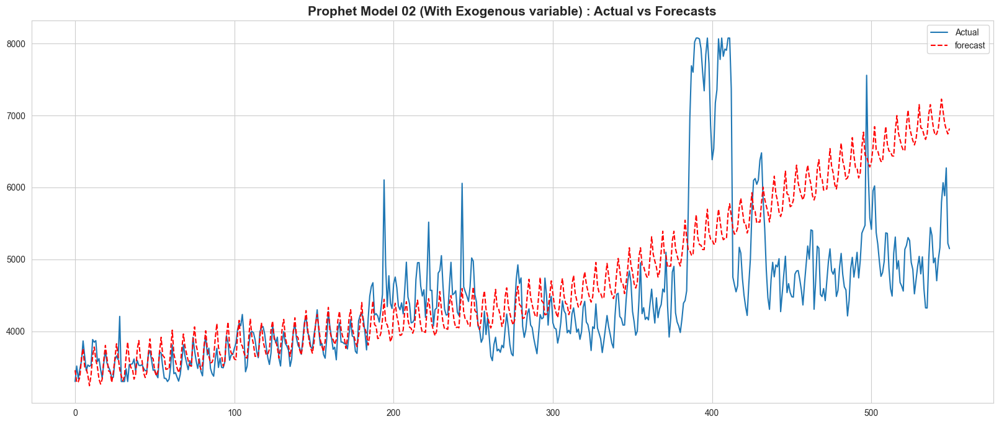

In [222]:
actual = time_series['y'].values
forecast = forecast2['yhat'].values

plt.figure(figsize = (20,8))
plt.plot(actual, label = 'Actual')
plt.plot(forecast, label = 'forecast', color = 'red', linestyle='dashed')
plt.legend(loc="upper right")
plt.title(f'Prophet Model 02 (With Exogenous variable) : Actual vs Forecasts', fontsize = 15, fontweight = 'bold')
plt.show()

In [223]:
errors = abs(actual - forecast)
mape = np.mean(errors/abs(actual))
mape

np.float64(0.13157485088617818)

# CHAPTER 6 PIPELINE

In [ ]:
import pandas as pd
import numpy as np
from prophet import Prophet
from sklearn.metrics import mean_absolute_percentage_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

def load_data(data_path: str, exog_path: str = None) -> tuple[pd.DataFrame, pd.DataFrame | None]:
    """Load time series and exogenous data"""
    raw_data = pd.read_csv(data_path)
    exog_data = None
    
    if exog_path:
        exog_data = pd.read_csv(exog_path)
        dates = pd.to_datetime(raw_data.columns[1:])
        exog_data.index = dates[:len(exog_data)]
    
    return raw_data, exog_data

def preprocess_series(raw_data: pd.DataFrame, 
                     exog_data: pd.DataFrame = None, 
                     pages: list[str] = None, 
                     min_data_points: int = 100) -> dict[str, pd.DataFrame]:
    """Preprocess multiple time series"""
    processed_series = {}
    
    if pages is None:
        pages = raw_data['Page'].tolist()
    
    for page in pages:
        series = raw_data[raw_data['Page'] == page].iloc[0, 1:]
        df = pd.DataFrame({
            'ds': pd.to_datetime(raw_data.columns[1:]),
            'y': series.values.astype(float)
        })
        
        if df['y'].isna().sum() < (len(df) - min_data_points):
            df['y'] = df['y'].interpolate().fillna(method='bfill')
            
            if exog_data is not None:
                df['exog'] = exog_data['Exog'].values[:len(df)]
            
            processed_series[page] = df
    
    return processed_series

def train_models(processed_series: dict[str, pd.DataFrame], 
                train_ratio: float = 0.8) -> dict[str, Prophet]:
    """Train Prophet models for each series"""
    models = {}
    
    for page, df in processed_series.items():
        train_size = int(len(df) * train_ratio)
        train_df = df.iloc[:train_size]
        
        model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=True
        )
        
        if 'exog' in df.columns:
            model.add_regressor('exog')
        
        model.fit(train_df)
        models[page] = model
    
    return models

def generate_forecasts(processed_series: dict[str, pd.DataFrame], 
                     models: dict[str, Prophet], 
                     horizon: int = None) -> dict[str, pd.DataFrame]:
    """Generate forecasts for all series"""
    forecasts = {}
    
    for page, model in models.items():
        df = processed_series[page]
        
        if horizon is None:
            train_size = int(len(df) * 0.8)
            horizon = len(df) - train_size
        
        if 'exog' in df.columns:
            future = df[['ds', 'exog']].iloc[-horizon:]
        else:
            future = model.make_future_dataframe(periods=horizon)
        
        forecast = model.predict(future)
        forecasts[page] = forecast
    
    return forecasts

def evaluate_performance(processed_series: dict[str, pd.DataFrame], 
                       forecasts: dict[str, pd.DataFrame]) -> dict[str, dict]:
    """Evaluate forecast performance"""
    metrics = {}
    
    for page in processed_series.keys():
        actual = processed_series[page]['y'].values
        train_size = int(len(actual) * 0.8)
        actual_test = actual[train_size:]
        forecast = forecasts[page]['yhat'].values[-len(actual_test):]
        
        mape = mean_absolute_percentage_error(actual_test, forecast)
        metrics[page] = {'MAPE': mape}
    
    return metrics

def plot_results(page: str, 
                processed_series: dict[str, pd.DataFrame], 
                forecasts: dict[str, pd.DataFrame], 
                figsize: tuple[int, int] = (15, 6)) -> None:
    """Plot actual vs forecast for a specific page"""
    actual = processed_series[page]['y'].values
    forecast = forecasts[page]['yhat'].values
    
    plt.figure(figsize=figsize)
    plt.plot(processed_series[page]['ds'], actual, label='Actual')
    plt.plot(processed_series[page]['ds'].iloc[-len(forecast):], 
            forecast, label='Forecast', color='red', linestyle='dashed')
    plt.legend(loc='upper right')
    plt.title(f'{page}: Actual vs Forecast', fontsize=12, fontweight='bold')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def run_full_pipeline(data_path: str, 
                     exog_path: str = None, 
                     pages: list[str] = None) -> dict[str, dict]:
    """Execute complete pipeline"""
    raw_data, exog_data = load_data(data_path, exog_path)
    processed_series = preprocess_series(raw_data, exog_data, pages)
    models = train_models(processed_series)
    forecasts = generate_forecasts(processed_series, models)
    metrics = evaluate_performance(processed_series, forecasts)
    return metrics

# Example usage
if __name__ == "__main__":
    pages_to_analyze = [
        '2NE1_zh.wikipedia.org_all-access_spider',
        '2PM_zh.wikipedia.org_all-access_spider',
        'AKB48_zh.wikipedia.org_all-access_spider'
    ]
    
    results = run_full_pipeline(
        data_path="train_1.csv",
        exog_path="Exog_Campaign_eng.csv",
        pages=pages_to_analyze
    )
    
    for page, metrics in results.items():
        print(f"\n{page}:")
        print(f"MAPE: {metrics['MAPE']:.4f}")
        
    # Need to recreate intermediate results for plotting
    raw_data, exog_data = load_data("train_1.csv", "Exog_Campaign_eng.csv")
    processed_series = preprocess_series(raw_data, exog_data, pages_to_analyze)
    models = train_models(processed_series)
    forecasts = generate_forecasts(processed_series, models)
    plot_results(pages_to_analyze[0], processed_series, forecasts)

# ACTIONABLE INSIGHTS AND RECOMMENDATIONS

### Final Observations  
1. **Data Quality & Preprocessing**:  
   - Significant missing values (14% initially), decreasing over time, were addressed via imputation (leading/trailing zeros, CMA).  
   - 652 pages had no views, suggesting inactive content. Filtering pages with ≥300 non-null days improved data reliability.  

2. **Language & Access Patterns**:  
   - **Top Languages**: English (24K pages), Japanese, German. Wikimedia.org and MediaWiki.org had fewer pages.  
   - **Access Type**: Majority via `all-access` (any device). Traffic origin dominated by `all-agents` (users + bots).  

3. **Time Series Characteristics**:  
   - Non-stationary trends with weak weekly seasonality (ACF/PACF peaks at lag 7). Differencing (d=1) achieved stationarity.  
   - Residuals post-decomposition were normally distributed, indicating effective trend/seasonality separation.  

4. **Model Performance**:  
   - **ARIMA/SARIMAX**: Outperformed Exponential Smoothing, with lower MAPE (e.g., English: 6.34% ARIMA vs. 20.93% ES).  
   - **Exogenous Variables**: SARIMAX with campaign data improved English forecasts (MAPE: 10.9%).  
   - **Prophet**: Achieved 13.16% MAPE for English with exogenous variables, showing potential for event-driven adjustments.  

---

### Actionable Insights  
1. **Prioritize High-Impact Languages**:  
   - Allocate ad budgets to English, Spanish, and Russian pages due to higher traffic volumes and model accuracy.  

2. **Optimize Missing Data Handling**:  
   - Use CMA for intermediate NaNs but exclude pages with <300 active days to reduce noise.  

3. **Leverage Seasonality & Campaigns**:  
   - Incorporate weekly patterns (e.g., weekend spikes) and exogenous events (campaigns) into forecasts for English pages.  

4. **Model Selection Strategy**:  
   - **ARIMA** for simplicity and consistency (e.g., Spanish: 15.44% MAPE).  
   - **SARIMAX** for languages with detectable seasonality (e.g., Japanese: 7.44% MAPE).  
   - **Prophet** for flexibility in capturing holidays/external events.  

---

### Recommendations  
1. **Deploy Hybrid Forecasting**:  
   - Use SARIMAX for languages with stable trends (e.g., German, Japanese) and Prophet for event-sensitive languages (e.g., English).  

2. **Real-Time Campaign Adjustments**:  
   - Integrate `Exog_Campaign_eng` data to dynamically update English page forecasts during marketing efforts.  

3. **Traffic Monitoring & Alerts**:  
   - Set thresholds for traffic anomalies (e.g., sudden spikes in Russian pages) to trigger ad reallocation.  

4. **Continuous Model Retraining**:  
   - Update models quarterly to adapt to new pages, language trends, and seasonal shifts.  

5. **Expand Exogenous Variables**:  
   - Collect campaign data for non-English languages to enhance SARIMAX/Prophet accuracy globally.  

**Example Workflow**:  
- **Ad Placement**: Target English Wikipedia pages on weekdays using SARIMAX forecasts.  
- **Budget Reallocation**: Redirect ads to Spanish pages during local events flagged in exogenous data.  
- **Performance Review**: Monthly validation of MAPE to ensure models stay within 5-15% error range.  

By aligning ad strategies with these insights, the company can maximize engagement while minimizing costs through data-driven decisions.

## Questionnaire

### Questionnaire Answers:

1. **Problem Statement & Applications**  
   The problem involves forecasting multilingual Wikipedia page traffic to optimize ad placement strategies using time series analysis. Modifications can be applied to retail demand forecasting, energy consumption prediction, or event-driven resource allocation in public health.

2. **Inferences from Data Visualizations**  
   - English pages had the highest traffic volume and variability, making them critical for ad targeting.  
   - Weak weekly seasonality was observed (ACF/PACF peaks at lag 7), suggesting weekend usage patterns.  
   - Missing values decreased over time, indicating newer pages were added progressively.  

3. **Purpose of Series Decomposition**  
   Decomposition splits the series into **trend** (long-term direction), **seasonality** (repeating patterns), and **residuals** (random noise), simplifying analysis and improving model accuracy.  

4. **Differencing for Stationarity**  
   **First-order differencing (d=1)** achieved stationarity, validated by the ADF test (p-value < 0.05 post-differencing).  

5. **ARIMA vs. SARIMA vs. SARIMAX**  
   - **ARIMA**: Models non-seasonal data with parameters (p,d,q).  
   - **SARIMA**: Adds seasonal parameters (P,D,Q,S) for periodic trends (e.g., weekly).  
   - **SARIMAX**: Incorporates exogenous variables (e.g., campaigns) alongside SARIMA components.  

6. **Language Traffic Comparison**  
   - **English**: Highest views (peaks ~8,000/day).  
   - **Spanish/Russian**: Moderate traffic (~2,000–3,000/day).  
   - **Chinese/Japanese**: Mid-range (~500–1,000/day).  
   - **French/German**: Lower (~200–600/day).  
   - **Wikimedia/MediaWiki**: Negligible (treated as "Unknown").  

7. **Alternatives to Grid Search**  
   - **Bayesian Optimization**: Efficiently navigates hyperparameter space.  
   - **AutoML Tools**: e.g., AutoARIMA or Prophet for automated parameter tuning.  
   - **Ensemble Methods**: Combine forecasts from ARIMA, SARIMAX, and Prophet for robustness.  

--- 